# Analisi delle emissioni e delle energie rinnovabili (UE)

Questo progetto analizza i principali gas serra nei Paesi dell'Unione Europea e confronta la loro evoluzione con la produzione di energia da fonti rinnovabili.  
Obiettivo principale: valutare la qualità dell'aria, l'utilizzo delle energie rinnovabili e l'efficienza delle politiche adottate.

Obiettivi:

1. Effettuare un’analisi descrittiva per:
   
   a. Identificare i Paesi più inquinanti;
   
   b. Analizzare il trend delle emissioni di gas e individuare trend positivi e negativi;
   
   c. Esaminare la correlazione tra energie rinnovabili e riduzione delle emissioni.
2. Creare modelli predittivi per stimare il futuro della sostenibilità ambientale fino al 2035:
   
   a. Predire la produzione di CO2 dei Paesi dell’Unione;
   
   b. Predire l’utilizzo di energie rinnovabili dei Paesi dell’Unione.
3. Focus sull’Italia:
   
   a. Effettuare un’analisi descrittiva sulla situazione attuale dell’Italia;
   
   b. Prevedere il posizionamento dell’Italia rispetto agli obiettivi UE (emissioni di gas serra e utilizzo di energie rinnovabili).
   
   c. Comparazione con la media europea.Da queste analisi, è necessario poi produrre un report tecnico con risultati, visualizzazioni e raccomandazione (slides).

# Librerie

In [1]:
import os
os.makedirs("img", exist_ok=True)
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
sns.set_theme()

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.models import load_model
from tensorflow.keras.losses import MeanSquaredError

# colori logo : #40908E verde acqua; #2A639E blu

/Users/davidebattilocchi/Desktop/Climate_Project/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


# Funzioni & Datasets
Funzioni principali per lo svolgimento dell'analisi e import dei vari datasets


## Funzioni

### load_datasets

In [2]:
def load_datasets(dict_paths):
    """
    Carica più datasets da un elenco di percorsi.
    Args:
        dict_paths (Dict): dizionario con chiavi i nomi dei dataset e valori i percorsi.
    Returns:
        dict: dizionario con i nomi dei DataFrame {nome_dataset: DataFrame}.
    """
    dataframes = {}
    for gas_name, path in dict_paths.items():
        try:
            df = pd.read_csv(path)
            print(f'{gas_name} caricato con succcesso da {path}, dimensinoni: {df.shape}')
            dataframes[gas_name] = df
        except FileNotFoundError:
            print(f'File non trovato da: {path}')
    return dataframes

### filter_eu_countries

In [3]:
# Paesi dell'Unione Europea
EU_COUNTRIES = [
    'Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia',
    'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece',
    'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
    'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovakia',
    'Slovenia', 'Spain', 'Sweden'
    ]

def filter_eu_countries(df):
    """
    Filtra i paesi dell'Unione Europea da un DataFrame.
    Args:
        df (DataFrame): DataFrame con i dati delle emissioni.
    Returns:
        DataFrame: DataFrame filtrato con solo i paesi dell'Unione Europea.
    """
    return df[df['Country'].isin(EU_COUNTRIES)].copy().reset_index(drop=True)

### convert_values_to_numeric

In [4]:
def convert_values_to_numeric(df):
    """
    Converte i valori delle colonne di un DataFrame in tipo numerico.
    I valori non convertibili verranno sostituiti con NaN.
    Args:
        df(DataFrame): DataFrame con i dati delle emissionni.
    Returns:
        DataFrame: DataFrame con i valori convertiti in numerico.
        list: lista delle colonne convertite.
    """
    df = df.copy()
    num_cols = []
    for col in df.columns:
        if col != 'Country':
            df[col] = pd.to_numeric(df[col], errors = 'coerce')
            num_cols.append(col)
    return df, num_cols


### calculate_emissions

In [5]:
def calculate_emissions(df):
    """
    Calcola le emissioni totali per ogni anno in un DataFrame.
    Args:
        df(DataFrame): DataFrame con i dati delle emissioni.
    Returns:
        DataFrame: DataFrame con le emissioni totali per ogni anno.
    """
    df = df.copy()
    df, num_cols = convert_values_to_numeric(df)
    df['Total_Emissions'] = df[num_cols].sum(axis=1)    # somma delle emissioni
    df['Average_Emissions'] = df[num_cols].mean(axis=1) # media delle emissioni
    df['Max_Emission'] = df[num_cols].max(axis=1)    # emissione massima
    df['Year_Max_Emission'] = df[num_cols].idxmax(axis=1)   # anno di emissione massima
    df['Min_Emission'] = df[num_cols].min(axis=1)   # emissione minima
    df['Year_Min_Emission'] = df[num_cols].idxmin(axis=1)   # anno di emissione minima
    df_years = df[num_cols].copy()
    df_variation = df_years.pct_change(axis='columns') * 100
    df['Variazione_percentuale_media'] = df_variation.mean(axis='columns')  # variazione percentuale media
    return df

### barplot_emissions_country

In [6]:
def barplot_emissions_country(df, metric, title, ax=None):
    """
    Crea un barplot ordinato in base a una metrica (es. Total_Emissions o Average_Emissions).

    Args:
        df (DataFrame): Il dataframe con i dati.
        metric (str): La colonna da usare per ordinare e plottare.
        title (str): Il titolo del grafico.
        ax (matplotlib.axes._axes.Axes, optional): L'asse su cui disegnare il grafico (per subplot).
    """
    sorted_df = df.sort_values(by=metric, ascending=False)
    colori = sns.light_palette('#40908E', n_colors=1.5*len(sorted_df), reverse=True)

    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 10))

    sns.barplot(
        data=sorted_df,
        x=metric,
        y='Country',
        palette=colori,
        hue = 'Country',
        ax=ax
    )

    ax.axvline(x=df[metric].max(), color='red', linestyle='--', label=f"Max: {df[metric].max():.0f}")
    ax.axvline(x=df[metric].min(), color='green', linestyle='--', label=f"Min: {df[metric].min():.0f}")
    ax.axvline(x=df[metric].mean(), color='blue', linestyle='--', label=f"Mean: {df[metric].mean():.0f}")
    ax.axvline(x=df[metric].median(), color='orange', linestyle='--', label=f"Median: {df[metric].median():.0f}")

    ax.set_title(title, fontsize=18, fontweight='bold', color='grey')
    ax.set_xlabel(f'{metric.replace("_", " ")} in Tons')
    ax.set_ylabel('Country')
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
    for i, value in enumerate(sorted_df[metric]):
        ax.text(
            value,
            i,
            f"{value:.0f}",
            va='center',
            ha='left',
            fontsize=10,
            fontweight='bold'
        )
        

### lineplot_trend_country

In [7]:
def lineplot_trend_country(df, gas_name):
    """
    Plotta il trend delle emissioni per ogni paese del dataframe specificando il nome del gas.
    Args:
        df(DataFrame): DataFrame con i dati delle emissioni.
        gas_name (str): Nome del gas da plottare.
    Returns:
        plt.figure: Figura con il grafico delle emissioni.
    """
    plt.figure(figsize=(22, 10))
    for country in df['Country']:
        country_data = df[df['Country'] == country]
        sns.lineplot(
            x = country_data.columns[1:-7],
            y = country_data.iloc[0,1:-7],
            label = country
        )
        sns.scatterplot(
            x = [country_data['Year_Min_Emission'].values[0]],
            y = [country_data['Min_Emission'].values[0]],
            marker='o',
            label = f'Minimum Emission: {country_data["Min_Emission"].values[0]}'
        )
    plt.title(f'{gas_name}: Emission\'s trend for each country', fontsize=22, fontweight='bold', color='#2A639E')
    plt.xlabel('Years')
    plt.ylabel('Emissions in Tons')
    plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2)
    plt.tight_layout()
    plt.savefig(f'img/{gas_name}: Emission\'s trend for each country', bbox_inches = 'tight')
    plt.show()
    

### barplot_variation_country

In [8]:
def barplot_variation_country(df, gas_name):
    
    plt.figure(figsize=(22, 10))

    colori = sns.light_palette('#40908E', n_colors=1.5*len(df), reverse=True)

    sns.barplot(x='Variazione_percentuale_media',
                y='Country', 
                data=df.sort_values(by='Variazione_percentuale_media', ascending=True),
                hue='Country',
                palette=colori
                )

    plt.title(f'{gas_name}: Average Annual Percentage Change of Emissions by Country ', fontsize=22, fontweight='bold', color='#2A639E')
    plt.xlabel('Average Annual Percentage Change (%)')
    plt.ylabel('Country')

    plt.xticks(ticks=np.linspace(df['Variazione_percentuale_media'].min(), df['Variazione_percentuale_media'].max(), 10), rotation=45)
    plt.tight_layout()
    for i, value in enumerate(df['Variazione_percentuale_media'].sort_values(ascending=True)):
        plt.text(
            x = value,  # posizione X (più a sinistra)
            y = i,     # posizione Y (la riga della barra)
            s = f'{value:.2F}',  # cosa scrivere
            va = 'center',  # vertical alignment
            ha = 'right',   # horizontal alignment
            fontsize = 10,
            color = 'black',
            fontweight = 'bold'
        )
    plt.savefig(f'img/{gas_name}: Average Annual Percentage Change of Emissions by Country ', bbox_inches = 'tight')
    plt.show()

### calculate_correlation

In [9]:
def calculate_correlation(df, gas_name):
    """
    Calcola la correlazione tra le emissioni di un gas serra e l'utilizzo di energie rinnovabili.
    Args:
        df (DataFrame): DataFrame con i dati delle emissioni.
        gas_name (str): Nome del gas da analizzare.
    Returns:
        DataFrame: Matrice di correlazione.
        DataFrame: DataFrame unito con le energie rinnovabili.
    """
    df2 = df[['Country','Total_Emissions']].copy()
    df_merge = pd.merge(df2, df_renewable_from_2005_mean, on='Country')
    df_corr = df_merge[['Total_Emissions', 'Renewable_Energy_Consumption_Mean']].corr()
    corr_value = df_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean']
    print(f'Correlazione tra {gas_name} e consumo di energia rinnovabile: {corr_value:.2f}')
    
    return df_corr, df_merge

### produzione di emissioni per km2 del paese

In [10]:
def bla(df, gas_name):
    # Dizionario con superficie per Paese
    superfici_dict = {
        'Austria': 83879,
        'Belgium': 30528,
        'Bulgaria': 110910,
        'Croatia': 56594,
        'Cyprus': 9250,
        'Czechia': 78866,           
        'Denmark': 43094,
        'Estonia': 45226,
        'Finland': 338145,
        'France': 551695,
        'Germany': 357022,
        'Greece': 131957,
        'Hungary': 93030,
        'Ireland': 70273,
        'Italy': 301340,
        'Latvia': 64589,
        'Lithuania': 65300,
        'Luxembourg': 2586,
        'Malta': 316,
        'Netherlands': 41543,
        'Poland': 312679,
        'Portugal': 92212,
        'Romania': 238397,
        'Slovakia': 49035,
        'Slovenia': 20273,
        'Spain': 505990,
        'Sweden': 450295
}
    colori = sns.light_palette('#40908E', n_colors=1.5*len(df), reverse=True)
    # Conversione in DataFrame
    df_superfici = pd.DataFrame(list(superfici_dict.items()), columns=['Country', 'Area_km2'])
    df = df.copy()
    df = df.merge(df_superfici, on='Country')
    df['Area_km2'] = df['Area_km2'].astype(int)
    df['Emission_per_km2'] = df['Total_Emissions'] / df['Area_km2']
    df = df.sort_values(by='Emission_per_km2', ascending=False)
    df['Emission_per_km2'] = df['Emission_per_km2'].round(2)
    df['Emission_per_km2'] = df['Emission_per_km2'].astype(float)
   
    plt.figure(figsize = (22, 10))
    sns.barplot(
            data = df,
            x = 'Emission_per_km2',
            y = 'Country',
            hue = 'Country',
            palette = colori,
        )
    plt.title(f'{gas_name}: Emissions per Square Kilometer by Country', fontsize= 22, fontweight='bold', color='#2A639E')
    plt.xlabel('tons / km2')
    plt.ylabel('Country')
    plt.axvline(x=df['Emission_per_km2'].max(), color='red', linestyle='--', label=f"Max: {df['Emission_per_km2'].max():.2f}")
    plt.axvline(x=df['Emission_per_km2'].min(), color='green', linestyle='--', label=f"Min: {df['Emission_per_km2'].min():.2f}")
    plt.axvline(x=df['Emission_per_km2'].mean(), color='blue', linestyle='--', label=f"Mean: {df['Emission_per_km2'].mean():.2f}")
    plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=2)
    for i, value in enumerate(df['Emission_per_km2']):
        plt.text(
            value,
            i,
            s = f'{value:.2f}',
            va='center',
            ha='left',
            fontsize=10,
            fontweight='bold'
        )
    plt.savefig(f'img/{gas_name}: Emissions per Square Kilometer by Country', bbox_inches = 'tight')
    plt.show()
    

## Datasets

In [11]:
# Dizionario con i nomi dei dataset e i percorsi
datasets = {
    'CH4' : 'datasets/CH4_Emissions.csv',
    'CO2' : 'datasets/CO2_Emissions.csv',
    'GHG' : 'datasets/GHG_Emissions.csv',
    'N2O' : 'datasets/N2O_Emissions.csv',
    'NOx' : 'datasets/NOx_Emissions.csv',
    'SO2' : 'datasets/SO2_Emissions.csv',
}

dict_emissions = load_datasets(datasets)

CH4 caricato con succcesso da datasets/CH4_Emissions.csv, dimensinoni: (190, 35)
CO2 caricato con succcesso da datasets/CO2_Emissions.csv, dimensinoni: (191, 35)
GHG caricato con succcesso da datasets/GHG_Emissions.csv, dimensinoni: (192, 35)
N2O caricato con succcesso da datasets/N2O_Emissions.csv, dimensinoni: (189, 35)
NOx caricato con succcesso da datasets/NOx_Emissions.csv, dimensinoni: (228, 35)
SO2 caricato con succcesso da datasets/SO2_Emissions.csv, dimensinoni: (144, 35)


## DataFrame

In [12]:
df_ch4 = filter_eu_countries(dict_emissions['CH4'])
df_co2 = filter_eu_countries(dict_emissions['CO2'])
df_ghg = filter_eu_countries(dict_emissions['GHG'])
df_n2o = filter_eu_countries(dict_emissions['N2O'])
df_nox = filter_eu_countries(dict_emissions['NOx'])
df_so2 = filter_eu_countries(dict_emissions['SO2'])
print(f'CH4 shape: {df_ch4.shape}')
print(f'CO2 shape: {df_co2.shape}')
print(f'GHG shape: {df_ghg.shape}')
print(f'N2O shape: {df_n2o.shape}')
print(f'NOx shape: {df_nox.shape}')
print(f'SO2 shape: {df_so2.shape}')

CH4 shape: (27, 35)
CO2 shape: (27, 35)
GHG shape: (27, 35)
N2O shape: (27, 35)
NOx shape: (27, 35)
SO2 shape: (27, 35)


# Analisi Esplorativa dei Gas Serra

Analisi delle emissioni nei Paesi UE per CH4, CO2, GHG, N2O, NOx, SO2.  
Si utilizzano visualizzazioni per osservare trend storici, variazioni medie e confronti tra Paesi.

## EDA

### CH4 – Metano

Analisi delle emissioni di metano nei Paesi dell'Unione Europea.

#### Informazioni generali

In [13]:
print(f'Dimensioni df_ch4 prima della funzione: {df_ch4.shape}')
print('\n')
print(df_ch4.info())
print('\n')
df_ch4 = calculate_emissions(df_ch4)
print(f'Dimensioni df_ch4 dopo la funzione: {df_ch4.shape}')
print('\n')
print(df_ch4.info())
print('\n')
display(df_ch4.head())

Dimensioni df_ch4 prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     27 non-null     float64
 2   1991     27 non-null     float64
 3   1992     27 non-null     float64
 4   1993     27 non-null     float64
 5   1994     27 non-null     float64
 6   1995     27 non-null     float64
 7   1996     27 non-null     float64
 8   1997     27 non-null     float64
 9   1998     27 non-null     float64
 10  1999     27 non-null     float64
 11  2000     27 non-null     float64
 12  2001     27 non-null     float64
 13  2002     27 non-null     float64
 14  2003     27 non-null     float64
 15  2004     27 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009 

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,415.66,410.66,399.27,395.90,384.30,381.22,369.11,357.02,349.83,342.59,335.72,329.39,323.74,321.21,321.35,312.00,308.01,303.81,298.78,295.73,292.35,284.34,280.27,276.28,271.10,268.08,265.70,265.04,257.55,204.87,140.56,135.87,215.11,194.14,10306.56,303.134118,415.66,1990,135.87,2021,-1.635109
1,Belgium,488.61,487.15,483.97,481.86,483.68,486.72,480.39,475.92,469.24,458.90,441.10,423.07,405.60,382.76,380.69,370.83,366.77,364.37,356.44,353.84,351.77,341.23,335.69,329.47,324.76,325.09,324.05,317.28,313.95,227.98,157.12,151.89,239.38,215.46,12597.03,370.500882,488.61,1990,151.89,2021,-1.750358
2,Bulgaria,637.47,597.88,586.45,543.91,468.14,469.77,466.13,453.01,429.16,408.73,402.75,373.07,378.39,395.94,371.25,352.36,340.08,336.28,327.22,315.08,313.77,322.25,307.45,302.59,298.39,298.02,288.53,280.05,270.15,219.99,150.86,145.11,230.99,204.78,12286.00,361.352941,637.47,1990,145.11,2021,-2.687775
3,Croatia,175.30,169.40,151.04,147.78,140.51,138.85,137.57,136.77,136.06,138.84,137.03,140.35,141.08,148.28,152.47,153.32,158.80,159.78,159.63,162.78,165.81,163.81,161.94,152.49,154.18,157.86,163.40,162.76,155.55,163.85,112.40,110.99,172.04,163.03,5145.75,151.345588,175.30,1990,110.99,2021,0.365579
4,Cyprus,26.46,26.92,27.65,28.63,29.16,30.00,30.68,30.85,30.91,31.04,31.70,32.97,33.94,33.61,33.42,32.74,32.81,32.94,32.87,32.96,33.28,33.48,33.06,32.82,32.83,33.30,34.33,35.01,35.38,143.64,100.78,101.21,152.00,152.60,1575.98,46.352353,152.60,2023,26.46,1990,10.808421


#### Barplot: Emissioni di CH4 nell'unione erupea

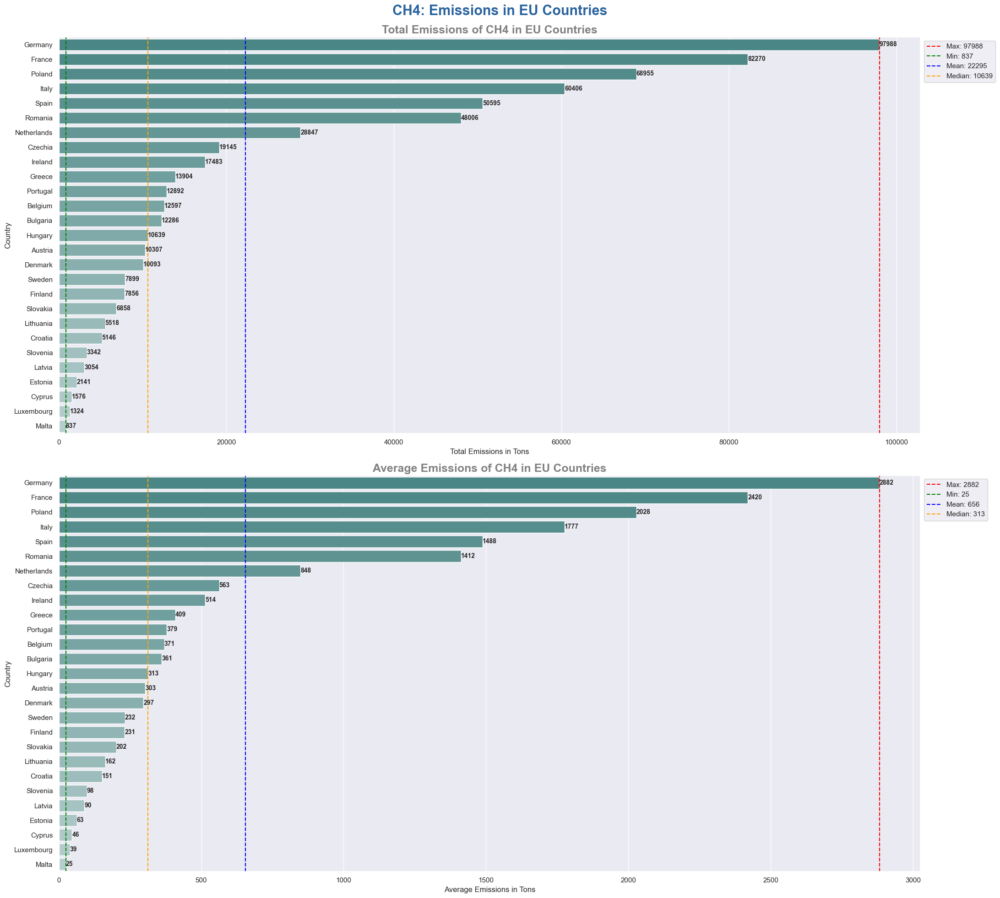

In [14]:
# emissioni con funzione
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_ch4,
    'Total_Emissions',
    'Total Emissions of CH4 in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_ch4,
    'Average_Emissions',
    'Average Emissions of CH4 in EU Countries',
    ax=ax[1]
)
plt.suptitle('CH4: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/CH4: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Il primo grafico mostra le **emissioni totali di metano (CH₄)** in tonnellate per ciascun paese dell'UE nel periodo 1990–2023.  
I principali emettitori risultano essere **Germania**🇩🇪, **Francia**🇫🇷 e **Polonia**🇵🇱, con valori ben al di sopra della media.  
L'indicatore rosso verticale rappresenta il valore massimo registrato (97.988 tonnellate), mentre le linee tratteggiate mostrano media, mediana e minimo.  
Paesi come **Malta**🇲🇹 e **Lussemburgo**🇱🇺 presentano emissioni trascurabili in termini assoluti.

Nel secondo grafico vengono rappresentate le **emissioni medie annue**, che confermano il peso costante di alcuni paesi (es. Germania🇩🇪 e Francia🇫🇷), ma evidenziano anche che **Italia🇮🇹 e Spagna🇪🇸**, pur con un totale elevato, hanno emissioni più distribuite nel tempo.

La presenza delle linee di riferimento (max, min, media, mediana) aiuta a contestualizzare i dati e individuare anomalie o comportamenti stabili nel tempo.

#### Lineplot: trend CH4 delle emissioni

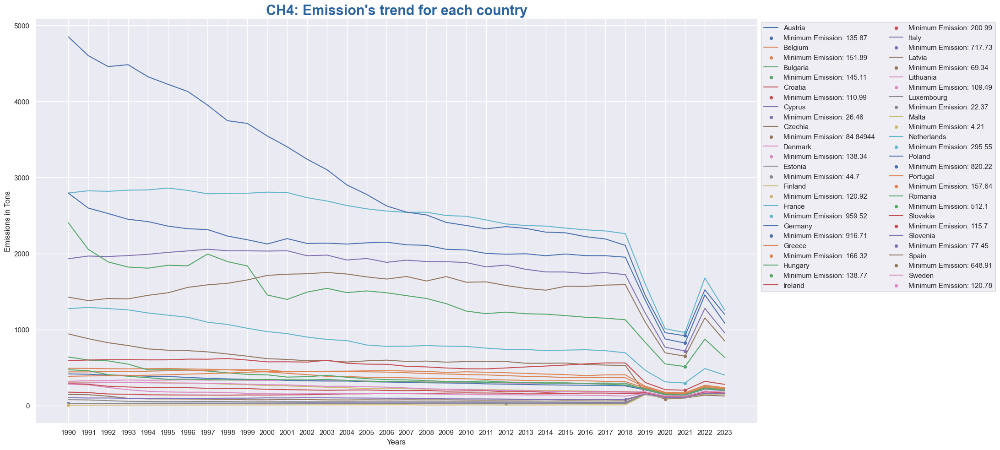

In [15]:
lineplot_trend_country(df_ch4, 'CH4')

Il grafico mostra l'evoluzione delle emissioni di metano nei diversi paesi dell'Unione Europea nel periodo 1990–2023.  
Si osserva una **tendenza generale alla diminuzione**, in particolare nei paesi con emissioni più elevate come **Germania🇩🇪**, **Francia🇫🇷** e **Italia🇮🇹**, suggerendo l’efficacia di politiche ambientali e miglioramenti nei settori agricoli e industriali.

L'anno 2020 evidenzia un **calo netto e simultaneo** in molti paesi, probabilmente legato agli effetti delle restrizioni durante la pandemia di COVID-19.

Le linee di ciascun paese sono accompagnate da un'etichetta indicante il **valore minimo registrato**, utile per comprendere l'effettiva riduzione rispetto ai picchi iniziali.

#### Barplot: Variazione percentuale media

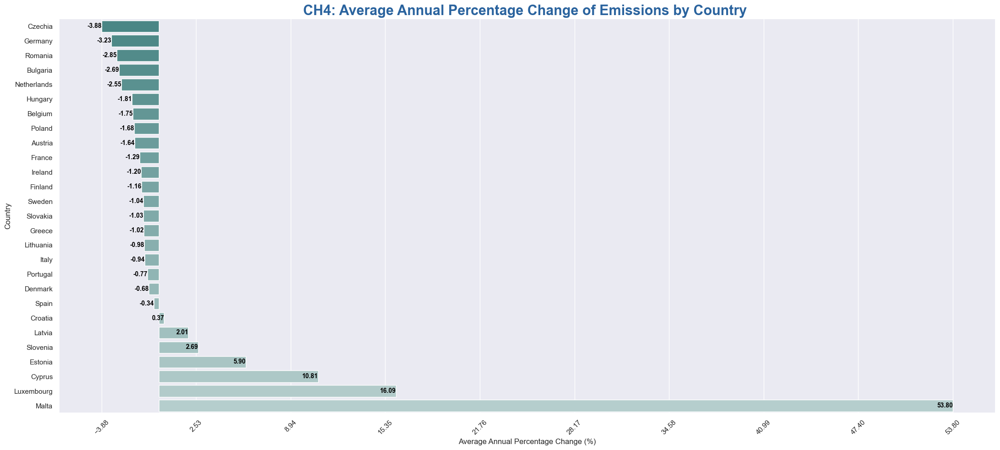

In [16]:
barplot_variation_country(df_ch4, 'CH4')

Questo grafico evidenzia il **tasso medio annuo di variazione** delle emissioni di metano (CH₄) per ogni paese dell'Unione Europea dal 1990 al 2023.

🔻 La maggior parte dei paesi mostra una **tendenza negativa**, segno di una riduzione costante delle emissioni nel tempo. Tra i migliori risultati:
- 🇨🇿 **Cechia**: -3.88%
- 🇩🇪 **Germania**: -3.23%
- 🇷🇴 **Romania**: -2.85%
- 🇧🇬 **Bulgaria**: -2.69%
- 🇳🇱 **Paesi Bassi**: -2.55%

🔺 Al contrario, alcuni paesi hanno registrato un aumento medio annuo delle emissioni, probabilmente dovuto a variazioni nelle attività agricole o industriali:
- 🇲🇹 **Malta**: +53.80%
- 🇱🇺 **Lussemburgo**: +16.09%
- 🇨🇾 **Cipro**: +10.81%
- 🇪🇪 **Estonia**: +5.90%

#### Barplot Emissioni per km2

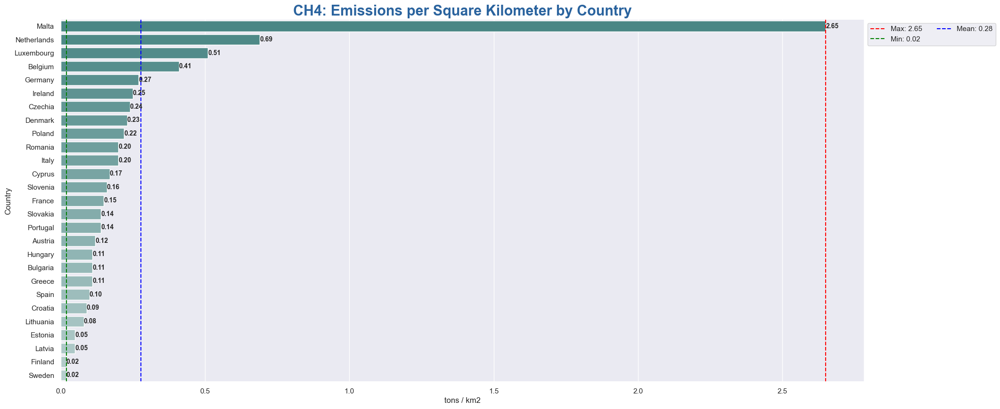

In [17]:
bla(df_ch4, 'CH4')

Questo grafico rappresenta l'intensità delle emissioni di metano (CH₄) in rapporto alla superficie del paese, misurate in tonnellate per km².

📌 I paesi con i valori più alti sono:
- 🇲🇹 **Malta**: 2.65 t/km²
- 🇳🇱 **Paesi Bassi**: 0.69 t/km²
- 🇱🇺 **Lussemburgo**: 0.51 t/km²
- 🇧🇪 **Belgio**: 0.41 t/km²
- 🇩🇪 **Germania**: 0.27 t/km²

Questi valori riflettono l'elevata **densità territoriale e industriale**: più piccolo è il paese, maggiore è il carico emissivo per km², anche con emissioni assolute non elevate.

🟢 Al contrario, paesi con ampie superfici e basse densità – come 🇫🇮 **Finlandia**, 🇸🇪 **Svezia**, 🇱🇻 **Lettonia** – mostrano valori minimi, inferiori a 0.05 t/km².

📊 Le linee verticali indicano:
- 🔴 **Max**: valore massimo (Malta)
- 🔵 **Mean**: media UE
- 🟢 **Min**: valore minimo (Svezia e Finlandia)

Questa metrica è fondamentale per comprendere la **pressione ambientale locale**, e non solo l'impatto globale.

### CO2 – Anidride Carbonica

Analisi delle emissioni di CO2 nei Paesi UE con barplot, lineplot e variazioni.

#### Informazioni generali

In [18]:
print(f'Dimensioni df_co2 prima della funzione: {df_co2.shape}')
print('\n')
print(df_co2.info())
print('\n')
df_co2 = calculate_emissions(df_co2)
print(f'Dimensioni df_co2 dopo la funzione: {df_co2.shape}')
print('\n')
print(df_co2.info())
print('\n')
display(df_co2.head())

Dimensioni df_co2 prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     27 non-null     float64
 2   1991     27 non-null     float64
 3   1992     27 non-null     float64
 4   1993     27 non-null     float64
 5   1994     27 non-null     float64
 6   1995     27 non-null     float64
 7   1996     27 non-null     float64
 8   1997     27 non-null     float64
 9   1998     27 non-null     float64
 10  1999     27 non-null     float64
 11  2000     27 non-null     float64
 12  2001     27 non-null     float64
 13  2002     27 non-null     float64
 14  2003     27 non-null     float64
 15  2004     27 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009 

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,62124.70,65725.53,60204.07,60635.42,61002.44,64065.26,67421.59,67232.78,66875.15,65562.72,66162.89,70102.60,71918.76,77554.25,77674.39,79192.43,76898.33,74262.59,73588.40,67493.95,72011.84,69898.24,67209.10,67745.69,64084.43,66283.24,67112.27,69628.86,66719.68,52987.01,31852.71,31493.55,55636.36,50369.68,2208730.91,64962.673824,79192.43,2005,31493.55,2021,0.462134
1,Belgium,120309.34,123382.08,122507.84,121444.20,124816.90,125956.47,129496.58,124001.76,130227.11,124718.90,126735.30,126084.68,126878.58,128275.26,128805.29,125661.69,123905.76,120496.16,120202.86,107743.37,114561.03,105046.06,102428.75,102674.40,96811.32,100981.34,99806.94,99456.28,100207.84,85836.73,49974.71,48429.55,90128.57,76322.98,3754316.63,110421.077353,130227.11,1998,48429.55,2021,-0.143790
2,Bulgaria,76698.98,61232.60,57010.43,57675.64,56083.53,57716.37,58108.02,55861.27,53275.22,46369.98,45305.03,49014.14,46258.57,50509.67,49570.73,50656.43,51895.22,55740.84,54079.56,45773.77,47862.93,53178.04,48349.01,42649.51,45169.33,48194.28,45353.72,47505.16,43551.60,44449.88,26910.67,26818.86,46672.37,44510.37,1690011.73,49706.227353,76698.98,1990,26818.86,2021,-0.473445
3,Croatia,23329.25,17182.30,16506.08,16959.78,16214.22,16926.34,17515.27,18575.88,19278.90,20115.46,19694.45,20806.74,21912.74,23268.21,22916.83,23330.10,23529.45,24843.81,23628.58,21837.80,21050.86,20682.44,19114.78,18454.62,17704.99,17840.75,18105.04,18737.69,17718.65,14442.69,8673.47,9138.78,15164.82,14376.14,639577.91,18811.115000,24843.81,2007,8673.47,2020,-0.395084
4,Cyprus,4656.89,5146.61,5522.91,5766.97,6011.11,5882.27,6233.23,6321.03,6614.65,6882.47,7145.88,7021.41,7210.78,7605.55,7840.94,8031.30,8223.17,8538.92,8707.25,8453.80,8089.01,7759.47,7234.89,6554.36,6934.59,6960.13,7368.23,7515.69,7332.76,8865.16,5368.65,5355.52,9308.42,9018.22,241482.24,7102.418824,9308.42,2022,4656.89,1990,3.043153


#### Barplot: Emissioni di CO2 nell'Unione Europea

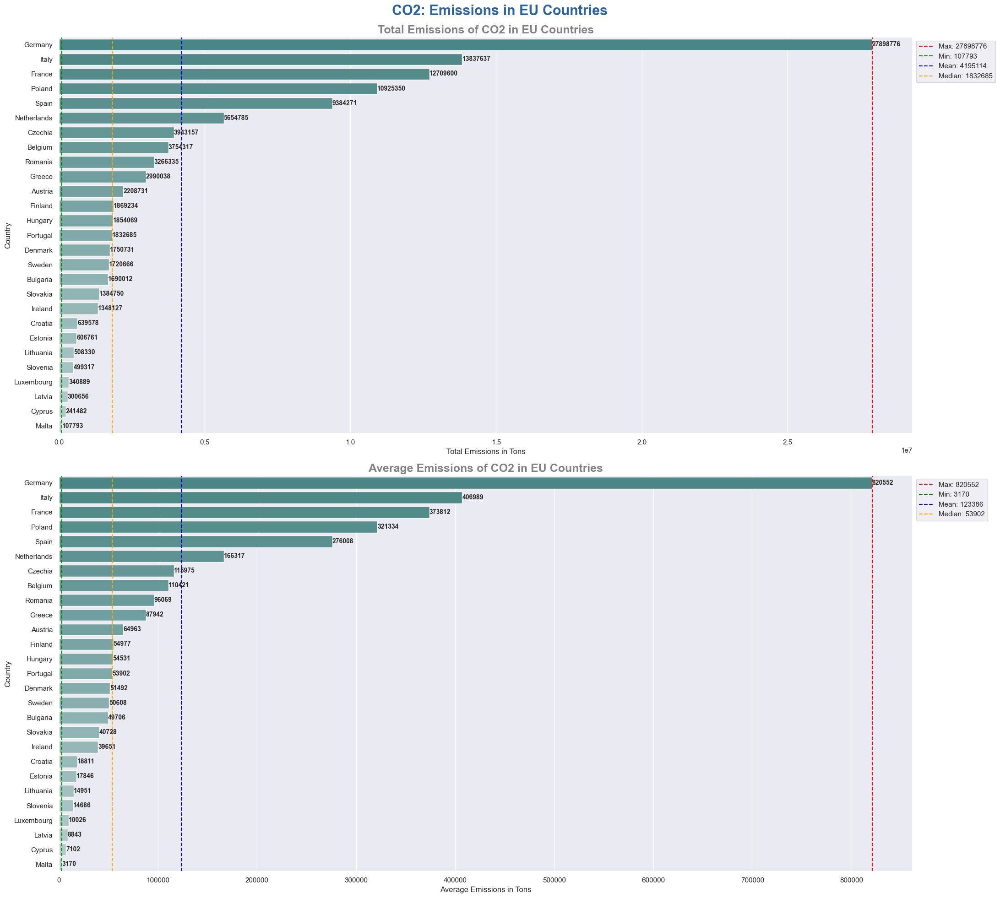

In [19]:
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_co2,
    'Total_Emissions',
    'Total Emissions of CO2 in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_co2,
    'Average_Emissions',
    'Average Emissions of CO2 in EU Countries',
    ax=ax[1]
)
plt.suptitle('CO2: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/CO2: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Il primo grafico rappresenta le **emissioni totali di anidride carbonica (CO₂)** nei paesi dell'Unione Europea dal 1990 al 2023.  
I principali responsabili risultano essere:
- 🇩🇪 **Germania**
- 🇮🇹 **Italia**
- 🇫🇷 **Francia**
- 🇵🇱 **Polonia**
- 🇪🇸 **Spagna**

Questi paesi mostrano un’impronta carbonica significativa, in linea con il loro peso economico e industriale nel contesto europeo.

Il secondo grafico mostra la **media annuale delle emissioni di CO₂** per paese, utile per identificare non solo i picchi ma anche la costanza nel tempo.  
Alcuni paesi, pur con totali più contenuti, mantengono un contributo annuale stabile e rilevante.

📏 Le linee di riferimento (massimo, media, mediana, minimo) aiutano a contestualizzare il posizionamento di ciascun paese rispetto agli altri.

#### Lineplot: trend CO2 delle emissioni

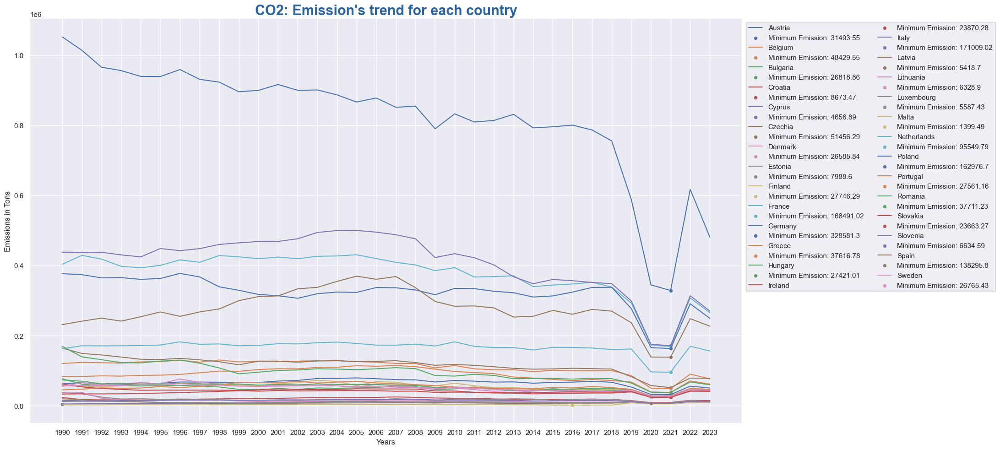

In [20]:
lineplot_trend_country(df_co2, 'CO2')

Il grafico mostra il **trend temporale delle emissioni di anidride carbonica (CO₂)** per ciascun paese europeo.

📉 Si osserva una **progressiva riduzione delle emissioni** nella maggior parte dei paesi, in particolare:
- 🇩🇪 **Germania**
- 🇬🇧 **(UK, fino al 2020 nei dati storici)**
- 🇮🇹 **Italia**
- 🇫🇷 **Francia**

📌 Alcune curve rivelano un **calo netto attorno al 2020**, verosimilmente legato all'effetto della pandemia COVID-19 e alle misure di lockdown.

🔍 Il confronto tra le curve permette di identificare i paesi che hanno **migliorato costantemente** le proprie politiche ambientali, e quelli che mostrano **una tendenza più piatta** o fluttuante.

Questo tipo di analisi temporale è utile per valutare l’efficacia delle politiche climatiche a lungo termine.

#### Barplot: Variazione percentuale media

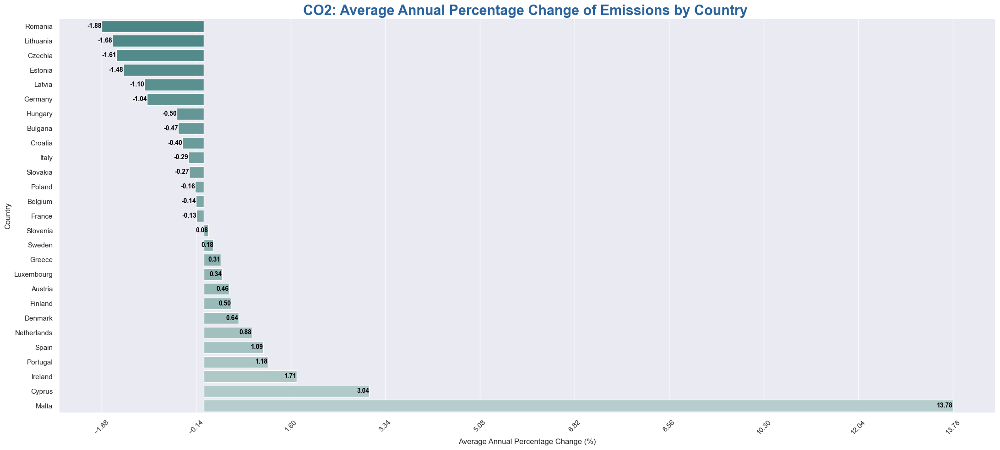

In [21]:
barplot_variation_country(df_co2, 'CO2')

Il grafico mostra il tasso medio annuo di variazione delle emissioni di CO₂ per ciascun paese dell’Unione Europea dal 1990 al 2023.

🔻 I paesi con le riduzioni più significative sono:
- 🇱🇹 **Lituania**
- 🇪🇪 **Estonia**
- 🇱🇻 **Lettonia**
- 🇧🇬 **Bulgaria**
- 🇨🇿 **Cechia**

Questi trend negativi evidenziano una **transizione energetica accelerata**, dovuta a innovazioni nel settore energetico, chiusura di impianti a carbone e investimenti nelle rinnovabili.

🔺 Pochi paesi possono mostrare un **lieve incremento**, spesso legato a crescita economica o industriale recente, ma restano eccezioni.

📊 Questo indicatore è utile per comprendere **l’effettiva evoluzione delle politiche ambientali** nel lungo periodo.

#### Barplot: Emissioni per km2

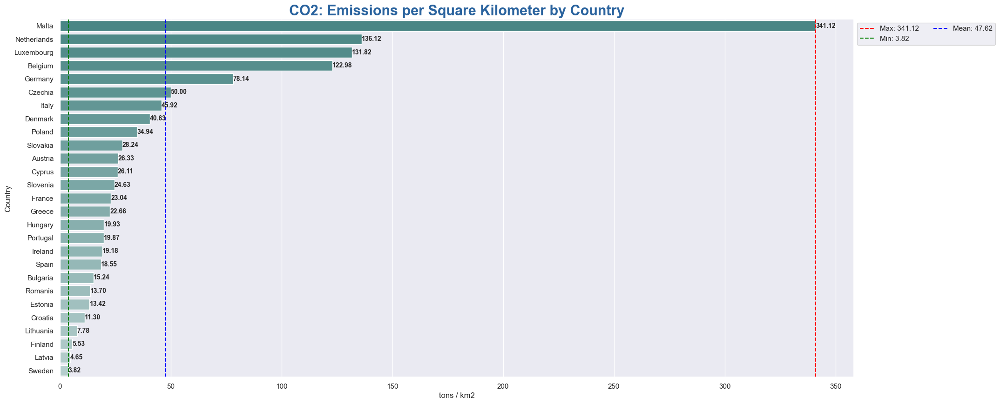

In [22]:
bla(df_co2, 'CO2')

Questo grafico mostra l’intensità delle emissioni di CO₂, calcolata come tonnellate emesse per chilometro quadrato di superficie nazionale.

📌 I paesi con maggiore densità emissiva sono:
- 🇲🇹 **Malta**: 341.12 t/km²
- 🇳🇱 **Paesi Bassi**: 136.12 t/km²
- 🇱🇺 **Lussemburgo**: 131.82 t/km²
- 🇧🇪 **Belgio**: 122.98 t/km²
- 🇩🇪 **Germania**: 78.14 t/km²

Questi valori riflettono contesti ad **alta densità urbana e industriale**, dove il territorio è intensamente sfruttato.

🟢 I paesi con minore intensità emissiva sono:
- 🇸🇪 **Svezia**
- 🇱🇻 **Lettonia**
- 🇫🇮 **Finlandia**

Queste nazioni, caratterizzate da **ampi spazi naturali e bassa densità abitativa**, presentano un impatto territoriale minore, pur avendo volumi totali rilevanti.

📊 Le linee verticali rappresentano:
- 🔴 Valore massimo
- 🔵 Media UE
- 🟢 Valore minimo

Questo indicatore offre una lettura complementare ai valori assoluti, mostrando **l’impatto ambientale per unità di superficie**.

### GHG – Gas serra totali

Analisi delle emissioni totali di gas serra nei Paesi dell'Unione Europea.

#### Informazioni generali

In [23]:
print(f'Dimensioni df_ghg prima della funzione: {df_ghg.shape}')
print('\n')
print(df_ghg.info())
print('\n')
df_ghg = calculate_emissions(df_ghg)
print(f'Dimensioni df_ghg dopo la funzione: {df_ghg.shape}')
print('\n')
print(df_ghg.info())
print('\n')
display(df_ghg.head())

Dimensioni df_ghg prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     26 non-null     float64
 2   1991     26 non-null     float64
 3   1992     26 non-null     float64
 4   1993     26 non-null     float64
 5   1994     26 non-null     float64
 6   1995     26 non-null     float64
 7   1996     26 non-null     float64
 8   1997     26 non-null     float64
 9   1998     26 non-null     float64
 10  1999     26 non-null     float64
 11  2000     26 non-null     float64
 12  2001     26 non-null     float64
 13  2002     26 non-null     float64
 14  2003     26 non-null     float64
 15  2004     26 non-null     float64
 16  2005     26 non-null     float64
 17  2006     26 non-null     float64
 18  2007     26 non-null     float64
 19  2008     26 non-null     float64
 20  2009 

/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/3803693959.py:14: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  df['Year_Max_Emission'] = df[num_cols].idxmax(axis=1)   # anno di emissione massima
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/3803693959.py:16: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  df['Year_Min_Emission'] = df[num_cols].idxmin(axis=1)   # anno di emissione minima
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/3803693959.py:18: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_variation = df_y

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,78492.61,82157.14,75524.00,75771.05,76016.83,79382.99,82605.50,82175.96,81511.96,79931.07,80261.99,84151.51,85906.92,91545.24,91139.81,92427.27,90022.83,87337.77,86747.76,80163.13,84612.84,82286.89,79528.79,79971.98,76346.01,78509.78,79467.29,82023.36,78950.34,80476.22,47429.41,55335.86,85385.34,86896.84,2740494.29,80602.773235,92427.27,2005,47429.41,2020,1.094094
1,Belgium,146410.76,149137.37,148737.28,147741.14,152361.11,154495.96,158184.69,149720.79,154897.83,148647.76,149704.63,148114.45,148157.11,148419.33,149273.60,146251.99,143391.88,139789.97,139699.33,127051.68,134315.86,123782.51,120922.50,120949.31,115215.77,119418.39,118172.44,118005.10,118455.74,115141.91,67314.87,76993.86,120899.01,117968.09,4537744.02,133463.059412,158184.69,1996,67314.87,2020,0.153547
2,Bulgaria,101794.34,83349.88,77727.07,76742.25,73107.41,74614.54,74782.90,71967.78,67955.96,60709.30,59580.03,62640.66,59963.84,64510.04,63592.41,64117.73,64678.35,68555.80,67142.57,58154.08,60726.73,65995.81,60940.95,55666.99,58679.25,61920.68,59345.03,61682.76,57815.59,60892.06,34922.25,41584.47,64247.25,63465.12,2203571.88,64810.937647,101794.34,1990,34922.25,2020,-0.451881
3,Croatia,31875.85,25034.42,23037.60,23009.78,22116.19,22739.43,23288.23,24534.40,24923.52,26053.24,25708.82,26894.15,28007.78,29468.13,29465.49,29920.38,30299.87,31726.83,30822.85,28468.42,28033.73,27707.92,25887.46,24463.77,23697.28,24125.31,24275.34,25032.08,23792.80,18188.67,10377.08,11534.15,19098.10,16543.42,840152.49,24710.367353,31875.85,1990,10377.08,2020,-0.833944
4,Cyprus,5690.44,6207.65,6662.69,6944.99,7204.88,7143.86,7490.33,7581.99,7909.48,8187.10,8457.56,8401.04,8634.01,9023.85,9235.40,9390.60,9600.37,9943.99,10094.96,9849.21,9518.12,9167.14,8631.48,7915.92,8291.26,8345.50,8794.10,8974.40,8811.61,9890.10,5725.00,6576.09,10384.61,10117.41,284797.14,8376.386471,10384.61,2022,5690.44,1990,2.619942


#### Barplot: emissioni

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


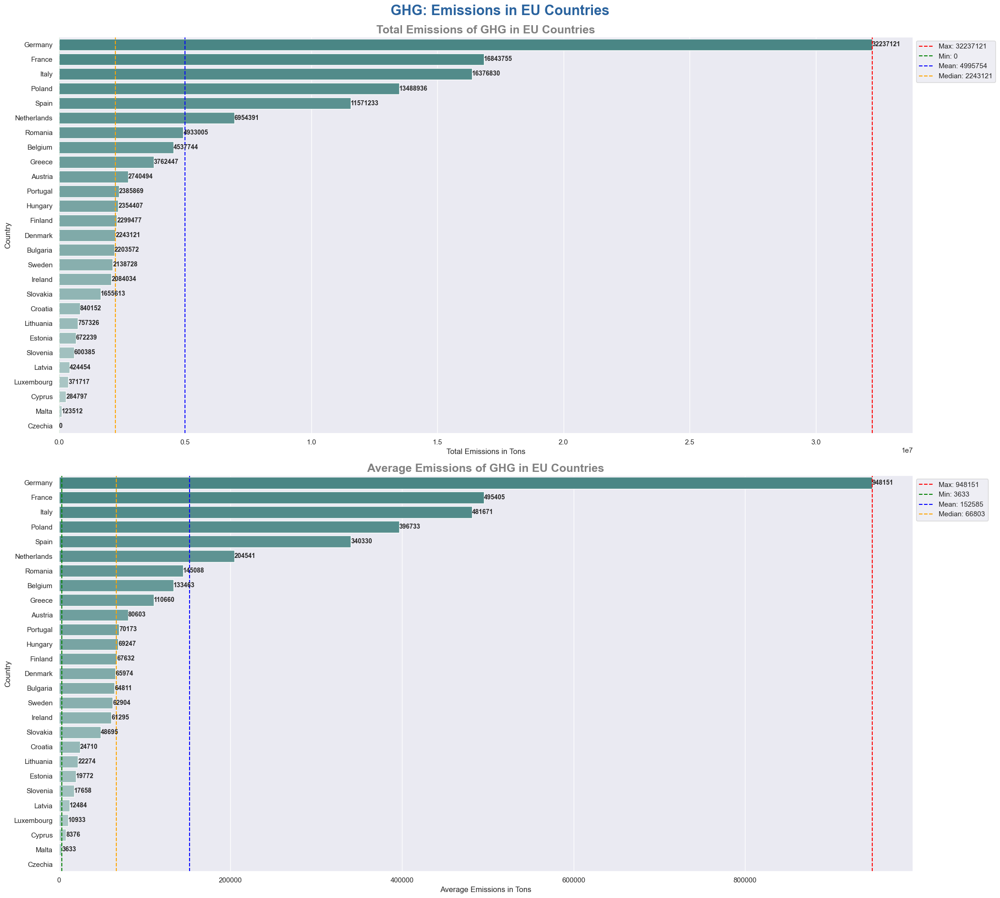

In [24]:
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_ghg,
    'Total_Emissions',
    'Total Emissions of GHG in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_ghg,
    'Average_Emissions',
    'Average Emissions of GHG in EU Countries',
    ax=ax[1]
)
plt.suptitle('GHG: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/GHG: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Il primo grafico mostra le **emissioni totali di gas serra (GHG)** per ciascun paese dell’Unione Europea nel periodo 1990–2023.  
I paesi con le emissioni più alte sono:
- 🇩🇪 **Germania**: oltre 32 milioni di tonnellate
- 🇫🇷 **Francia**
- 🇮🇹 **Italia**
- 🇵🇱 **Polonia**
- 🇪🇸 **Spagna**

📌 Questi dati evidenziano il peso industriale e demografico di queste nazioni nel panorama europeo.

Il secondo grafico presenta la **media annuale delle emissioni di GHG**, fornendo una lettura più omogenea nel tempo:
- 🇩🇪 **Germania** mantiene il primo posto anche per emissioni medie
- 🇫🇷 **Francia** e 🇮🇹 **Italia** confermano valori costanti nel lungo periodo

🔍 Le linee verticali nel grafico aiutano a identificare la media, la mediana e gli estremi, offrendo un riferimento per il confronto tra paesi.

💡 L’analisi di GHG aggrega diversi gas climalteranti (CO₂, CH₄, N₂O, ecc.), restituendo una panoramica complessiva dell’impatto ambientale di ciascun paese.

#### Lineplot Trend

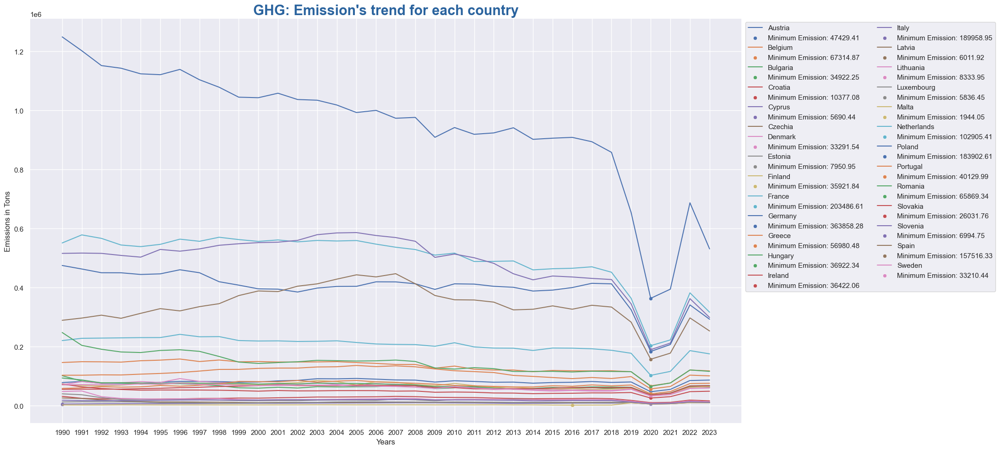

In [25]:
lineplot_trend_country(df_ghg, 'GHG')

Il grafico rappresenta l’evoluzione temporale delle emissioni complessive di gas serra (GHG) nei paesi dell’Unione Europea.

📉 Si osserva una **tendenza generale alla diminuzione**, in particolare nei paesi con le emissioni più elevate:
- 🇩🇪 **Germania**
- 🇫🇷 **Francia**
- 🇮🇹 **Italia**
- 🇵🇱 **Polonia**
- 🇪🇸 **Spagna**

🔻 Il **crollo intorno al 2020** è evidente e può essere attribuito alla pandemia COVID-19, che ha comportato una significativa riduzione delle attività economiche.

📌 Le curve mostrano anche **differenze nella velocità di riduzione** tra i paesi: alcune nazioni riducono gradualmente, altre restano relativamente stabili.

🧩 L’analisi temporale dei GHG consente di valutare **l’efficacia delle politiche climatiche** e di individuare i paesi più virtuosi nella transizione energetica.

#### Barplot Variazione Media

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


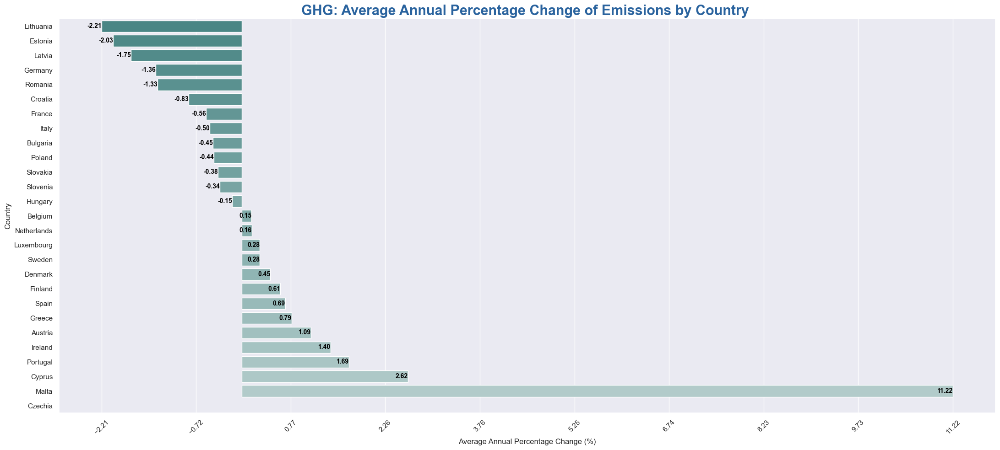

In [26]:
barplot_variation_country(df_ghg, 'GHG')

Il grafico evidenzia il **tasso medio di crescita o riduzione** delle emissioni di gas serra (GHG) nei paesi UE nel lungo periodo (1990–2023).

🔻 I paesi con le riduzioni più significative sono:
- 🇱🇹 **Lituania**: -2.21% annuo
- 🇪🇪 **Estonia**: -2.03%
- 🇱🇻 **Lettonia**: -1.75%
- 🇩🇪 **Germania**: -1.36%
- 🇷🇴 **Romania**: -1.33%

Questi valori negativi indicano una **transizione strutturale verso modelli energetici più sostenibili**.

🔺 Alcuni paesi hanno invece registrato un **aumento medio annuo delle emissioni**, come:
- 🇨🇿 **Cechia**
- 🇲🇹 **Malta**
- 🇨🇾 **Cipro**
- 🇵🇹 **Portogallo**

Questi incrementi, sebbene legati a volumi assoluti inferiori, segnalano un **trend da monitorare attentamente** nel contesto degli obiettivi climatici europei.

📊 Questo indicatore è fondamentale per valutare **l'efficacia delle politiche ambientali nel tempo**, andando oltre i valori assoluti.

#### Barplot: Emissioni per km2

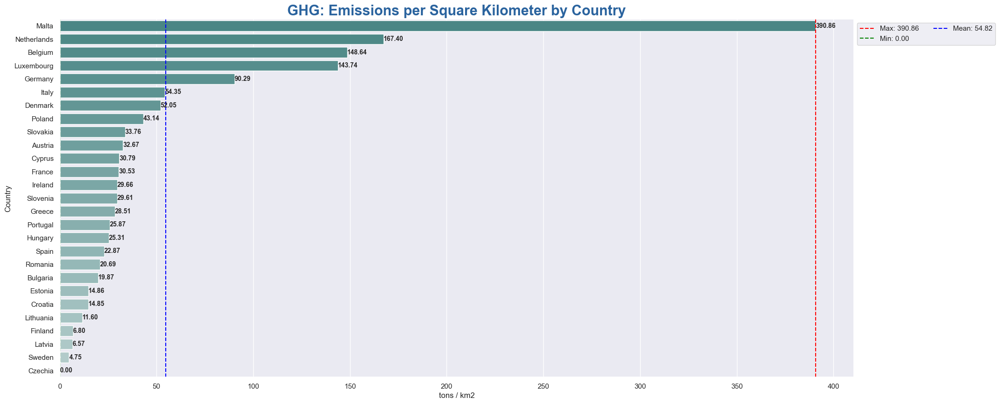

In [27]:
bla(df_ghg, 'GHG')

Il grafico rappresenta l’intensità territoriale delle emissioni di gas serra (GHG), espressa in tonnellate per chilometro quadrato.

📌 I paesi con il maggior impatto territoriale sono:
- 🇲🇹 **Malta**: 390.86 t/km²
- 🇳🇱 **Paesi Bassi**: 167.40 t/km²
- 🇧🇪 **Belgio**: 148.64 t/km²
- 🇱🇺 **Lussemburgo**: 143.74 t/km²
- 🇩🇪 **Germania**: 90.29 t/km²

Questi risultati evidenziano come paesi **piccoli ma densi e industrializzati** abbiano una pressione ambientale per km² ben più alta dei paesi più estesi.

🟢 Al contrario, i valori più bassi si registrano in:
- 🇸🇪 **Svezia**
- 🇱🇻 **Lettonia**
- 🇫🇮 **Finlandia**

🔍 🇨🇿 **Cechia** presenta un valore di 0, probabilmente a causa di dati mancanti o non rilevati correttamente nel calcolo per superficie.

📊 Le linee verticali indicano:
- 🔴 Massimo (Malta)
- 🔵 Media UE (54.82)
- 🟢 Minimo (0)

### N2O – Protossido di azoto

Analisi delle emissioni di N2O con visualizzazione e variazioni medie.

#### Informazioni generali

In [28]:
print(f'Dimensioni df_n2o prima della funzione: {df_n2o.shape}')
print('\n')
print(df_n2o.info())
print('\n')
df_n2o = calculate_emissions(df_n2o)
print(f'Dimensioni df_n2o dopo la funzione: {df_n2o.shape}')
print('\n')
print(df_n2o.info())
print('\n')
display(df_n2o.head())

Dimensioni df_n2o prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     27 non-null     float64
 2   1991     27 non-null     float64
 3   1992     27 non-null     float64
 4   1993     27 non-null     float64
 5   1994     27 non-null     float64
 6   1995     27 non-null     float64
 7   1996     27 non-null     float64
 8   1997     27 non-null     float64
 9   1998     27 non-null     float64
 10  1999     27 non-null     float64
 11  2000     27 non-null     float64
 12  2001     27 non-null     float64
 13  2002     27 non-null     float64
 14  2003     27 non-null     float64
 15  2004     27 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009 

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,14.50,14.61,13.98,14.08,13.92,14.24,14.34,14.43,14.59,14.56,14.49,14.08,14.09,14.06,12.09,12.09,12.12,12.16,12.77,12.02,11.37,11.68,11.58,11.53,11.81,11.84,12.15,11.95,11.83,75.76,44.65,41.80,79.55,78.47,699.19,20.564412,79.55,2022,11.37,2010,17.072994
1,Belgium,33.80,33.36,32.43,33.35,34.71,36.33,37.80,37.05,36.67,36.69,34.27,32.94,31.76,28.75,29.38,28.55,25.18,23.42,23.40,23.73,25.46,21.39,21.16,20.63,20.74,20.25,19.34,20.06,19.14,77.94,45.70,43.04,81.84,80.91,1151.17,33.857941,81.84,2022,19.14,2018,8.985434
2,Bulgaria,30.72,24.05,20.31,18.34,17.83,17.27,16.81,16.00,13.19,13.74,13.98,14.25,14.02,13.46,15.48,14.93,13.34,13.47,14.25,12.93,14.56,13.40,13.65,14.98,16.53,16.90,17.99,17.93,17.58,75.89,44.73,41.88,79.68,78.81,792.88,23.320000,79.68,2022,12.93,2009,9.970734
3,Croatia,9.78,9.25,9.21,7.87,7.98,7.72,7.63,8.24,7.14,7.83,8.15,8.07,7.96,7.61,8.34,8.32,8.37,8.55,9.58,7.42,8.22,8.47,7.78,5.78,5.56,6.21,5.35,5.81,5.66,75.53,44.35,41.44,79.31,77.56,542.05,15.942647,79.31,2022,5.35,2016,37.443662
4,Cyprus,0.98,0.99,1.09,1.15,1.13,1.27,1.19,1.17,1.25,1.22,1.17,1.28,1.29,1.28,1.15,1.06,1.11,1.09,1.05,1.02,1.08,1.04,1.02,0.94,0.92,0.95,0.97,0.99,1.00,75.32,44.11,40.96,79.09,76.85,348.18,10.240588,79.09,2022,0.92,2014,226.662214


#### Barplot: emissioni

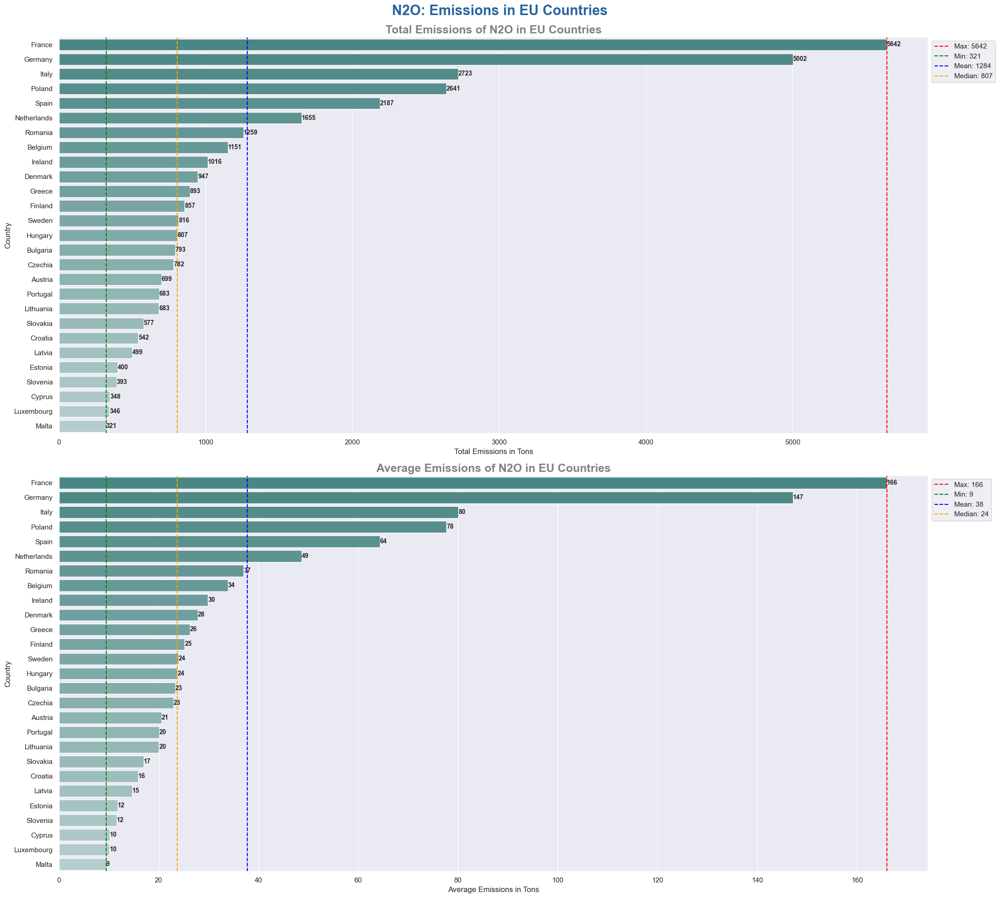

In [29]:
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_n2o,
    'Total_Emissions',
    'Total Emissions of N2O in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_n2o,
    'Average_Emissions',
    'Average Emissions of N2O in EU Countries',
    ax=ax[1]
)
plt.suptitle('N2O: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/N2O: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Il protossido di azoto (N₂O) è un gas serra potentissimo, spesso legato all’**uso di fertilizzanti agricoli** e alle pratiche di coltivazione intensiva.

📊 In termini di **emissioni totali**, i maggiori contributori sono:
- 🇫🇷 **Francia**: 5642 tonnellate
- 🇩🇪 **Germania**
- 🇮🇹 **Italia**
- 🇵🇱 **Polonia**
- 🇪🇸 **Spagna**

L’agricoltura è una variabile chiave nel peso emissivo di questi paesi.

Nel secondo grafico, che mostra le **emissioni medie annue**, il podio rimane invariato, con 🇫🇷 **Francia** nettamente in testa (166 tonnellate/anno).

📌 Interessante notare che:
- 🇳🇱 **Paesi Bassi** e 🇮🇪 **Irlanda**, pur con volumi totali minori, mantengono livelli medi significativi.
- 🇲🇹 **Malta** e 🇱🇺 **Lussemburgo** restano i paesi con impatto più contenuto.

🧪 N₂O ha un potenziale di riscaldamento oltre 250 volte superiore alla CO₂, per cui anche piccoli volumi rappresentano un rischio climatico rilevante.

#### Lineplot Trend

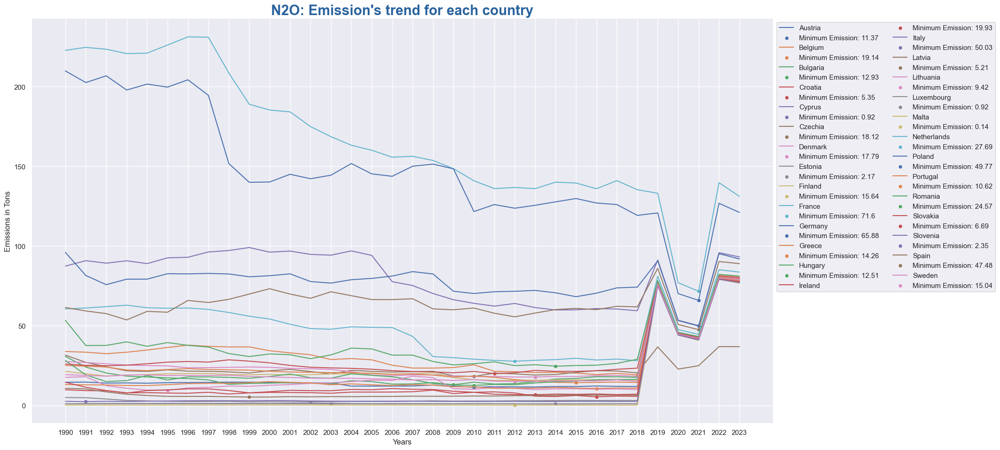

In [30]:
lineplot_trend_country(df_n2o, 'N2O')

Il grafico evidenzia l’andamento temporale delle emissioni di N₂O nei paesi dell’Unione Europea.  
Il protossido di azoto, strettamente legato all’**uso agricolo di fertilizzanti azotati**, mostra caratteristiche ben distinte rispetto ad altri gas serra.

📉 Si osserva un **declino progressivo** in diversi paesi, in particolare:
- 🇩🇪 **Germania**
- 🇫🇷 **Francia**
- 🇵🇱 **Polonia**
- 🇮🇹 **Italia**

🔄 Alcune curve evidenziano **fluttuazioni marcate negli anni 2000**, segno di variazioni stagionali o politiche agricole.

🦠 Un picco anomalo nel 2020–2021 è presente anche per questo gas, probabilmente influenzato dalle **perturbazioni economiche dovute alla pandemia**.

🌿 La progressiva riduzione delle emissioni in molti paesi segnala **miglioramenti nelle tecniche agricole** e una maggiore attenzione alle emissioni non-CO₂.

🔍 Tuttavia, alcuni paesi mostrano ancora una **stabilità eccessiva** che potrebbe indicare una necessità di ulteriore intervento.

#### Barplot Variazione media

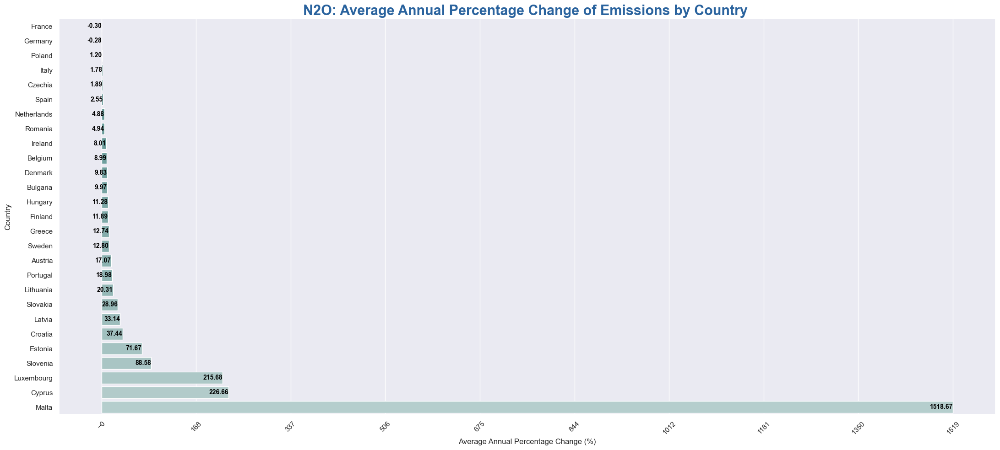

In [31]:
barplot_variation_country(df_n2o, 'N2O')

Il grafico evidenzia l’andamento temporale delle emissioni di N₂O nei paesi dell’Unione Europea.  
Il protossido di azoto, strettamente legato all’**uso agricolo di fertilizzanti azotati**, mostra caratteristiche ben distinte rispetto ad altri gas serra.

📉 Si osserva un **declino progressivo** in diversi paesi, in particolare:
- 🇩🇪 **Germania**
- 🇫🇷 **Francia**
- 🇵🇱 **Polonia**
- 🇮🇹 **Italia**

🔄 Alcune curve evidenziano **fluttuazioni marcate negli anni 2000**, segno di variazioni stagionali o politiche agricole.

🦠 Un picco anomalo nel 2020–2021 è presente anche per questo gas, probabilmente influenzato dalle **perturbazioni economiche dovute alla pandemia**.

🌿 La progressiva riduzione delle emissioni in molti paesi segnala **miglioramenti nelle tecniche agricole** e una maggiore attenzione alle emissioni non-CO₂.

🔍 Tuttavia, alcuni paesi mostrano ancora una **stabilità eccessiva** che potrebbe indicare una necessità di ulteriore intervento.

#### Barplot: Emissioni per km2

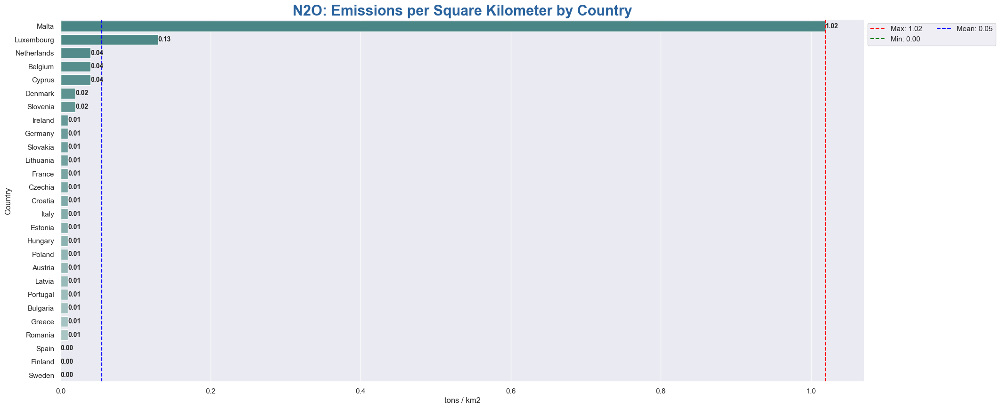

In [32]:
bla(df_n2o, 'N2O')

Questo grafico rappresenta l’intensità delle emissioni di protossido di azoto (N₂O) in rapporto alla superficie nazionale, in tonnellate per km².

📌 I paesi con la maggiore densità emissiva sono:
- 🇲🇹 **Malta**: 1.02 t/km²
- 🇱🇺 **Lussemburgo**: 0.13 t/km²
- 🇳🇱 **Paesi Bassi**, 🇧🇪 **Belgio**, 🇨🇾 **Cipro**: tutti con 0.04 t/km²

Questi valori, pur contenuti rispetto ad altri gas, evidenziano un impatto relativamente alto in **aree territorialmente limitate ma intensamente sfruttate**.

🟢 La maggior parte degli altri paesi ha valori intorno a **0.01 t/km² o meno**, e alcuni — come 🇸🇪 **Svezia**, 🇪🇸 **Spagna**, 🇫🇮 **Finlandia** — risultano con valore 0, probabilmente per effetto della **bassa densità agricola** o per limiti nella rilevazione.

📊 La linea rossa indica il valore massimo (Malta), mentre la linea blu rappresenta la media UE (0.05 t/km²).

🔍 Questo indicatore è utile per evidenziare l’intensità locale del fenomeno, e il suo potenziale impatto su ecosistemi regionali.

### NOx – Ossidi di azoto

Trend e variazioni delle emissioni di NOx nei Paesi UE.

#### Informazioni generali

In [33]:
print(f'Dimensioni df_nox prima della funzione: {df_nox.shape}')
print('\n')
print(df_nox.info())
print('\n')
df_nox= calculate_emissions(df_nox)
print(f'Dimensioni df_nox dopo la funzione: {df_nox.shape}')
print('\n')
print(df_nox.info())
print('\n')
display(df_nox.head())

Dimensioni df_nox prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     27 non-null     float64
 2   1991     27 non-null     float64
 3   1992     27 non-null     float64
 4   1993     27 non-null     float64
 5   1994     27 non-null     float64
 6   1995     27 non-null     float64
 7   1996     27 non-null     float64
 8   1997     27 non-null     float64
 9   1998     27 non-null     float64
 10  1999     27 non-null     float64
 11  2000     27 non-null     float64
 12  2001     27 non-null     float64
 13  2002     27 non-null     float64
 14  2003     27 non-null     float64
 15  2004     27 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009 

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,216.37,225.94,214.48,205.89,197.52,196.73,214.48,200.68,212.37,204.10,209.69,220.39,227.95,239.31,238.65,244.39,234.49,226.82,213.42,199.59,200.50,192.30,187.18,186.34,177.71,174.66,168.39,160.06,149.00,128.03,74.00,69.50,134.43,124.32,6469.68,190.284706,244.39,2005,69.50,2021,-0.330800
1,Belgium,424.16,425.13,427.00,421.31,416.92,411.02,396.04,380.71,381.52,354.02,354.43,342.12,329.85,325.95,335.88,320.91,304.94,295.41,268.45,239.87,241.33,224.19,213.04,203.89,193.97,194.37,183.31,172.57,167.05,143.15,83.13,77.73,150.31,137.91,9541.59,280.635000,427.00,1992,77.73,2021,-2.055087
2,Bulgaria,257.33,188.28,180.25,178.73,169.52,171.97,169.70,161.93,165.03,150.29,144.36,153.89,145.11,159.42,155.35,157.07,155.42,160.24,154.42,135.20,139.23,148.59,136.47,121.20,128.49,136.30,127.74,130.86,121.98,113.79,62.42,59.98,119.48,103.31,4963.35,145.980882,257.33,1990,59.98,2021,-1.075806
3,Croatia,100.79,75.44,71.20,71.48,73.93,75.32,80.70,82.85,85.35,88.36,82.32,83.04,85.40,84.69,82.25,80.62,80.04,82.83,78.24,72.46,64.36,60.93,55.25,54.44,51.04,51.06,50.69,49.99,45.92,41.42,23.66,22.11,43.49,37.11,2268.78,66.728824,100.79,1990,22.11,2021,-1.474104
4,Cyprus,16.99,17.22,19.32,19.66,20.82,19.71,20.31,20.58,20.94,21.39,22.70,22.06,22.11,22.40,21.94,22.03,21.86,22.08,20.66,20.49,19.09,21.88,22.00,16.81,17.88,15.55,15.22,15.22,14.80,12.23,7.00,6.46,12.84,11.86,624.11,18.356176,22.70,2000,6.46,2021,0.509349


#### Barplot: Emissioni

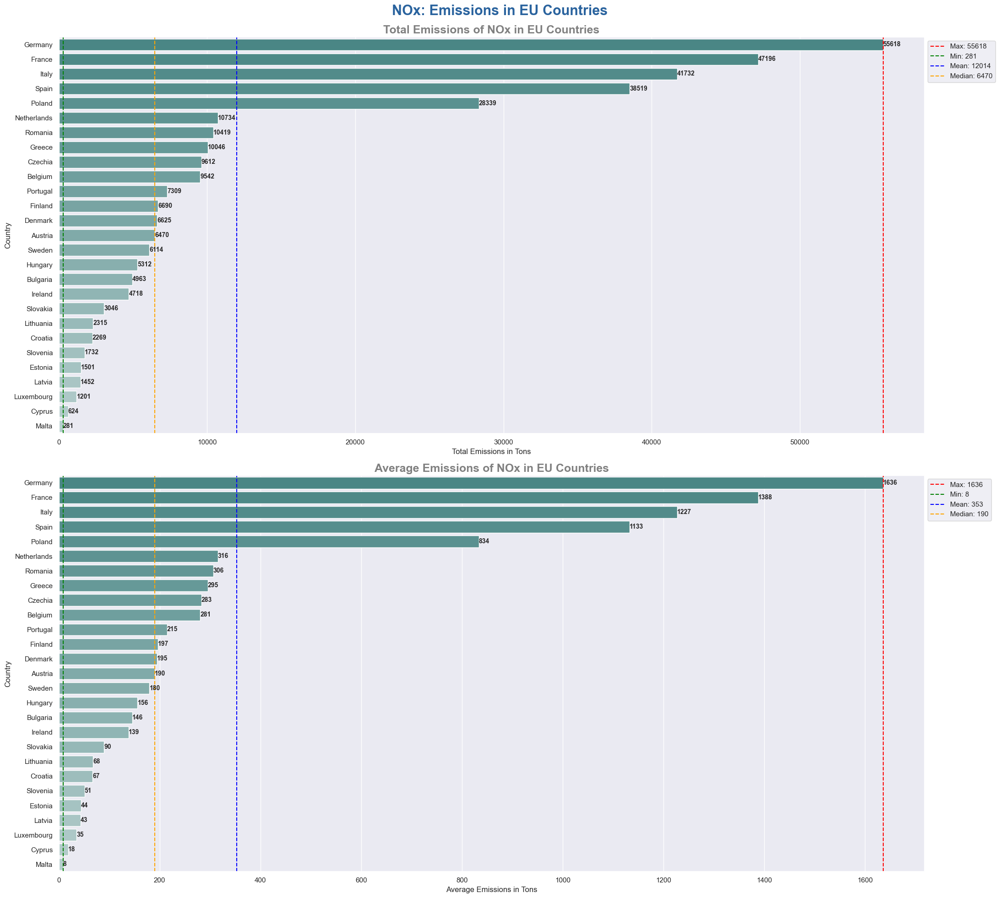

In [34]:
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_nox,
    'Total_Emissions',
    'Total Emissions of NOx in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_nox,
    'Average_Emissions',
    'Average Emissions of NOx in EU Countries',
    ax=ax[1]
)
plt.suptitle('NOx: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/NOx: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Gli ossidi di azoto (NOₓ) sono responsabili di effetti nocivi sull’ambiente e sulla salute umana, contribuendo alla formazione di **smog fotochimico**, piogge acide e malattie respiratorie.

📊 In termini di **emissioni totali**, i paesi più impattanti sono:
- 🇩🇪 **Germania**: oltre 56.000 tonnellate
- 🇫🇷 **Francia**
- 🇮🇹 **Italia**
- 🇪🇸 **Spagna**
- 🇵🇱 **Polonia**

Questi dati riflettono l’elevato numero di veicoli circolanti e le attività industriali diffuse.

📉 Anche nel grafico delle **emissioni medie annue**, il profilo resta coerente: 🇩🇪 Germania mantiene un distacco netto dagli altri paesi con una media di 1636 t/anno.

🔍 🇳🇱 **Paesi Bassi** e 🇬🇷 **Grecia** si distinguono per emissioni relativamente alte rispetto alla loro dimensione territoriale.

🧪 La riduzione dei NOₓ è uno degli obiettivi principali delle politiche per la **qualità dell’aria urbana**, grazie a tecnologie come motori Euro6, filtri SCR e mobilità elettrica.

📌 In questo caso, le **emissioni non sono legate principalmente all’agricoltura**, ma alla **mobilità e ai processi di combustione**.

#### Lineplot: Trend

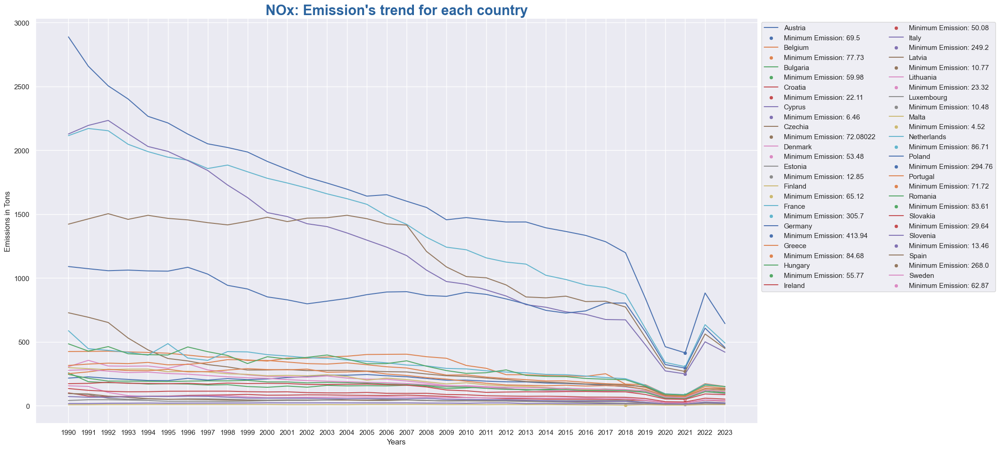

In [35]:
lineplot_trend_country(df_nox, 'NOx')

Il grafico rappresenta l’evoluzione nel tempo delle emissioni di NOₓ (ossidi di azoto), principalmente legati ai **trasporti su strada, traffico urbano, impianti industriali e centrali elettriche**.

📉 La tendenza generale è **fortemente decrescente**, specialmente in:
- 🇩🇪 **Germania**
- 🇫🇷 **Francia**
- 🇪🇸 **Spagna**
- 🇮🇹 **Italia**
- 🇬🇧 **(UK, se presente nei dati storici)**

Questa riduzione riflette l’**introduzione di normative ambientali più severe**, come gli standard Euro per i veicoli, la diffusione di carburanti più puliti e l’elettrificazione dei trasporti.

📌 Intorno al 2020 si nota una **flessione marcata**, plausibilmente dovuta alle restrizioni sulla mobilità imposte dalla pandemia COVID-19.

🔎 Le curve più basse (es. 🇲🇹 Malta, 🇨🇾 Cipro) sono relativamente piatte, ma va considerato che le dimensioni territoriali e il numero di veicoli circolanti sono molto inferiori rispetto ai grandi paesi.

💡 NOₓ è tra i principali gas da monitorare per migliorare la **qualità dell’aria urbana**, e la sua riduzione è un indicatore chiave della transizione energetica nei trasporti.

#### Barplot: Variazione Media

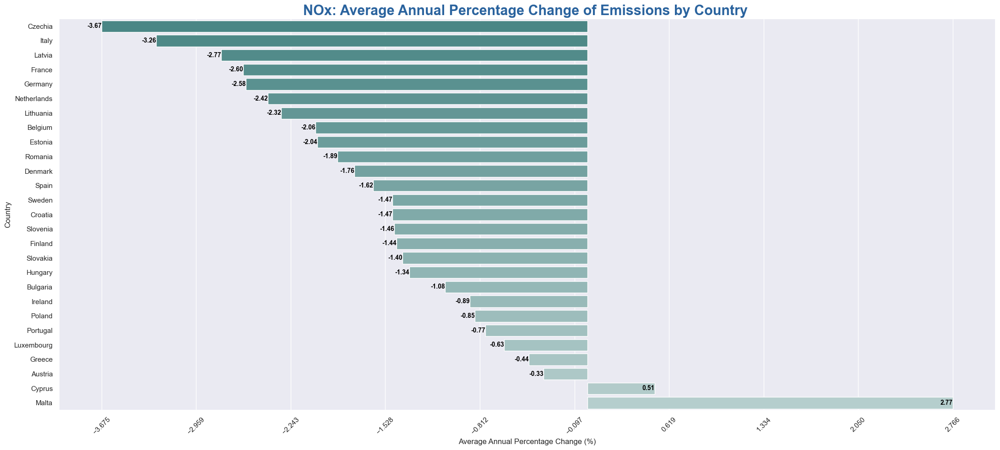

In [36]:
barplot_variation_country(df_nox, 'NOx')

Il grafico mostra il tasso medio annuo di riduzione (o aumento) delle emissioni di NOₓ dal 1990 al 2023.

📉 La **tendenza globale è ampiamente decrescente**, a dimostrazione dell'efficacia delle politiche ambientali attuate in tutta l'UE.

🔝 I paesi con i cali più consistenti:
- 🇨🇿 **Cechia**: -3.67% annuo
- 🇮🇹 **Italia**: -3.26%
- 🇱🇻 **Lettonia**: -2.77%
- 🇫🇷 **Francia**: -2.60%
- 🇩🇪 **Germania**: -2.58%

Questi risultati confermano gli sforzi concreti per ridurre le emissioni legate alla **mobilità, all’industria e alla combustione di carburanti fossili**.

🔺 In controtendenza:
- 🇲🇹 **Malta**: +2.77%
- 🇨🇾 **Cipro**: +0.51%

Questi aumenti, pur su scala ridotta, indicano che **le emissioni stanno crescendo** in modo medio annuo e potrebbero richiedere azioni correttive più rapide.

📌 Questo indicatore è tra i più utili per valutare **l’efficacia delle politiche di mobilità sostenibile e transizione energetica** a lungo termine.

#### Barplot: Emissioni per km2

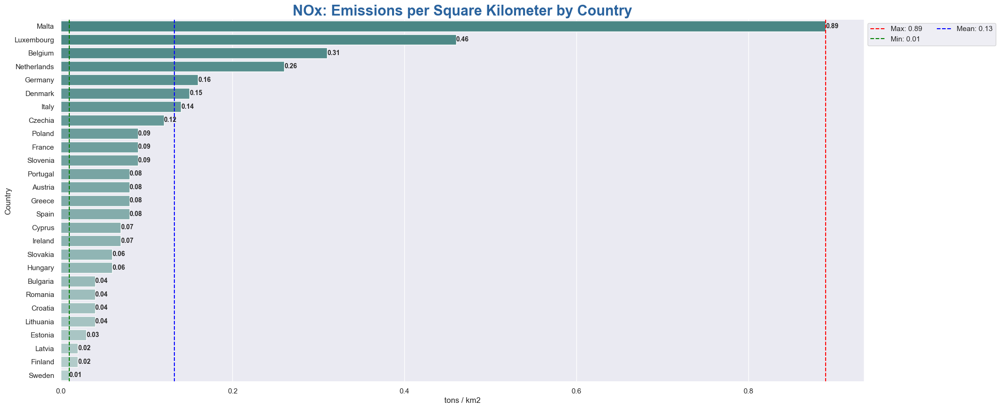

In [37]:
bla(df_nox, 'NOx')

Questo grafico mostra l’intensità territoriale delle emissioni di NOₓ (ossidi di azoto), espresse in tonnellate per km².

📌 I paesi con la maggiore densità emissiva sono:
- 🇲🇹 **Malta**: 0.89 t/km²
- 🇱🇺 **Lussemburgo**: 0.46 t/km²
- 🇧🇪 **Belgio**: 0.31 t/km²
- 🇳🇱 **Paesi Bassi**: 0.26 t/km²

Questi risultati riflettono una **forte concentrazione urbana e industriale in aree geograficamente ristrette**, spesso con traffico veicolare molto elevato.

📉 I paesi con valori più bassi, come:
- 🇸🇪 **Svezia**
- 🇫🇮 **Finlandia**
- 🇪🇪 **Estonia**

…beneficiano di **bassa densità abitativa e sistemi di trasporto più puliti**.

📊 Le linee di riferimento mostrano:
- 🔴 il valore massimo (Malta)
- 🔵 la media UE (0.13 t/km²)
- 🟢 il valore minimo (Svezia)

🔍 Questo indicatore è particolarmente utile per individuare **zone a rischio di inquinamento urbano**, e valutare l’efficacia delle politiche di mobilità sostenibile su scala territoriale.

### SO2 – Anidride solforosa

Emissioni storiche e variazioni percentuali di SO2.

#### Informazioni generali

In [38]:
print(f'Dimensioni df_so2 prima della funzione: {df_so2.shape}')
print('\n')
print(df_so2.info())
print('\n')
df_so2 = calculate_emissions(df_so2)
print(f'Dimensioni df_so2 dopo la funzione: {df_so2.shape}')
print('\n')
print(df_so2.info())
print('\n')
display(df_so2.head())

Dimensioni df_so2 prima della funzione: (27, 35)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     27 non-null     float64
 2   1991     27 non-null     float64
 3   1992     27 non-null     float64
 4   1993     27 non-null     float64
 5   1994     27 non-null     float64
 6   1995     27 non-null     float64
 7   1996     27 non-null     float64
 8   1997     27 non-null     float64
 9   1998     27 non-null     float64
 10  1999     27 non-null     float64
 11  2000     27 non-null     float64
 12  2001     27 non-null     float64
 13  2002     27 non-null     float64
 14  2003     27 non-null     float64
 15  2004     27 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009 

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average_Emissions,Max_Emission,Year_Max_Emission,Min_Emission,Year_Min_Emission,Variazione_percentuale_media
0,Austria,73.63,70.66,54.13,52.75,47.11,46.73,43.87,40.34,35.57,33.68,31.50,32.38,31.30,31.09,26.49,25.86,26.69,23.34,20.23,14.70,15.94,15.12,14.75,14.34,14.44,13.88,13.22,12.75,11.67,4.39,2.32,2.20,4.61,4.23,905.91,26.644412,73.63,1990,2.20,2021,-5.543751
1,Belgium,364.75,367.21,358.34,332.91,290.48,257.94,247.67,225.80,212.24,173.63,170.81,165.23,156.71,152.37,155.24,143.40,134.04,123.64,95.74,74.30,60.53,53.16,47.31,42.92,40.43,40.80,39.80,38.35,37.97,18.48,9.34,8.89,19.40,15.46,4675.29,137.508529,367.21,1991,8.89,2021,-6.613845
2,Bulgaria,446.05,375.10,386.88,385.18,373.25,377.05,380.79,420.16,403.68,337.12,334.17,384.35,352.65,389.80,378.88,372.55,376.20,425.57,422.03,383.33,410.85,493.07,428.89,368.99,393.11,427.55,378.60,410.04,359.55,360.68,175.77,160.62,378.71,256.41,12707.63,373.753824,493.07,2011,160.62,2021,1.080475
3,Croatia,168.12,99.60,104.35,111.96,99.24,77.00,61.47,76.90,95.34,95.22,60.17,58.93,62.80,63.54,51.92,58.36,54.46,59.83,53.21,56.18,35.20,29.17,24.54,17.17,13.87,15.69,14.58,12.48,10.16,4.65,2.82,2.77,5.03,5.07,1761.80,51.817647,168.12,1990,2.77,2021,-7.045940
4,Cyprus,31.75,33.05,37.91,40.12,42.65,39.70,41.68,44.00,47.31,49.67,48.39,45.53,45.97,47.43,40.36,37.92,31.53,29.50,22.41,17.76,21.95,20.95,16.28,13.86,16.98,13.07,16.26,16.54,17.71,4.33,2.31,2.31,4.55,4.30,946.04,27.824706,49.67,1999,2.31,2020,-1.892312


#### Barplot: Emissioni

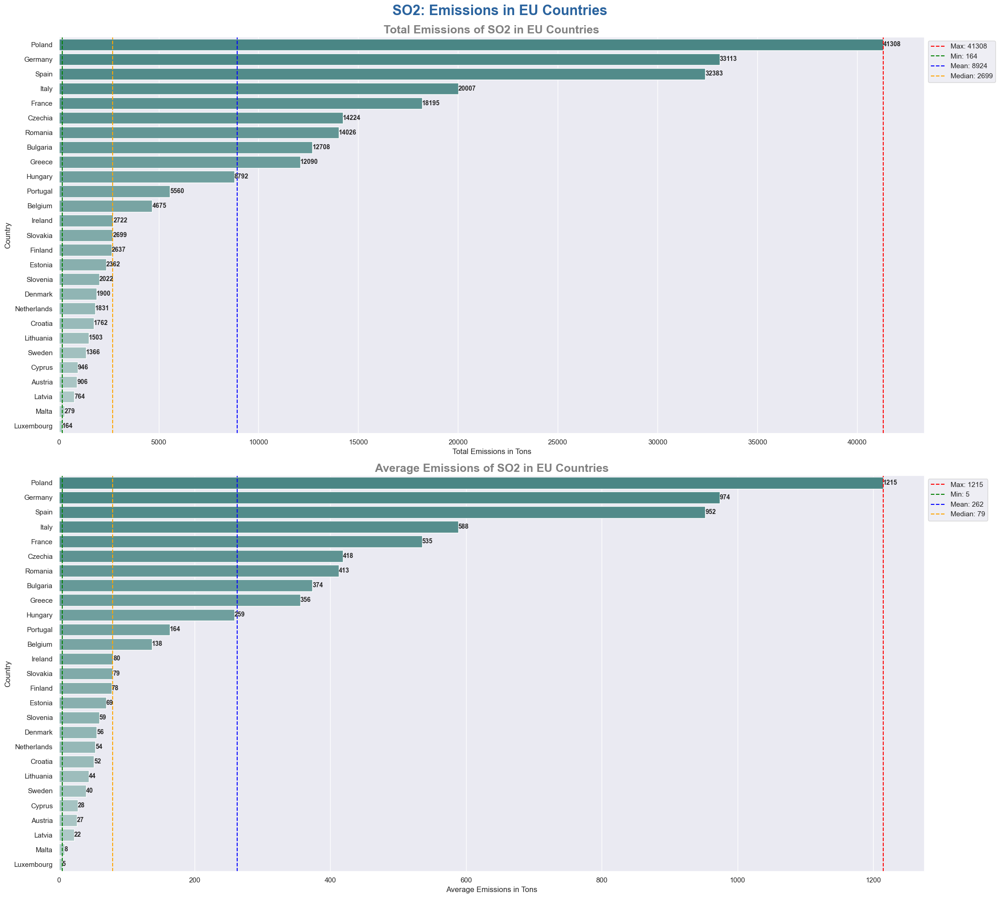

In [39]:
fig, ax = plt.subplots(2,1, figsize=(22, 20))

barplot_emissions_country(
    df_so2,
    'Total_Emissions',
    'Total Emissions of SO2 in EU Countries',
    ax=ax[0]
)
barplot_emissions_country(
    df_so2,
    'Average_Emissions',
    'Average Emissions of SO2 in EU Countries',
    ax=ax[1]
)
plt.suptitle('SO2: Emissions in EU Countries', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/SO2: Emissions in EU Countries', bbox_inches='tight')
plt.show()

Il biossido di zolfo (SO₂) è uno dei principali responsabili delle **piogge acide** e del degrado ambientale legato alla combustione di **carbone, gasolio e oli combustibili**.

📊 I paesi con le emissioni totali più elevate sono:
- 🇵🇱 **Polonia**: 41.308 tonnellate
- 🇩🇪 **Germania**
- 🇪🇸 **Spagna**
- 🇮🇹 **Italia**
- 🇫🇷 **Francia**

Questa classifica riflette la **presenza storica di impianti industriali, centrali termoelettriche e riscaldamenti a combustibile solido**.

📉 Le emissioni medie seguono la stessa tendenza, con 🇵🇱 Polonia nettamente in testa, e 🇩🇪 Germania a breve distanza.

📌 Alcuni paesi — 🇱🇺 **Lussemburgo**, 🇲🇹 **Malta**, 🇱🇻 **Lettonia** — presentano valori molto ridotti, in parte per la **ridotta scala industriale**, in parte grazie a **fonti energetiche più pulite**.

🧪 Il SO₂ ha un impatto locale fortemente visibile: contribuisce alla formazione di **nebbie acide**, degrada edifici e foreste e peggiora la qualità dell’aria soprattutto nelle zone urbane e montane.

📉 La sua riduzione è stata una priorità storica dell’Unione Europea fin dagli anni ’90, con **ottimi risultati** in molti paesi.

#### Lineplot: Trend

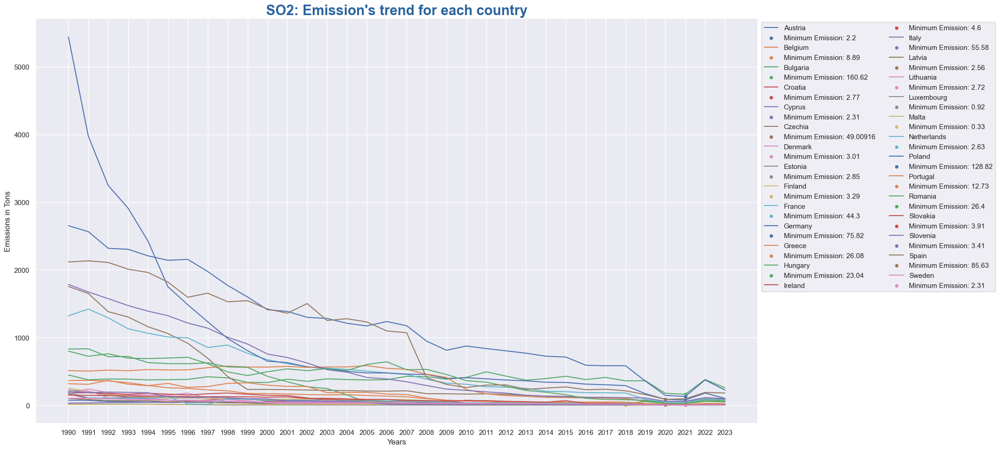

In [40]:
lineplot_trend_country(df_so2, 'SO2')

Il grafico mostra l’evoluzione delle emissioni di biossido di zolfo (SO₂), un inquinante strettamente legato alla **combustione di carbone, petrolio e altri combustibili fossili ad alto contenuto di zolfo**.

📉 Si evidenzia un **calo netto e costante** in quasi tutti i paesi, particolarmente marcato nei primi anni ’90.  
Tra i più virtuosi:
- 🇵🇱 **Polonia**
- 🇩🇪 **Germania**
- 🇪🇸 **Spagna**
- 🇨🇿 **Cechia**

Queste nazioni hanno registrato una **riduzione drastica grazie alla dismissione di centrali a carbone**, miglioramento dei sistemi di filtraggio e transizione verso fonti energetiche più pulite.

📌 I livelli si appiattiscono negli anni 2010–2020, segno che **la maggior parte della decarbonizzazione “facile” è già stata realizzata**.

🔍 Alcuni piccoli picchi possono coincidere con:
- crisi energetiche,
- variazioni stagionali del riscaldamento,
- variazioni nei dati di reporting.

💡 Questo è uno degli esempi più riusciti di **politiche ambientali efficaci su scala continentale**, con benefici diretti per la qualità dell’aria e la salute pubblica.

#### Barplot: Variazione Media

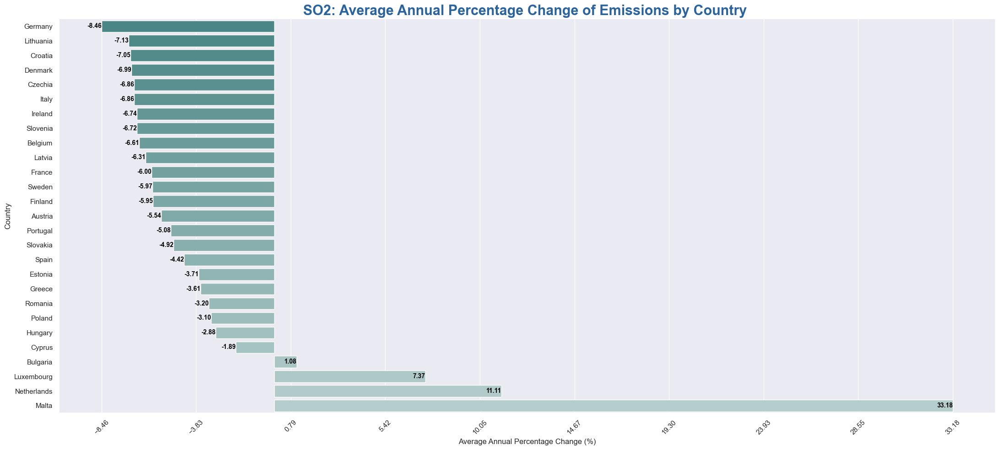

In [41]:
barplot_variation_country(df_so2, 'SO2')

Il grafico mostra la **media annuale di variazione** delle emissioni di biossido di zolfo (SO₂), un inquinante legato storicamente alla combustione di carbone e oli pesanti.

📉 Le riduzioni sono **tra le più significative tra tutti i gas analizzati**, grazie a decenni di interventi ambientali:

- 🇩🇪 **Germania**: -8.46% annuo
- 🇱🇹 **Lituania**: -7.13%
- 🇭🇷 **Croazia**: -7.05%
- 🇩🇰 **Danimarca**: -6.99%
- 🇨🇿 **Cechia**: -6.86%

🔻 In totale, **oltre 20 paesi mostrano variazioni negative superiori al -5% annuo**, segno di una transizione ormai consolidata.

⚠️ Al contrario:
- 🇲🇹 **Malta**: +33.18%
- 🇳🇱 **Paesi Bassi**: +11.11%
- 🇱🇺 **Lussemburgo**: +7.37%

Questi aumenti sono anomali e probabilmente legati a:
- oscillazioni su valori molto bassi,
- cambiamenti nei metodi di rilevazione,
- o specifici eventi industriali.

📌 Questo grafico conferma che **SO₂ è stato uno dei gas su cui l’UE ha ottenuto i risultati più rapidi ed evidenti** in termini di abbattimento, specialmente nel settore energetico e industriale.

#### Barplot: Emission per km2

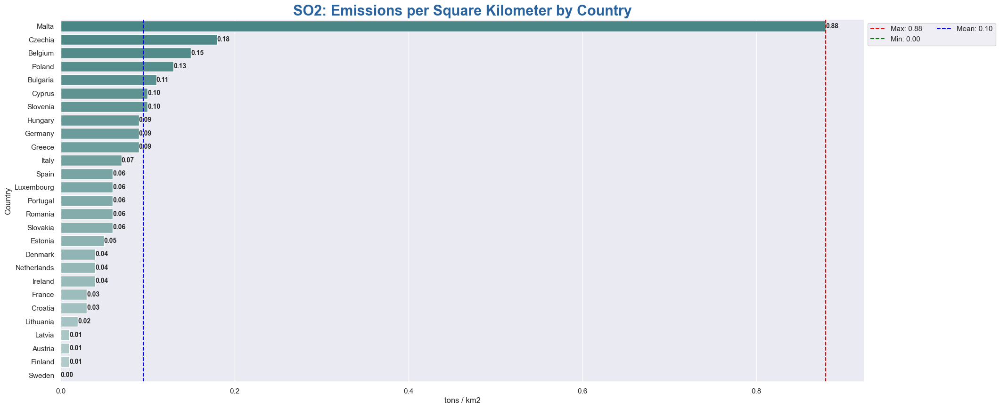

In [42]:
bla(df_so2, 'SO2')

Il grafico mostra l’intensità territoriale delle emissioni di biossido di zolfo (SO₂), espresse in tonnellate per chilometro quadrato.

📌 I paesi con le emissioni più dense sono:
- 🇲🇹 **Malta**: 0.88 t/km²
- 🇨🇿 **Cechia**: 0.18 t/km²
- 🇧🇪 **Belgio**: 0.15 t/km²
- 🇵🇱 **Polonia**: 0.13 t/km²

Questi paesi, in particolare Malta e Cechia, combinano **alta urbanizzazione, piccole dimensioni territoriali e presenza di industrie o centrali a combustibili fossili**.

🟢 Valori molto bassi (≤ 0.01 t/km²) sono registrati in:
- 🇸🇪 **Svezia**
- 🇫🇮 **Finlandia**
- 🇦🇹 **Austria**
- 🇱🇻 **Lettonia**

Questi paesi beneficiano di **ampie aree naturali e un mix energetico più pulito**, con maggiore uso di rinnovabili e riscaldamento elettrico.

📊 Le linee verticali indicano:
- 🔴 Massimo (Malta)
- 🔵 Media UE (0.10)
- 🟢 Minimo (Svezia, 0.00)

📉 In termini ambientali, l’**impatto locale del SO₂** è molto rilevante: anche in piccole quantità può compromettere ecosistemi e salute pubblica.

# Riepilogo

### 🌍 1. Tendenze generali

- Tutti i gas (CO₂, CH₄, N₂O, NOₓ, SO₂, GHG) mostrano una **tendenza generale alla riduzione** delle emissioni totali dal 1990 a oggi.
- Le **politiche ambientali europee**, in particolare nel settore energetico e dei trasporti, hanno avuto impatti concreti.
- L’anno 2020 segna in molti casi un **crollo temporaneo** delle emissioni, legato agli effetti della pandemia da COVID-19.

---

### 🏆 2. Paesi protagonisti

- 🇩🇪 **Germania** è costantemente tra i primi emettitori in valore assoluto per quasi tutti i gas, a causa della sua dimensione economica e industriale.
- 🇫🇷 **Francia**, 🇮🇹 **Italia**, 🇵🇱 **Polonia** e 🇪🇸 **Spagna** seguono con livelli elevati ma in progressiva riduzione.
- 🇲🇹 **Malta**, 🇱🇺 **Lussemburgo**, 🇨🇾 **Cipro** mostrano valori spesso alti **per km²**, a causa delle piccole dimensioni territoriali e della probabile industrializzazione.

---

# Analisi Esplorativa delle Energie Rinnovabili

Analisi dei dati sulla produzione di elettricità da fonti rinnovabili nei Paesi UE dal 2005 al 2023.  
Obiettivo: osservare tendenze e confronti tra Stati.

## EDA

### DF

In [43]:
df_renewable = pd.read_csv('datasets/Renewable_Electricity_Production_Dataset.csv')

In [44]:
df_renewable.rename(columns = {'Country and area':'Country'}, inplace = True)
df_renewable = filter_eu_countries(df_renewable)
display(df_renewable.head())
print(df_renewable.info())

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Austria,64.63,63.60,70.52,72.03,69.13,67.79,64.74,65.51,67.19,68.55,70.70,67.20,67.51,59.33,62.25,61.04,61.91,63.42,63.91,66.13,61.48,60.63,69.57,72.57,75.61,71.04,72.15,70.77,69.88,70.26,69.95,69.61,70.60,70.48
1,Belgium,1.27,1.37,1.61,1.45,1.65,1.67,1.59,1.63,1.81,1.78,2.04,2.11,1.88,1.66,2.04,2.41,2.63,2.73,3.16,3.29,3.97,5.58,8.18,10.10,12.88,15.03,12.27,14.13,13.43,13.43,14.84,13.26,13.81,13.11
2,Bulgaria,4.46,5.97,5.79,5.11,3.85,5.54,6.83,6.86,7.98,7.80,7.21,4.94,6.34,7.75,8.08,10.67,10.03,7.58,7.55,10.03,13.72,9.21,12.73,17.23,16.34,18.29,16.37,14.04,13.71,14.34,13.64,14.56,13.17,14.53
3,Croatia,NaN,NaN,48.85,47.57,61.95,61.27,70.38,57.22,52.61,56.47,57.36,56.36,46.34,41.64,55.20,54.33,51.81,38.55,46.01,56.10,62.88,47.16,49.56,65.86,72.97,64.97,63.48,56.54,56.86,57.86,56.41,57.11,58.18,57.59
4,Cyprus,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.02,0.04,0.06,0.08,0.71,2.56,4.39,6.48,6.11,7.65,7.61,8.09,6.85,8.27,7.69,7.68,7.48,7.67


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 35 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Country  27 non-null     object 
 1   1990     17 non-null     object 
 2   1991     18 non-null     float64
 3   1992     25 non-null     float64
 4   1993     25 non-null     float64
 5   1994     25 non-null     float64
 6   1995     25 non-null     float64
 7   1996     25 non-null     float64
 8   1997     25 non-null     float64
 9   1998     25 non-null     float64
 10  1999     25 non-null     float64
 11  2000     25 non-null     float64
 12  2001     25 non-null     float64
 13  2002     25 non-null     float64
 14  2003     25 non-null     float64
 15  2004     25 non-null     float64
 16  2005     27 non-null     float64
 17  2006     27 non-null     float64
 18  2007     27 non-null     float64
 19  2008     27 non-null     float64
 20  2009     27 non-null     float64
 21  2010     27 non-nu

#### Fillna, FACOLTATIVO

In [45]:
df_renewable_copy = df_renewable.copy()
df_renewable_copy, num_cols_renewable = convert_values_to_numeric(df_renewable_copy)
df_renewable_copy = df_renewable_copy.T
df_renewable_copy_data = df_renewable_copy.iloc[1:]
df_renewable_copy_data = df_renewable_copy_data.fillna(df_renewable_copy_data.mean(axis=0))

# Ricostruisci il dataframe originale, riaggiungendo la prima riga
df_renewable_copy_final = pd.concat([df_renewable_copy.iloc[:1], df_renewable_copy_data])

# Ruota di nuovo il dataframe
df_renewable_copy_final = df_renewable_copy_final.T
df_renewable_copy_final_data = df_renewable_copy_final.iloc[:, 1:]
df_renewable_copy_final_2, num_cols_renewable = convert_values_to_numeric(df_renewable_copy_final_data)
df_renewable_copy_final_2 = df_renewable_copy_final_2.round(2)
df_renewable = pd.concat([df_renewable_copy_final.iloc[:, 0], df_renewable_copy_final_2], axis=1)
df_renewable 

/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2665583228.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_renewable_copy_data = df_renewable_copy_data.fillna(df_renewable_copy_data.mean(axis=0))


,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Austria,64.63,63.60,70.52,72.03,69.13,67.79,64.74,65.51,67.19,68.55,70.70,67.20,67.51,59.33,62.25,61.04,61.91,63.42,63.91,66.13,61.48,60.63,69.57,72.57,75.61,71.04,72.15,70.77,69.88,70.26,69.95,69.61,70.60,70.48
1,Belgium,1.27,1.37,1.61,1.45,1.65,1.67,1.59,1.63,1.81,1.78,2.04,2.11,1.88,1.66,2.04,2.41,2.63,2.73,3.16,3.29,3.97,5.58,8.18,10.10,12.88,15.03,12.27,14.13,13.43,13.43,14.84,13.26,13.81,13.11
2,Bulgaria,4.46,5.97,5.79,5.11,3.85,5.54,6.83,6.86,7.98,7.80,7.21,4.94,6.34,7.75,8.08,10.67,10.03,7.58,7.55,10.03,13.72,9.21,12.73,17.23,16.34,18.29,16.37,14.04,13.71,14.34,13.64,14.56,13.17,14.53
3,Croatia,55.86,55.86,48.85,47.57,61.95,61.27,70.38,57.22,52.61,56.47,57.36,56.36,46.34,41.64,55.20,54.33,51.81,38.55,46.01,56.10,62.88,47.16,49.56,65.86,72.97,64.97,63.48,56.54,56.86,57.86,56.41,57.11,58.18,57.59
4,Cyprus,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,4.71,0.02,0.02,0.04,0.06,0.08,0.71,2.56,4.39,6.48,6.11,7.65,7.61,8.09,6.85,8.27,7.69,7.68,7.48,7.67
5,Czechia,5.14,5.14,2.76,2.71,3.03,3.74,3.74,3.22,2.89,3.43,3.15,3.30,3.73,2.16,3.05,3.69,3.92,3.01,3.15,4.09,5.14,6.09,6.29,7.17,6.56,7.14,7.11,6.81,7.11,8.80,9.12,9.01,9.12,10.15
6,Denmark,2.46,2.09,3.07,3.13,2.88,3.35,2.39,4.50,7.02,7.96,11.96,11.53,12.53,12.13,16.38,18.32,13.45,18.32,19.00,18.54,20.16,27.84,33.85,33.54,42.54,50.99,44.36,51.55,51.00,49.24,49.74,51.15,49.66,49.88
7,Estonia,2.47,2.47,0.01,0.01,0.03,0.02,0.02,0.03,0.05,0.05,0.06,0.08,0.08,0.19,0.29,0.74,0.92,0.92,1.52,2.59,2.34,3.09,3.98,4.18,5.07,7.14,5.17,5.84,5.79,6.27,5.67,5.77,5.37,5.75
8,Finland,19.97,22.76,26.18,22.07,17.97,20.20,17.11,17.72,21.48,18.47,21.34,18.07,14.78,11.78,18.00,20.13,14.46,18.00,22.99,18.40,16.77,18.00,25.11,19.52,21.74,28.21,27.86,29.85,29.16,29.02,30.15,29.62,30.68,29.90
9,France,13.77,13.62,15.77,14.48,17.11,15.52,13.79,13.49,13.04,14.77,13.28,14.40,11.91,11.50,11.49,10.03,11.20,11.96,13.04,13.20,13.82,11.56,14.90,17.11,16.52,15.67,17.18,16.73,16.11,16.66,16.29,15.39,16.27,15.79


### Top Country 2023

In [46]:
top_renewable_2023 = df_renewable[['Country','2023']].copy().sort_values(by='2023', ascending=False).reset_index(drop=True)

### Barplot Top Country 2023

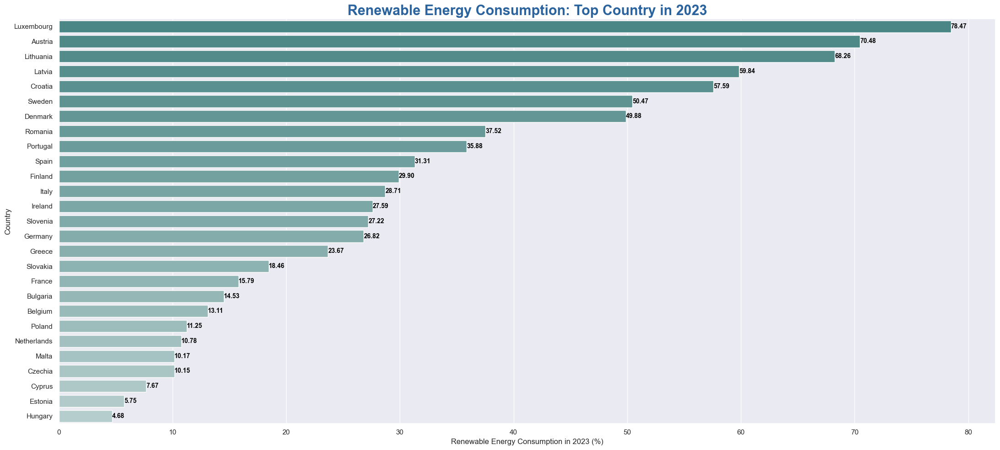

In [47]:
plt.figure(figsize=(22, 10))

colori = sns.light_palette('#40908E', n_colors=1.5*len(top_renewable_2023), reverse=True)
sns.barplot(
    data = top_renewable_2023,
    x = '2023',
    y = 'Country',
    hue = 'Country',
    palette = colori
)
plt.title('Renewable Energy Consumption: Top Country in 2023', fontsize=22, fontweight='bold', color='#2A639E')
plt.xlabel('Renewable Energy Consumption in 2023 (%)')
plt.ylabel('Country')
plt.tight_layout()
for i, value in enumerate(top_renewable_2023['2023']):
        plt.text(
            x = value,  # posizione X (più a sinistra)
            y = i,     # posizione Y (la riga della barra)
            s = f'{value:.2F}',  # cosa scrivere
            va = 'center',  # vertical alignment
            ha = 'left',   # horizontal alignment
            fontsize = 10,
            color = 'black',
            fontweight = 'bold'
        )
plt.savefig('img/Renewable Energy Consumption: Top Country in 2023', bbox_inches='tight')
plt.show()

Il grafico mostra la percentuale di consumo da fonti rinnovabili per ciascun paese UE nel 2023.

- 🥇 In testa: 🇱🇺 Lussemburgo (78.47%), 🇦🇹 Austria (70.48%), 🇱🇹 Lituania (68.26%).
- 🇸🇪 🇩🇰 🇱🇻 superano il 50%, segnale di una forte integrazione delle rinnovabili nel mix energetico.
- 🇮🇹 Italia si attesta al 28.7%, in posizione intermedia tra grandi economie.
- ⚠️ Ultimi posti: 🇭🇺 Ungheria (4.68%), 🇪🇪 Estonia (5.75%) e 🇨🇾 Cipro (7.67%).

### Lineplot Trend: 2005-2023

#### DataFrame con dati dal 2005

In [48]:
df_renewable_from_2005 = df_renewable.copy()
df_renewable_from_2005 = df_renewable_from_2005.loc[:, '2005':]
country = df_renewable['Country'].copy()
df_renewable_from_2005 = pd.concat([country, df_renewable_from_2005], axis=1)
df_renewable_from_2005

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Austria,61.04,61.91,63.42,63.91,66.13,61.48,60.63,69.57,72.57,75.61,71.04,72.15,70.77,69.88,70.26,69.95,69.61,70.60,70.48
1,Belgium,2.41,2.63,2.73,3.16,3.29,3.97,5.58,8.18,10.10,12.88,15.03,12.27,14.13,13.43,13.43,14.84,13.26,13.81,13.11
2,Bulgaria,10.67,10.03,7.58,7.55,10.03,13.72,9.21,12.73,17.23,16.34,18.29,16.37,14.04,13.71,14.34,13.64,14.56,13.17,14.53
3,Croatia,54.33,51.81,38.55,46.01,56.10,62.88,47.16,49.56,65.86,72.97,64.97,63.48,56.54,56.86,57.86,56.41,57.11,58.18,57.59
4,Cyprus,0.02,0.02,0.04,0.06,0.08,0.71,2.56,4.39,6.48,6.11,7.65,7.61,8.09,6.85,8.27,7.69,7.68,7.48,7.67
5,Czechia,3.69,3.92,3.01,3.15,4.09,5.14,6.09,6.29,7.17,6.56,7.14,7.11,6.81,7.11,8.80,9.12,9.01,9.12,10.15
6,Denmark,18.32,13.45,18.32,19.00,18.54,20.16,27.84,33.85,33.54,42.54,50.99,44.36,51.55,51.00,49.24,49.74,51.15,49.66,49.88
7,Estonia,0.74,0.92,0.92,1.52,2.59,2.34,3.09,3.98,4.18,5.07,7.14,5.17,5.84,5.79,6.27,5.67,5.77,5.37,5.75
8,Finland,20.13,14.46,18.00,22.99,18.40,16.77,18.00,25.11,19.52,21.74,28.21,27.86,29.85,29.16,29.02,30.15,29.62,30.68,29.90
9,France,10.03,11.20,11.96,13.04,13.20,13.82,11.56,14.90,17.11,16.52,15.67,17.18,16.73,16.11,16.66,16.29,15.39,16.27,15.79


In [49]:
df_renewable_from_2005_mean = pd.DataFrame(data = df_renewable_from_2005.iloc[:,1:].mean(axis=1).values, columns= ['Renewable_Energy_Consumption_Mean'], index = df_renewable_from_2005['Country'])
df_renewable_from_2005_mean

,Renewable_Energy_Consumption_Mean
Country,
Austria,67.947895
Belgium,9.381053
Bulgaria,13.038947
Croatia,56.538421
Cyprus,4.708421
Czechia,6.498947
Denmark,36.480526
Estonia,4.111579
Finland,24.187895


#### Lineplot

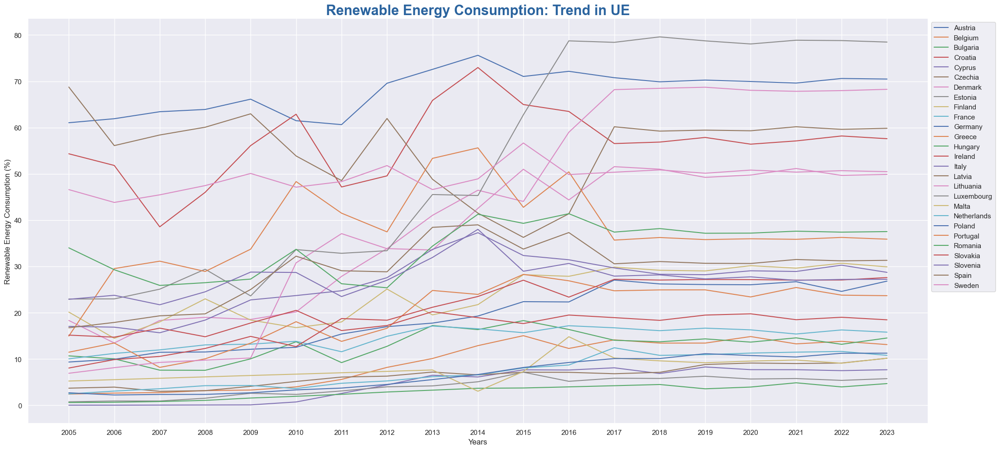

In [50]:
plt.figure(figsize=(22, 10))
for country in df_renewable_from_2005['Country']:
    country_data = df_renewable_from_2005[df_renewable_from_2005['Country'] == country]

    sns.lineplot(
        x = country_data.columns[1:],
        y = country_data.iloc[0, 1:],
        label = country
    )
plt.title(f'Renewable Energy Consumption: Trend in UE', fontsize=22, fontweight='bold', color='#2A639E')
plt.xlabel('Years')
plt.ylabel('Renewable Energy Consumption (%)')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.savefig('img/Renewable Energy Consumption: Trend in UE', bbox_inches='tight')
plt.show()

Il grafico mostra l’andamento della quota di consumo da fonti rinnovabili nei paesi europei.

- 📈 Crescita evidente in molti Stati: 🇱🇺 Lussemburgo, 🇱🇹 Lituania, 🇦🇹 Austria superano il 60–70%.
- 🇮🇹 Italia e 🇩🇪 Germania mostrano un miglioramento graduale e stabile.
- 🇭🇺 Ungheria e 🇪🇪 Estonia restano in coda, con trend piatti o minimi aumenti.
- Alcuni paesi (es. 🇸🇪 Svezia, 🇩🇰 Danimarca) mostrano lievi fluttuazioni dopo una crescita iniziale.

📌 In generale, il grafico evidenzia **un’adozione progressiva ma non uniforme** delle rinnovabili all’interno dell’UE.

## Barplot Variation

In [51]:
def get_variation(df):
    num_cols = df.columns[df.columns != 'Country']
    df_years = df[num_cols].copy()
    df_variation = df_years.pct_change(axis='columns') * 100
    df['Variazione_percentuale_media'] = df_variation.mean(axis='columns')  # variazione percentuale media
    return df

In [52]:
a = get_variation(df_renewable_from_2005)

In [53]:
a

,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Variazione_percentuale_media
0,Austria,61.04,61.91,63.42,63.91,66.13,61.48,60.63,69.57,72.57,75.61,71.04,72.15,70.77,69.88,70.26,69.95,69.61,70.60,70.48,0.897758
1,Belgium,2.41,2.63,2.73,3.16,3.29,3.97,5.58,8.18,10.10,12.88,15.03,12.27,14.13,13.43,13.43,14.84,13.26,13.81,13.11,11.059746
2,Bulgaria,10.67,10.03,7.58,7.55,10.03,13.72,9.21,12.73,17.23,16.34,18.29,16.37,14.04,13.71,14.34,13.64,14.56,13.17,14.53,3.691080
3,Croatia,54.33,51.81,38.55,46.01,56.10,62.88,47.16,49.56,65.86,72.97,64.97,63.48,56.54,56.86,57.86,56.41,57.11,58.18,57.59,1.368834
4,Cyprus,0.02,0.02,0.04,0.06,0.08,0.71,2.56,4.39,6.48,6.11,7.65,7.61,8.09,6.85,8.27,7.69,7.68,7.48,7.67,76.331310
5,Czechia,3.69,3.92,3.01,3.15,4.09,5.14,6.09,6.29,7.17,6.56,7.14,7.11,6.81,7.11,8.80,9.12,9.01,9.12,10.15,6.541911
6,Denmark,18.32,13.45,18.32,19.00,18.54,20.16,27.84,33.85,33.54,42.54,50.99,44.36,51.55,51.00,49.24,49.74,51.15,49.66,49.88,6.954789
7,Estonia,0.74,0.92,0.92,1.52,2.59,2.34,3.09,3.98,4.18,5.07,7.14,5.17,5.84,5.79,6.27,5.67,5.77,5.37,5.75,14.634654
8,Finland,20.13,14.46,18.00,22.99,18.40,16.77,18.00,25.11,19.52,21.74,28.21,27.86,29.85,29.16,29.02,30.15,29.62,30.68,29.90,3.733431
9,France,10.03,11.20,11.96,13.04,13.20,13.82,11.56,14.90,17.11,16.52,15.67,17.18,16.73,16.11,16.66,16.29,15.39,16.27,15.79,2.996118


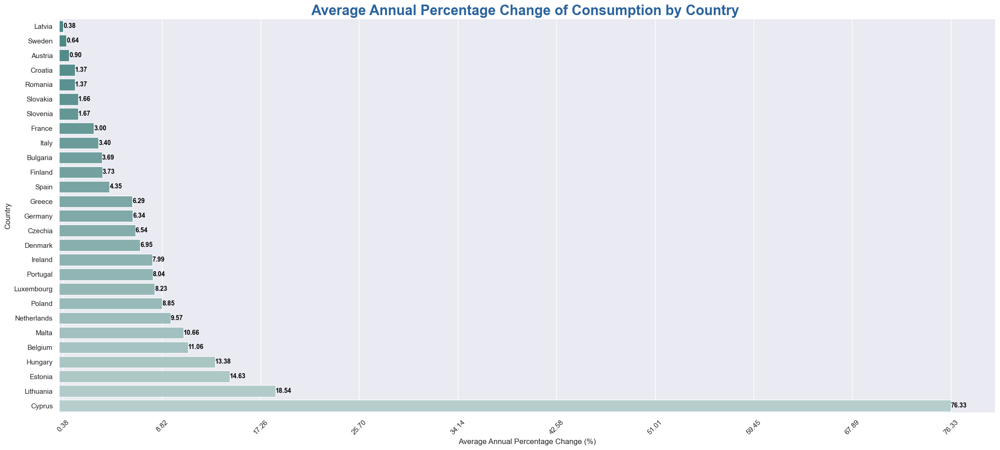

In [54]:
plt.figure(figsize=(22, 10))

colori = sns.light_palette('#40908E', n_colors=1.5*len(a), reverse=True)

sns.barplot(x='Variazione_percentuale_media',
            y='Country', 
            data=a.sort_values(by='Variazione_percentuale_media', ascending=True),
            hue='Country',
            palette=colori
            )

plt.title(f'Average Annual Percentage Change of Consumption by Country ', fontsize=22, fontweight='bold', color='#2A639E')
plt.xlabel('Average Annual Percentage Change (%)')
plt.ylabel('Country')

plt.xticks(ticks=np.linspace(a['Variazione_percentuale_media'].min(), a['Variazione_percentuale_media'].max(), 10), rotation=45)
plt.tight_layout()
for i, value in enumerate(a['Variazione_percentuale_media'].sort_values(ascending=True)):
        plt.text(
            x = value,  # posizione X (più a sinistra)
            y = i,     # posizione Y (la riga della barra)
            s = f'{value:.2F}',  # cosa scrivere
            va = 'center',  # vertical alignment
            ha = 'left',   # horizontal alignment
            fontsize = 10,
            color = 'black',
            fontweight = 'bold'
        )
plt.savefig(f'img/Average Annual Percentage Change of Consumption by Country ', bbox_inches = 'tight')
plt.show()

Il grafico mostra la media percentuale annua di crescita del consumo da fonti rinnovabili (2004–2023).

- 🚀 Crescite più rapide in:
  - 🇨🇾 Cipro (+76.33%)
  - 🇱🇹 Lituania (+18.54%)
  - 🇪🇪 Estonia, 🇭🇺 Ungheria e 🇧🇪 Belgio (+10–14%)

- 🇲🇹 Malta, 🇳🇱 Olanda e 🇵🇱 Polonia mostrano ottime performance (>8%), pur partendo da valori bassi.
- 🇮🇹 Italia +3.4% annuo: **crescita moderata ma costante**.
- ⚠️ 🇱🇻 Lettonia e 🇸🇪 Svezia crescono lentamente: possibile saturazione, essendo già tra i top performer.

# Correlazioni tra Emissioni ed Edergie Rinnovabili

Confronto tra emissioni di gas serra e produzione da fonti rinnovabili.  
Analisi delle correlazioni per verificare relazioni inverse o dirette.

In [55]:
df_ch4_corr, df_ch4_renewable = calculate_correlation(df_ch4, 'CH4')
df_co2_corr, df_co2_renewable = calculate_correlation(df_co2, 'CO2')
df_ghg_corr, df_ghg_renewable = calculate_correlation(df_ghg, 'GHG')
df_n2o_corr, df_n2o_renewable = calculate_correlation(df_n2o, 'N2O')
df_nox_corr, df_nox_renewable = calculate_correlation(df_nox, 'NOx')
df_so2_corr, df_so2_renewable = calculate_correlation(df_so2, 'SO2')

Correlazione tra CH4 e consumo di energia rinnovabile: -0.22
Correlazione tra CO2 e consumo di energia rinnovabile: -0.20
Correlazione tra GHG e consumo di energia rinnovabile: -0.18
Correlazione tra N2O e consumo di energia rinnovabile: -0.21
Correlazione tra NOx e consumo di energia rinnovabile: -0.17
Correlazione tra SO2 e consumo di energia rinnovabile: -0.30


- Tutte le correlazioni sono **negative**, suggerendo che all’aumentare dell’uso delle rinnovabili, **le emissioni tendono a diminuire**.
- La relazione non è fortissima (coeff. tra -0.17 e -0.30), ma comunque significativa sul piano ambientale.
- Il legame più marcato si osserva tra **SO₂ e rinnovabili (-0.30)**, coerente con la riduzione del carbone e delle fonti fossili.

✅ Questo supporta l’idea che la transizione energetica verso fonti pulite **aiuta a contenere le emissioni climalteranti**.

### barplot

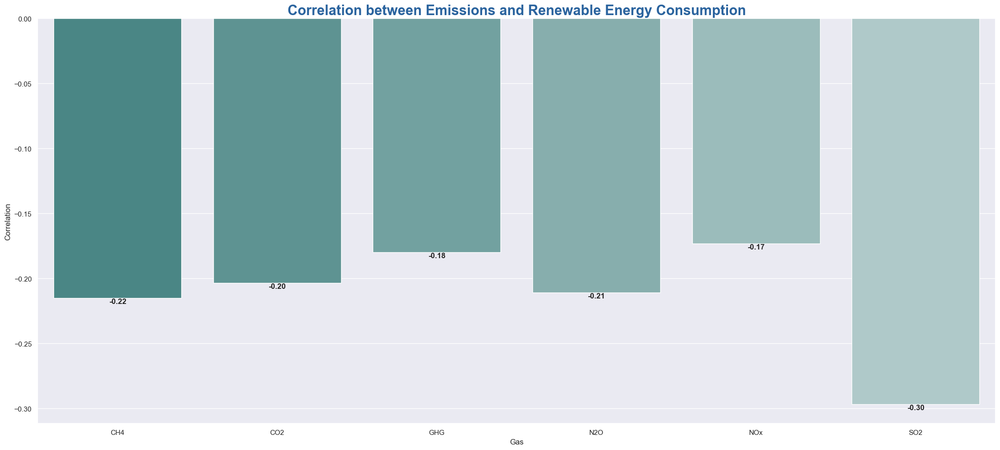

In [56]:
dict_correlation = {
    'CH4': df_ch4_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean'],
    'CO2': df_co2_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean'],
    'GHG': df_ghg_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean'],
    'N2O': df_n2o_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean'],
    'NOx': df_nox_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean'],
    'SO2': df_so2_corr.loc['Total_Emissions', 'Renewable_Energy_Consumption_Mean']
}
plt.figure(figsize=(22, 10))
sns.barplot(
    x = dict_correlation.keys(),
    y = dict_correlation.values(),
    hue = dict_correlation.keys(),
    palette = sns.light_palette('#40908E', n_colors=1.5*len(dict_correlation), reverse=True)
)
for i, (gas, value) in enumerate(dict_correlation.items()):
    plt.text(
        x=i,
        y=value,
        s=f'{value:.2f}',
        ha='center',
        va='top',
        fontsize=12,
        fontweight = 'bold'
    )
plt.title('Correlation between Emissions and Renewable Energy Consumption', fontsize=22, fontweight='bold', color='#2A639E')
plt.xlabel('Gas')
plt.ylabel('Correlation')
plt.tight_layout()
plt.savefig('img/Correlation between Emissions and Renewable Energy Consumption', bbox_inches = 'tight')
plt.show()

## Scatterplot

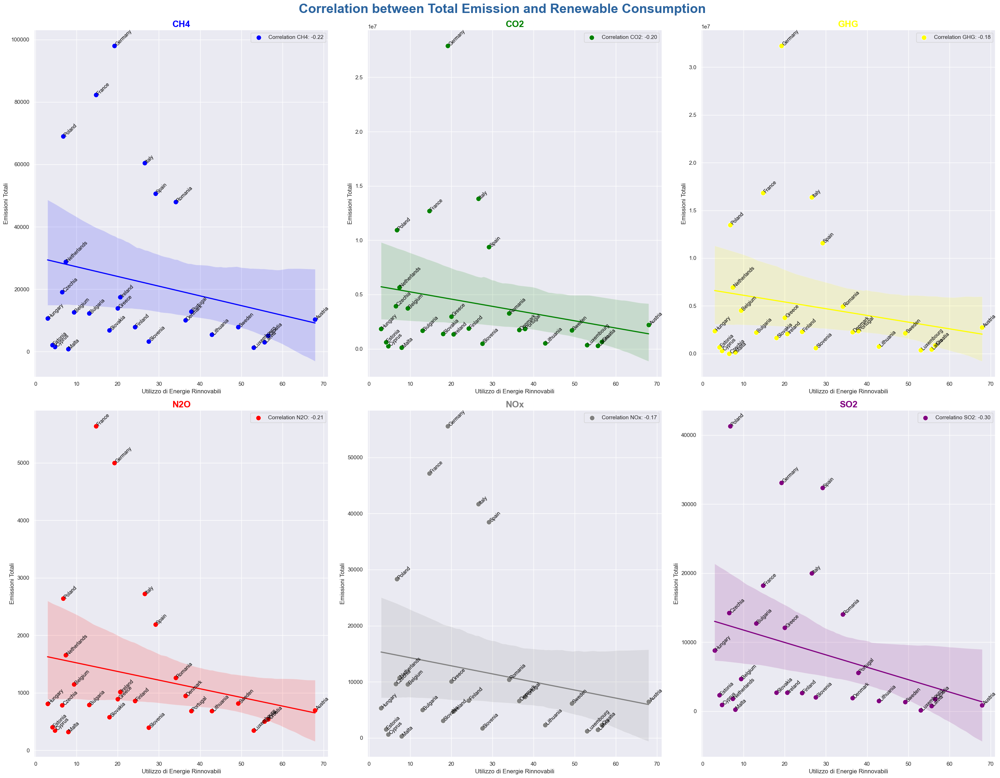

In [57]:
fig, ax = plt.subplots(2,3, figsize=(28, 22))

# Grafico per CH4
sns.scatterplot(
    data = df_ch4_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    label = f'Correlation CH4: {dict_correlation["CH4"]:.2f}',
    s = 100,
    ax = ax[0,0],
    color = 'blue'
)
sns.regplot(
    data = df_ch4_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    ax = ax[0,0],
    color = 'blue'
)
for country in df_ch4_renewable['Country']:
    country_data = df_ch4_renewable[df_ch4_renewable['Country'] == country]
    ax[0,0].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[0,0].set_title('CH4', fontsize=18, fontweight='bold', color='blue')
ax[0,0].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[0,0].set_ylabel('Emissioni Totali')

# Grafico per CO2
sns.scatterplot(
    data = df_co2_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'green',
    label = f'Correlation CO2: {dict_correlation["CO2"]:.2f}',
    s = 100,
    ax = ax[0,1]
)
sns.regplot(
    data = df_co2_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'green',
    ax = ax[0,1]
)
for country in df_co2_renewable['Country']:
    country_data = df_co2_renewable[df_co2_renewable['Country'] == country]
    ax[0,1].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[0,1].set_title('CO2', fontsize=18, fontweight='bold', color='green')
ax[0,1].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[0,1].set_ylabel('Emissioni Totali')
# Grafico per GHG
sns.scatterplot(
    data = df_ghg_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'yellow',
    label = f'Correlation GHG: {dict_correlation["GHG"]:.2f}',
    s = 100,
    ax = ax[0,2]
)
sns.regplot(
    data = df_ghg_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'yellow',
    ax = ax[0,2] 
)
for country in df_ghg_renewable['Country']:
    country_data = df_ghg_renewable[df_ghg_renewable['Country'] == country]
    ax[0,2].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[0,2].set_title('GHG', fontsize=18, fontweight='bold', color='yellow')
ax[0,2].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[0,2].set_ylabel('Emissioni Totali')
# Grafico per N2O
sns.scatterplot(
    data = df_n2o_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'red',
    label = f'Correlation N2O: {dict_correlation["N2O"]:.2f}',
    s = 100,
    ax = ax[1,0]
)
sns.regplot(
    data = df_n2o_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'red',
    ax = ax[1,0]
)
for country in df_n2o_renewable['Country']:
    country_data = df_n2o_renewable[df_n2o_renewable['Country'] == country]
    ax[1,0].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[1,0].set_title('N2O', fontsize=18, fontweight='bold', color='red')
ax[1,0].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[1,0].set_ylabel('Emissioni Totali')
# Grafico per NOX
sns.scatterplot(
    data = df_nox_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'grey',
    label = f'Correlation NOx: {dict_correlation["NOx"]:.2f}',
    s = 100,
    ax = ax[1,1]
)
sns.regplot(
    data = df_nox_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'grey',
    ax = ax[1,1]
)
for country in df_nox_renewable['Country']:
    country_data = df_nox_renewable[df_nox_renewable['Country'] == country]
    ax[1,1].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[1,1].set_title('NOx', fontsize=18, fontweight='bold', color='grey')
ax[1,1].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[1,1].set_ylabel('Emissioni Totali')
# Grafico per SO2
sns.scatterplot(
    data = df_so2_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'purple',
    label = f'Correlatino SO2: {dict_correlation["SO2"]:.2f}',
    s = 100,
    ax = ax[1,2]
)
sns.regplot(
    data = df_so2_renewable,
    x = 'Renewable_Energy_Consumption_Mean',
    y = 'Total_Emissions',
    color = 'purple',
    ax = ax[1,2]
)
for country in df_so2_renewable['Country']:
    country_data = df_so2_renewable[df_so2_renewable['Country'] == country]
    ax[1,2].text(
        x = country_data['Renewable_Energy_Consumption_Mean'].values[0],
        y = country_data['Total_Emissions'].values[0],
        s = country,
        fontsize = 10,
        rotation = 45,
        color = 'black'
    )
ax[1,2].set_title('SO2', fontsize=18, fontweight='bold', color='purple')
ax[1,2].set_xlabel('Utilizzo di Energie Rinnovabili')
ax[1,2].set_ylabel('Emissioni Totali')
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.suptitle('Correlation between Total Emission and Renewable Consumption', fontsize=26, fontweight='bold', color='#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig('img/Correlation between Total Emission and Renewable Consumption', bbox_inches = 'tight')
plt.show()

Il grafico mostra la relazione tra il consumo di energia da fonti rinnovabili (%) e le emissioni totali per ciascun gas nei paesi UE.

---

**Osservazioni principali:**

- Tutti i grafici mostrano una **tendenza decrescente**, confermando le correlazioni negative già calcolate.
- La relazione **più evidente** si osserva per:
  - 🟣 **SO₂** (corr = -0.30)
  - 🔵 **CH₄** e 🔴 **N₂O** (corr = -0.22 / -0.21)
- Alcuni gas (es. **GHG** e **NOₓ**) mostrano una correlazione più debole ma comunque **negativa e coerente**.

📌 I paesi con maggiore utilizzo di rinnovabili (es. 🇱🇺 Lussemburgo, 🇦🇹 Austria, 🇱🇹 Lituania) si collocano **nelle aree inferiori sinistre** della griglia, con basse emissioni.

✅ Queste evidenze visive rafforzano il ruolo strategico delle fonti rinnovabili nella **riduzione delle emissioni climalteranti**.

## Confronto emissioni e energie rinnovabili

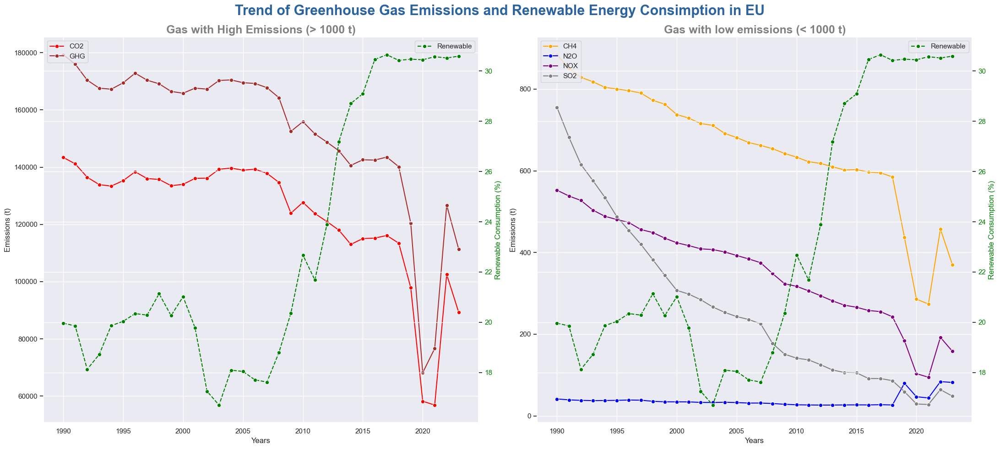

In [58]:
anno = [int(anno) for anno in df_ch4.columns[1:-7]]
media_ch4 = [df_ch4[anno].mean(axis=0) for anno in df_ch4.columns[1:-7]]
media_co2 = [df_co2[anno].mean(axis=0) for anno in df_co2.columns[1:-7]]
media_ghg = [df_ghg[anno].mean(axis=0) for anno in df_ghg.columns[1:-7]]
media_n2o = [df_n2o[anno].mean(axis=0) for anno in df_n2o.columns[1:-7]]
media_nox = [df_nox[anno].mean(axis=0) for anno in df_nox.columns[1:-7]]
media_so2 = [df_so2[anno].mean(axis=0) for anno in df_so2.columns[1:-7]]
media_renewable = [
    pd.to_numeric(df_renewable[anno], errors='coerce').mean()
    for anno in df_renewable.columns[1:]
]

fig, ax = plt.subplots(1, 2, figsize=(22, 10), sharex=True)

# Primo grafico: gas con emissioni più alte
ax1_2 = ax[0].twinx()
sns.lineplot(
    x=anno, 
    y=media_co2, 
    ax=ax[0],            
    label='CO2', 
    color='red',
    marker='o'
    )
sns.lineplot(
    x=anno, 
    y=media_ghg, 
    ax=ax[0], 
    label='GHG', 
    color='brown',
    marker='o'
    )
sns.lineplot(
    x=anno,
    y=media_renewable, 
    ax=ax1_2, 
    label='Renewable', 
    color='green', 
    linestyle='--',
    marker='o'
    )

ax[0].set_title("Gas with High Emissions (> 1000 t)", fontsize=18, fontweight='bold', color='grey')
ax[0].set_xlabel("Years")
ax[0].set_ylabel("Emissions (t)")
ax1_2.set_ylabel("Renewable Consumption (%)", color='green')
ax1_2.tick_params(axis='y', labelcolor='green')

# Secondo grafico: gas con emissioni più basse
ax2_2 = ax[1].twinx()
sns.lineplot(
    x=anno, 
    y=media_ch4, 
    ax=ax[1], 
    label='CH4', 
    color='orange',
    marker='o'
    )
sns.lineplot(
    x=anno, 
    y=media_n2o, 
    ax=ax[1], 
    label='N2O', 
    color='blue',
    marker='o'
    )
sns.lineplot(
    x=anno, 
    y=media_nox, 
    ax=ax[1], 
    label='NOX', 
    color='purple',
    marker='o'
    )
sns.lineplot(
    x=anno, 
    y=media_so2, 
    ax=ax[1], 
    label='SO2', 
    color='grey',
    marker='o'
    )
sns.lineplot(
    x=anno, 
    y=media_renewable, 
    ax=ax2_2, 
    label='Renewable', 
    color='green', 
    marker='o',
    linestyle='--'
    )

ax[1].set_title("Gas with low emissions (< 1000 t)", fontsize=18, fontweight='bold', color='grey')
ax[1].set_xlabel("Years")
ax[1].set_ylabel("Emissions (t)")
ax2_2.set_ylabel("Renewable Consumption (%)", color='green')
ax2_2.tick_params(axis='y', labelcolor='green')

# Legende
ax[0].legend(loc='upper left')
ax[1].legend(loc='upper left')
plt.suptitle("Trend of Greenhouse Gas Emissions and Renewable Energy Consimption in EU", fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout()
plt.savefig("img/Trend of Greenhouse Gas Emissions and Renewable Energy Consimption in EU", bbox_inches='tight')
plt.show()

Il grafico confronta l’andamento delle emissioni totali di gas serra con la crescita del consumo di energia da fonti rinnovabili nell’Unione Europea. Presenta un doppio asse y, quello di sinistra (per le emissioni) in tonnellate, quello di destra (per le energie rinnovabili) in %

---

🔴 **Gas con emissioni elevate** (CO₂ e GHG):
- Mostrano un trend discendente costante, **soprattutto dal 2010**.
- La riduzione è più evidente dopo il **forte aumento delle rinnovabili (dal 2010 in poi)**.

🟡 **Gas con basse emissioni** (CH₄, N₂O, NOₓ, SO₂):
- Anche questi in **progressiva riduzione**,
- Notabili crolli nel 2020 legati alla **pandemia**, seguiti da riprese parziali.

---

✅ **Insight chiave**:
- L’**aumento del consumo di energia rinnovabile** (in verde) coincide con una **riduzione continua delle emissioni**.
- Questo rafforza l’evidenza che le rinnovabili **contribuiscono attivamente alla decarbonizzazione dell’UE**.

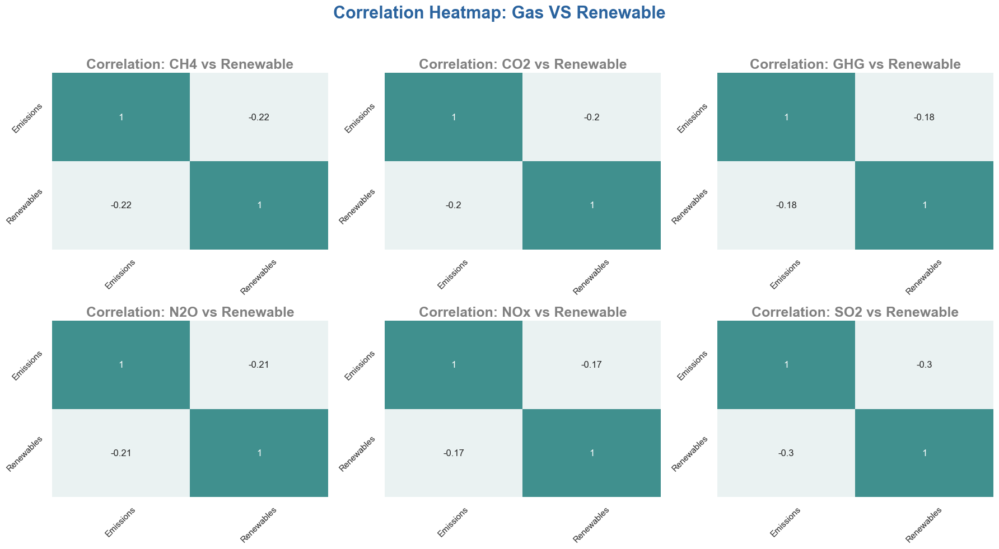

In [59]:
fig, ax = plt.subplots(2, 3, figsize=(18, 10))  # 2 righe, 3 colonne
dfs_corr = [df_ch4_corr, df_co2_corr, df_ghg_corr, df_n2o_corr, df_nox_corr, df_so2_corr]
gas = ['CH4', 'CO2', 'GHG', 'N2O', 'NOx', 'SO2']

for i, df_corr in enumerate(dfs_corr):
    row, col = divmod(i, 3)  # Cambia da 2 a 3
    sns.heatmap(df_corr, annot=True, cmap=sns.light_palette('#40908E'), ax=ax[row, col], cbar=False)
    ax[row, col].set_title(f'Correlation: {gas[i]} vs Renewable', fontsize = 18, color = 'grey', fontweight = 'bold')
    ax[row, col].set_xticklabels(['Emissions', 'Renewables'], rotation=45)
    ax[row, col].set_yticklabels(['Emissions', 'Renewables'], rotation=45)
plt.suptitle('Correlation Heatmap: Gas VS Renewable', fontsize = 22, fontweight = 'bold', color = '#2A639E')
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Spazio per il titolo
plt.savefig('img/Correlation Heatmap: Gas VS Renewable', bbox_inches = 'tight')
plt.show()

# Analisi Predittive

Applichiamo modelli di regressione e deep learning per stimare le emissioni future nei Paesi UE fino al 2035.


## DataFrame

In [60]:
df_ch4 = df_ch4.iloc[:, :-7].copy()
df_co2 = df_co2.iloc[:, :-7].copy()
df_ghg = df_ghg.iloc[:, :-7].copy()
df_n2o = df_n2o.iloc[:, :-7].copy()
df_nox = df_nox.iloc[:, :-7].copy()
df_so2 = df_so2.iloc[:, :-7].copy()


## Funzione Melt

In [61]:
def melt_dataframe(df):
    """
    Funzione per trasformare un DataFrame in formato lungo.
    
    Args:
        df (DataFrame): DataFrame da trasformare.
    
    Returns:
        DataFrame: DataFrame trasformato in formato lungo.
    """
    df_melt = df.melt(id_vars=['Country'], var_name='Year', value_name='Emissions')
    df_melt['Year'] = df_melt['Year'].astype(int)
    df_melt['Emissions'] = df_melt['Emissions'].astype(float)
    df_melt = df_melt.sort_values(by=['Country', 'Year']).reset_index(drop=True)

    
    return df_melt

## CO2

## DataFrame

In [62]:
df_melt_co2 = melt_dataframe(df_co2)

### Linear Regression

In [63]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_co2['Country'].unique():
    df_country = df_melt_co2[df_melt_co2['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Emissions'].values

    # Inizializzo i migliori valori
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X, y)
                y_pred = model.predict(X)
                y_future = model.predict(future_years)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Country': country,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Country': country,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_linear_co2 = pd.DataFrame(metric_list)
df_prediction_linear_co2 = pd.DataFrame(prediction_list)
df_confronto_linear_co2 = pd.DataFrame(confronto_list)

In [64]:
df_metrics_linear_co2

,Country,R2,RMSE,fit_intercept,copy_X,positive
0,Austria,0.134555,9794.724758,True,True,False
1,Belgium,0.645648,12352.978660,True,True,False
2,Bulgaria,0.563676,5758.002782,True,True,False
3,Croatia,0.140745,3443.809527,True,True,False
4,Cyprus,0.288493,997.912061,True,True,True
5,Czechia,0.788213,10934.613219,True,True,False
6,Denmark,0.731392,6059.601943,True,True,False
7,Estonia,0.379060,4211.393300,True,True,False
8,Finland,0.413629,7731.677096,True,True,False
9,France,0.571467,42881.650945,True,True,False


#### Plot

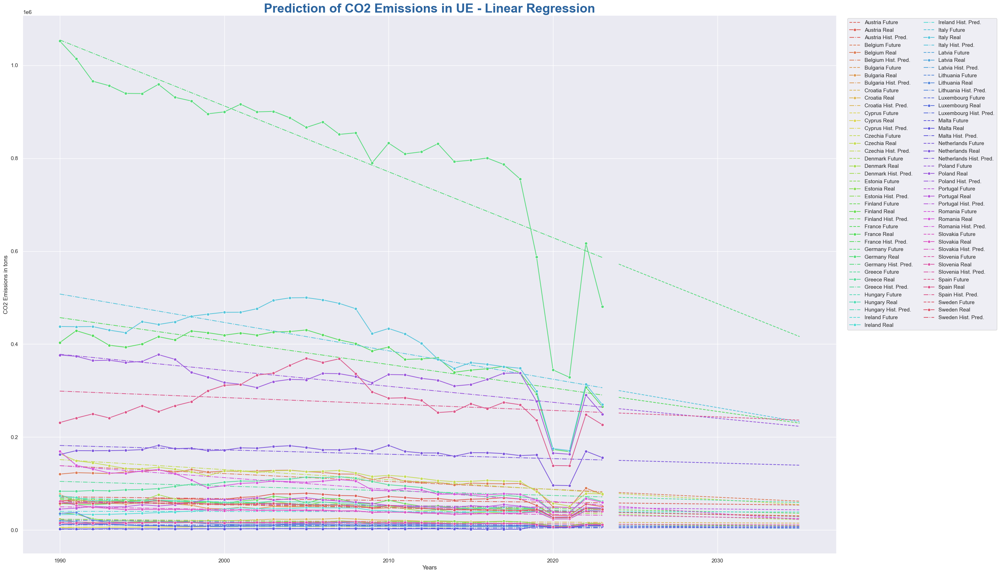

In [65]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_linear_co2['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_linear_co2['Country'].unique()):
    df_prediction_linear_co2_country = df_prediction_linear_co2[df_prediction_linear_co2['Country'] == country]
    df_confronto_linear_co2_country = df_confronto_linear_co2[df_confronto_linear_co2['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_linear_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_linear_co2_country, 
        x='Year', 
        y='Emissions', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_linear_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )

plt.title('Prediction of CO2 Emissions in UE - Linear Regression', fontsize=26, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions in tons')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of CO2 Emissions in UE - Linear Regression', bbox_inches= 'tight')
plt.show()

### Regressioni Polinomiali

#### Degree = 2

In [66]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_co2['Country'].unique():
    df_country = df_melt_co2[df_melt_co2['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Emissions'].values

    # Trasformazione polinomiale di grado 2
    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)

    # Inizializzo i migliori valori
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Country': country,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Country': country,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_poly2_co2 = pd.DataFrame(metric_list)
df_prediction_poly2_co2 = pd.DataFrame(prediction_list)
df_confronto_poly2_co2 = pd.DataFrame(confronto_list)

##### Plot

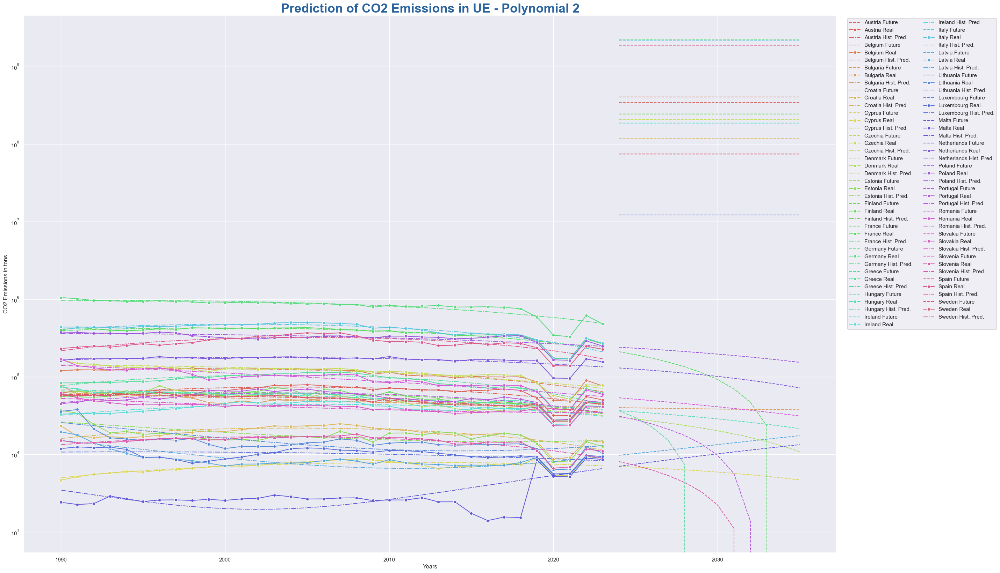

In [67]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_poly2_co2['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_poly2_co2['Country'].unique()):
    df_prediction_poly2_co2_country = df_prediction_poly2_co2[df_prediction_poly2_co2['Country'] == country]
    df_confronto_poly2_co2_country = df_confronto_poly2_co2[df_confronto_poly2_co2['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_poly2_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly2_co2_country, 
        x='Year', 
        y='Emissions', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly2_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.yscale('log')
plt.title('Prediction of CO2 Emissions in UE - Polynomial 2', fontsize=26, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions in tons')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of CO2 Emissions in UE - Polynomial 2', bbox_inches='tight')
plt.show()

#### Degree = 3

In [68]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_co2['Country'].unique():
    df_country = df_melt_co2[df_melt_co2['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Emissions'].values

    # Trasformazione polinomiale di grado 3
    poly = PolynomialFeatures(degree=3)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)

    # Inizializzo i migliori valori
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Country': country,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Country': country,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_poly3_co2 = pd.DataFrame(metric_list)
df_prediction_poly3_co2 = pd.DataFrame(prediction_list)
df_confronto_poly3_co2 = pd.DataFrame(confronto_list)

##### Plot

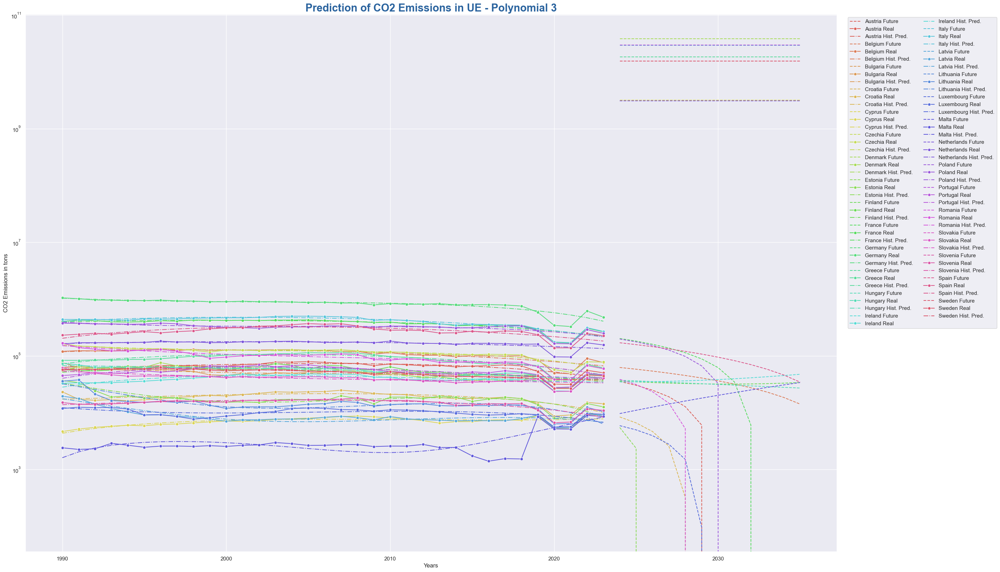

In [69]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_poly3_co2['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_poly3_co2['Country'].unique()):
    df_prediction_poly3_co2_country = df_prediction_poly3_co2[df_prediction_poly3_co2['Country'] == country]
    df_confronto_poly3_co2_country = df_confronto_poly3_co2[df_confronto_poly3_co2['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_poly3_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly3_co2_country, 
        x='Year', 
        y='Emissions', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly3_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.yscale('log')
plt.title('Prediction of CO2 Emissions in UE - Polynomial 3', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions in tons')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of CO2 Emissions in UE - Polynomial 3', bbox_inches='tight')
plt.show()

###  Long Short-Term Memory

In [70]:
# Parametri LSTM
sequence_length = 5
future_steps = 12  # dal 2024 al 2035

def prepare_lstm_data(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)

# DataFrame output
metric_list = []
prediction_list = []
confronto_list = []

for country in df_melt_co2['Country'].unique():
    df_country = df_melt_co2[df_melt_co2['Country'] == country].sort_values('Year')
    years = df_country['Year'].values
    data = df_country['Emissions'].values.reshape(-1, 1)

    if len(data) < sequence_length + 1:
        continue  # troppi pochi dati

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data)

    X, y = prepare_lstm_data(data_scaled, sequence_length)

    # Reshape per LSTM: [samples, timesteps, features]
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Costruzione modello
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(sequence_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=50, batch_size=16, verbose=0)

    # Predizione in-sample
    y_pred_scaled = model.predict(X)
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_true = scaler.inverse_transform(y.reshape(-1, 1))

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    # Predizione futura
    last_sequence = data_scaled[-sequence_length:].flatten().tolist()
    future_preds = []

    for _ in range(future_steps):
        input_seq = np.array(last_sequence[-sequence_length:]).reshape((1, sequence_length, 1))
        next_pred = model.predict(input_seq)[0, 0]
        future_preds.append(next_pred)
        last_sequence.append(next_pred)

    # Inverso trasformazione
    future_preds_inverse = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()

    # Anni futuri
    start_year = df_country['Year'].max() + 1
    future_years = np.arange(start_year, start_year + future_steps)

    # Salva metriche
    metric_list.append({
        'Country': country,
        'Model': 'LSTM',
        'R2': r2,
        'RMSE': rmse
    })

    # Salva predizioni future
    prediction_list.extend([
        {
            'Country': country,
            'Year': int(year),
            'Predicted_Emissions': float(pred)
        }
        for year, pred in zip(future_years, future_preds_inverse)
    ])

    # Salva confronto storico
    confronto_list.extend([
        {
            'Country': country,
            'Year': int(years[i + sequence_length]),
            'Emissions': float(y_true[i]),
            'Predicted_Emissions': float(y_pred[i])
        }
        for i in range(len(y_pred))
    ])

# DataFrame finali
df_metrics_lstm_co2 = pd.DataFrame(metric_list)
df_prediction_lstm_co2 = pd.DataFrame(prediction_list)
df_confronto_lstm_co2 = pd.DataFrame(confronto_list)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/350526323.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


#### Plot

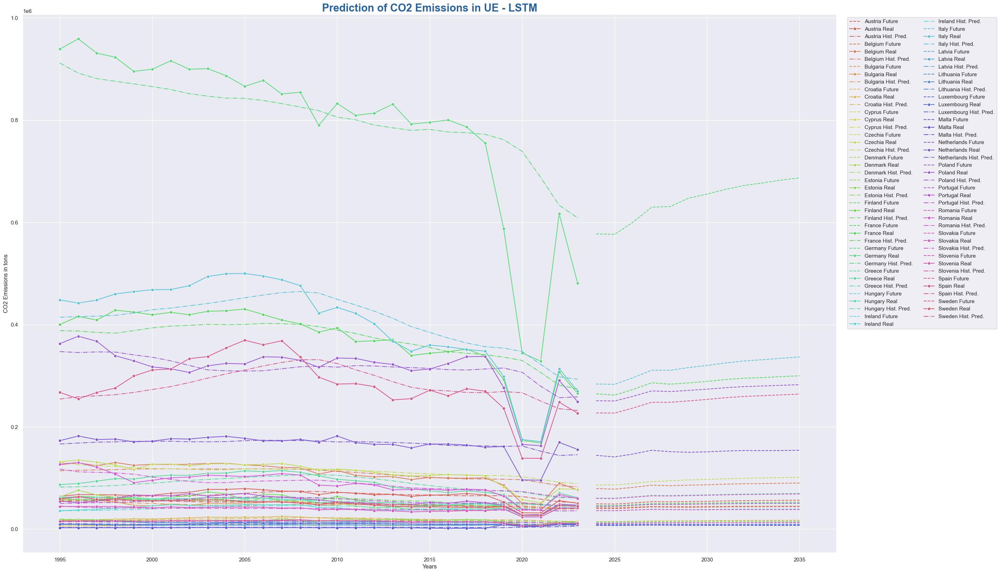

In [71]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_lstm_co2['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_lstm_co2['Country'].unique()):
    df_prediction_lstm_co2_country = df_prediction_lstm_co2[df_prediction_lstm_co2['Country'] == country]
    df_confronto_lstm_co2_country = df_confronto_lstm_co2[df_confronto_lstm_co2['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_lstm_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_lstm_co2_country, 
        x='Year', 
        y='Emissions', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_lstm_co2_country, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
#plt.yscale('log')
plt.title('Prediction of CO2 Emissions in UE - LSTM', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions in tons')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of CO2 Emissions in UE - LSTM', bbox_inches='tight')
plt.show()

### Confronto

In [72]:
df_metrics_linear_co2['Model'] = 'Linear'
df_metrics_poly2_co2['Model'] = 'Poly2'
df_metrics_poly3_co2['Model'] = 'Poly3'
df_metrics_lstm_co2['Model'] = 'LSTM'

# Concatena tutti in un unico DataFrame
df_all_metrics_co2 = pd.concat([
    df_metrics_linear_co2,
    df_metrics_poly2_co2,
    df_metrics_poly3_co2,
    df_metrics_lstm_co2
], ignore_index=True)

# Trova il modello col miglior R² per ogni paese
best_models = df_all_metrics_co2.loc[df_all_metrics_co2.groupby('Country')['R2'].idxmax()]

# Stampa risultati
print(best_models.sort_values('RMSE', ascending=False))

        Country        R2          RMSE fit_intercept copy_X positive  Model
64      Germany  0.835373  67274.014741          True  False    False  Poly3
68        Italy  0.833744  34038.282580          True  False    False  Poly3
79        Spain  0.659474  30878.829238          True   True    False  Poly3
74       Poland  0.608577  29954.208210          True   True    False  Poly3
63       France  0.793335  29779.207299          True   True    False  Poly3
73  Netherlands  0.430938  14141.990046          True  False    False  Poly3
76      Romania  0.870778   9891.901526          True   True    False  Poly3
55      Belgium  0.825321   8673.105249          True   True    False  Poly3
65       Greece  0.803069   8463.161878          True  False    False  Poly3
59      Czechia  0.877319   8322.284646          True  False    False  Poly3
54      Austria  0.646813   6257.129501          True   True    False  Poly3
75     Portugal  0.685709   5466.961830          True  False    False  Poly3

🛠️ Nota tecnica:

Per semplicità e a causa della limitata disponibilità di dati annuali, la previsione è stata effettuata sull’intera serie storica (1990–2023), **senza suddivisione in training e test set**. Il modello è stato addestrato sull’intero dataset al fine di stimare una tendenza continua nel tempo.

La selezione dei parametri ottimali è stata effettuata tramite un ciclo 'for', che ha identificato le combinazioni con il **valore di R² più elevato**.

📊 Tra i modelli testati, **l’LSTM ha mostrato le performance qualitative migliori**, riuscendo a catturare in modo più coerente l’andamento temporale delle emissioni, **nonostante non fosse quello con il valore di R² più alto** rispetto ai modelli regressivi tradizionali (lineare o polinomiale). 

## Energie Rinnovabili

In [73]:
df_renewable_from_2005.drop(columns = ['Variazione_percentuale_media'], inplace = True)
df_melt_renewable = melt_dataframe(df_renewable_from_2005)
df_melt_renewable.rename(columns = {'Emissions' : 'Renewable_Energy_Consumption'}, inplace = True)

### Regressione Lineare

In [74]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_renewable['Country'].unique():
    df_country = df_melt_renewable[df_melt_renewable['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Renewable_Energy_Consumption'].values

    # Inizializzo i migliori valori
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X, y)
                y_pred = model.predict(X)
                y_future = model.predict(future_years)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Country': country,
                        'Year': year,
                        'Predicted_Renewable_Consumption': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Country': country,
                        'Year': int(year),
                        'Renewable_Consumption': float(real),
                        'Predicted_Renewable_Consumption': float(pred)
                    } for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_linear_renewable = pd.DataFrame(metric_list)
df_prediction_linear_renewable = pd.DataFrame(prediction_list)
df_confronto_linear_renewable = pd.DataFrame(confronto_list)

In [75]:
df_metrics_linear_renewable

,Country,R2,RMSE,fit_intercept,copy_X,positive
0,Austria,0.496923,3.116639,True,True,True
1,Belgium,0.820725,2.051643,True,True,False
2,Bulgaria,0.362329,2.416969,True,True,True
3,Croatia,0.152781,7.069715,True,True,True
4,Cyprus,0.824316,1.408474,True,True,False
5,Czechia,0.921627,0.596186,True,True,False
6,Denmark,0.865690,5.202135,True,True,True
7,Estonia,0.791871,0.912999,True,True,True
8,Finland,0.771390,2.586226,True,True,True
9,France,0.638156,1.309668,True,True,True


#### Plot

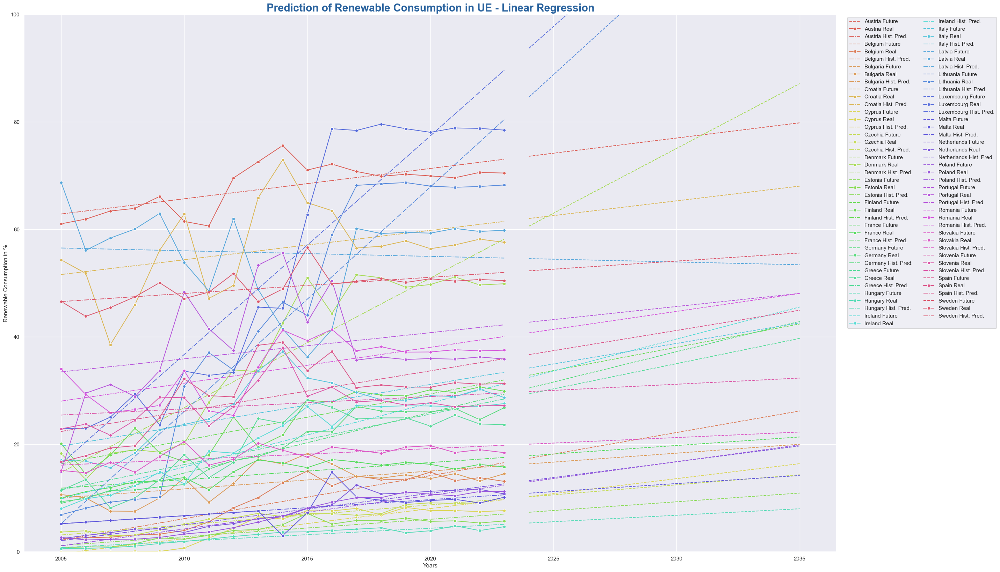

In [76]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_linear_renewable['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_linear_renewable['Country'].unique()):
    df_prediction_linear_renewable_country = df_prediction_linear_renewable[df_prediction_linear_renewable['Country'] == country]
    df_confronto_linear_renewable_country = df_confronto_linear_renewable[df_confronto_linear_renewable['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_linear_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_linear_renewable_country, 
        x='Year', 
        y='Renewable_Consumption', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_linear_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.ylim(0,100)
plt.title('Prediction of Renewable Consumption in UE - Linear Regression', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption in %')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Renewable Consumption in UE - Linear Regression', bbox_inches='tight')
plt.show()

### Regressione Polinomiali

#### degree = 2

In [77]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

# Parametri da testare per LinearRegression
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_renewable['Country'].unique():
    df_country = df_melt_renewable[df_melt_renewable['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Renewable_Energy_Consumption'].values

    # Trasformazione polinomiale di grado 2
    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)

    # Ricerca del miglior modello
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)

                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [
                        {
                            'Country': country,
                            'Year': year,
                            'Predicted_Renewable_Consumption': pred
                        }
                        for year, pred in zip(future_years.flatten(), y_future.flatten())
                    ]

                    best_confronto = [
                        {
                            'Country': country,
                            'Year': int(year),
                            'Renewable_Consumption': float(real),
                            'Predicted_Renewable_Consumption': float(pred)
                        }
                        for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())
                    ]

    # Salva i risultati migliori
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# Crea i DataFrame finali
df_metrics_poly2_renewable = pd.DataFrame(metric_list)
df_prediction_poly2_renewable = pd.DataFrame(prediction_list)
df_confronto_poly2_renewable = pd.DataFrame(confronto_list)

##### Plot

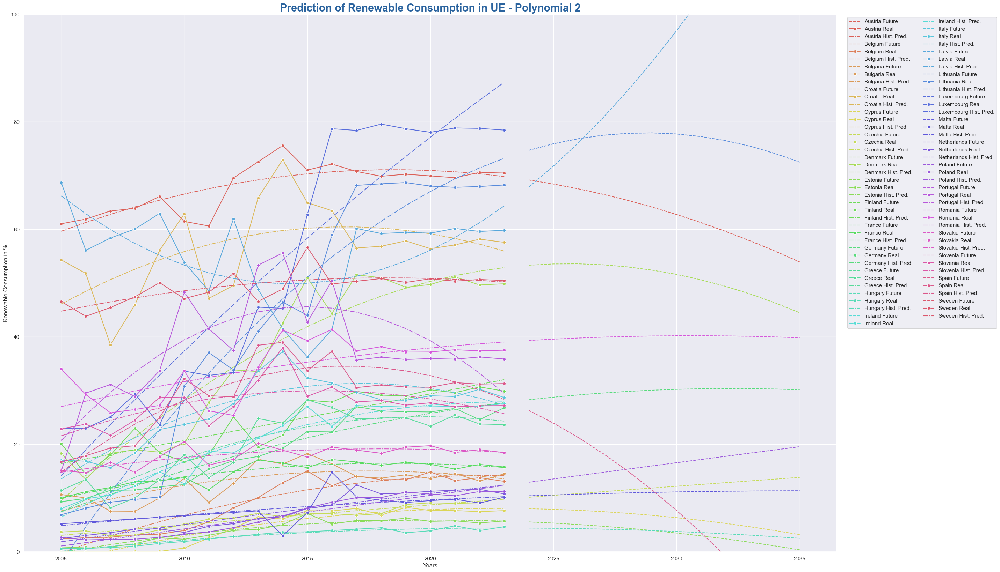

In [78]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_linear_renewable['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_poly2_renewable['Country'].unique()):
    df_prediction_poly2_renewable_country = df_prediction_poly2_renewable[df_prediction_poly2_renewable['Country'] == country]
    df_confronto_poly2_renewable_country = df_confronto_poly2_renewable[df_confronto_poly2_renewable['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_poly2_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly2_renewable_country, 
        x='Year', 
        y='Renewable_Consumption', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly2_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.ylim(0,100)
plt.title('Prediction of Renewable Consumption in UE - Polynomial 2', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption in %')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Renewable Consumption in UE - Polynomial 2', bbox_inches= 'tight')
plt.show()

#### degree = 3

In [79]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

# Grid dei parametri per LinearRegression
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for country in df_melt_renewable['Country'].unique():
    df_country = df_melt_renewable[df_melt_renewable['Country'] == country]

    X = df_country['Year'].astype(int).values.reshape(-1, 1)
    y = df_country['Renewable_Energy_Consumption'].values

    # Trasformazione polinomiale di grado 3
    poly = PolynomialFeatures(degree=3)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)

    # Inizializzazione dei migliori risultati
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    # Ricerca tra le combinazioni di iperparametri
    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)

                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Country': country,
                        'Model': 'Polynomial (deg=3)',
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [
                        {
                            'Country': country,
                            'Year': year,
                            'Predicted_Renewable_Consumption': pred
                        }
                        for year, pred in zip(future_years.flatten(), y_future.flatten())
                    ]

                    best_confronto = [
                        {
                            'Country': country,
                            'Year': int(year),
                            'Renewable_Consumption': float(real),
                            'Predicted_Renewable_Consumption': float(pred)
                        }
                        for year, real, pred in zip(df_country['Year'], y.flatten(), y_pred.flatten())
                    ]

    # Salva solo il miglior modello per ogni paese
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# Crea i DataFrame finali
df_metrics_poly3_renewable = pd.DataFrame(metric_list)
df_prediction_poly3_renewable = pd.DataFrame(prediction_list)
df_confronto_poly3_renewable = pd.DataFrame(confronto_list)

##### Plot

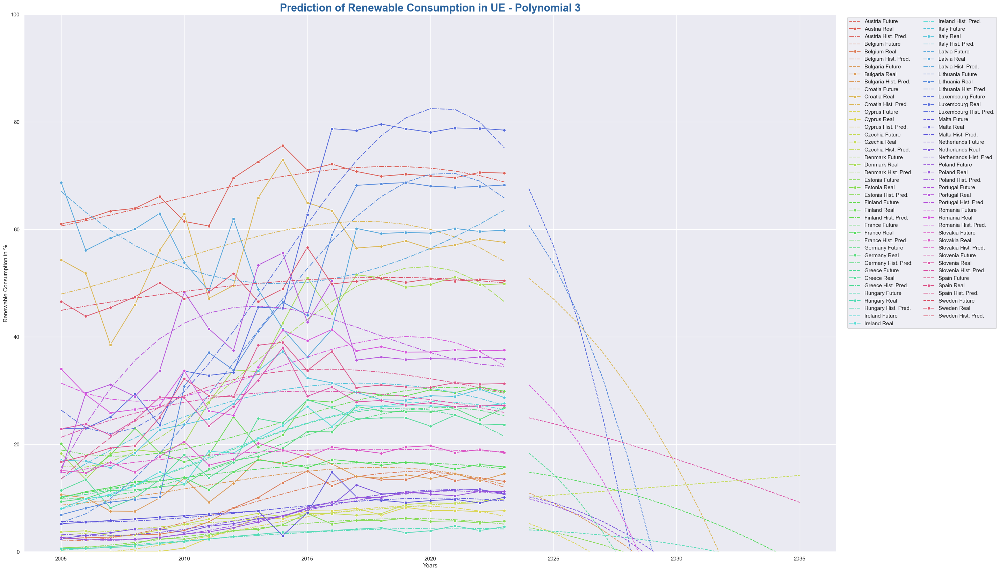

In [80]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_linear_renewable['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_poly3_renewable['Country'].unique()):
    df_prediction_poly3_renewable_country = df_prediction_poly3_renewable[df_prediction_poly3_renewable['Country'] == country]
    df_confronto_poly3_renewable_country = df_confronto_poly3_renewable[df_confronto_poly3_renewable['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_poly3_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly3_renewable_country, 
        x='Year', 
        y='Renewable_Consumption', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly3_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.ylim(0,100)
plt.title('Prediction of Renewable Consumption in UE - Polynomial 3', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption in %')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Renewable Consumption in UE - Polynomial 3', bbox_inches='tight')
plt.show()

## LSTM

In [81]:
# Parametri LSTM
sequence_length = 5
future_steps = 12  # dal 2024 al 2035

def prepare_lstm_data(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)

# DataFrame output
metric_list = []
prediction_list = []
confronto_list = []

for country in df_melt_renewable['Country'].unique():
    df_country = df_melt_renewable[df_melt_renewable['Country'] == country].sort_values('Year')
    years = df_country['Year'].values
    data = df_country['Renewable_Energy_Consumption'].values.reshape(-1, 1)

    if len(data) < sequence_length + 1:
        continue  # troppi pochi dati

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data)

    X, y = prepare_lstm_data(data_scaled, sequence_length)

    # Reshape per LSTM: [samples, timesteps, features]
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Costruzione modello
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(sequence_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=50, batch_size=16, verbose=0)

    # Predizione in-sample
    y_pred_scaled = model.predict(X)
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_true = scaler.inverse_transform(y.reshape(-1, 1))

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    # Predizione futura
    last_sequence = data_scaled[-sequence_length:].flatten().tolist()
    future_preds = []

    for _ in range(future_steps):
        input_seq = np.array(last_sequence[-sequence_length:]).reshape((1, sequence_length, 1))
        next_pred = model.predict(input_seq)[0, 0]
        future_preds.append(next_pred)
        last_sequence.append(next_pred)

    # Inverso trasformazione
    future_preds_inverse = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()

    # Anni futuri
    start_year = df_country['Year'].max() + 1
    future_years = np.arange(start_year, start_year + future_steps)

    # Salva metriche
    metric_list.append({
        'Country': country,
        'Model': 'LSTM',
        'R2': r2,
        'RMSE': rmse
    })

    # Salva predizioni future
    prediction_list.extend([
        {
            'Country': country,
            'Year': int(year),
            'Predicted_Renewable_Consumption': float(pred)
        }
        for year, pred in zip(future_years, future_preds_inverse)
    ])

    # Salva confronto storico
    confronto_list.extend([
        {
            'Country': country,
            'Year': int(years[i + sequence_length]),
            'Renewable_Consumption': float(y_true[i]),
            'Predicted_Renewable_Consumption': float(y_pred[i])
        }
        for i in range(len(y_pred))
    ])

# DataFrame finali
df_metrics_lstm_renewable = pd.DataFrame(metric_list)
df_prediction_lstm_renewable = pd.DataFrame(prediction_list)
df_confronto_lstm_renewable = pd.DataFrame(confronto_list)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Renewable_Consumption': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2167524342.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Renewable_Consumption': float(y_pred[i])


### Plot

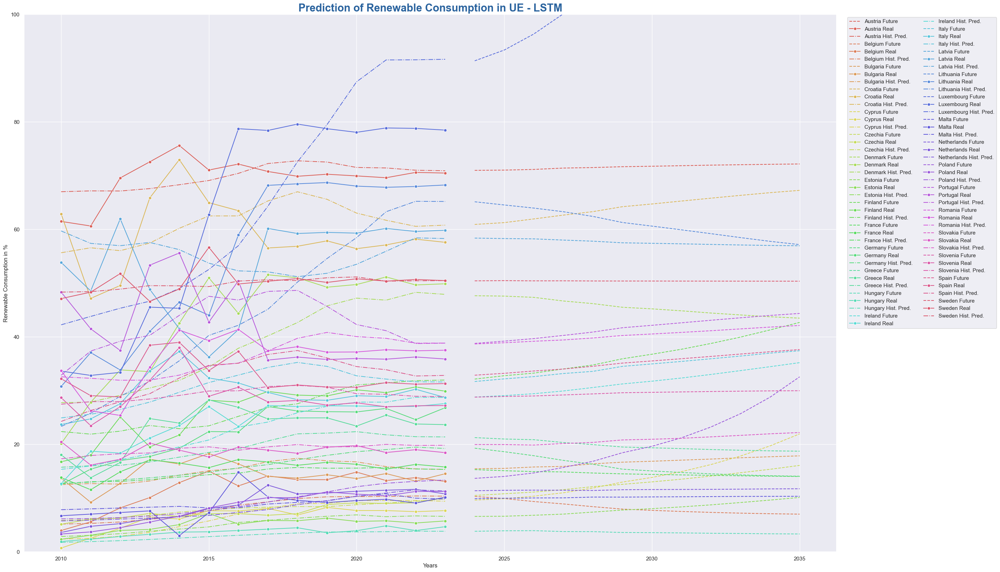

In [82]:
palette = sns.color_palette('hls', n_colors=len(df_confronto_linear_renewable['Country'].unique()))

plt.figure(figsize=(30, 20))

for i, country in enumerate(df_confronto_lstm_renewable['Country'].unique()):
    df_prediction_lstm_renewable_country = df_prediction_lstm_renewable[df_prediction_lstm_renewable['Country'] == country]
    df_confronto_lstm_renewable_country = df_confronto_lstm_renewable[df_confronto_lstm_renewable['Country'] == country]
   
    sns.lineplot(
        data=df_prediction_lstm_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_lstm_renewable_country, 
        x='Year', 
        y='Renewable_Consumption', 
        label=f'{country} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_lstm_renewable_country, 
        x='Year', 
        y='Predicted_Renewable_Consumption', 
        label=f'{country} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )
plt.ylim(0,100)
plt.title('Prediction of Renewable Consumption in UE - LSTM', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption in %')
plt.xlabel('Years')
plt.legend(ncol=2, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Renewable Consumption in UE - LSTM', bbox_inches='tight')
plt.show()

## Confronto

In [83]:
df_metrics_linear_renewable['Model'] = 'Linear'
df_metrics_poly2_renewable['Model'] = 'Poly2'
df_metrics_poly3_renewable['Model'] = 'Poly3'
df_metrics_lstm_renewable['Model'] = 'LSTM'

# Concatena tutti in un unico DataFrame
df_all_metrics_renewable = pd.concat([
    df_metrics_linear_renewable,
    df_metrics_poly2_renewable,
    df_metrics_poly3_renewable,
    df_metrics_lstm_renewable
], ignore_index=True)

# Trova il modello col miglior R² per ogni paese
best_models = df_all_metrics_renewable.loc[df_all_metrics_renewable.groupby('Country')['R2'].idxmax()]

# Stampa risultati
print(best_models.sort_values('RMSE', ascending=False))

        Country        R2      RMSE fit_intercept copy_X positive  Model
69       Latvia  0.389761  6.428079          True  False    False  Poly3
57      Croatia  0.310384  6.378338          True   True    False  Poly3
75     Portugal  0.689668  5.147830          True  False    False  Poly3
71   Luxembourg  0.958008  4.855908          True   True    False  Poly3
70    Lithuania  0.969023  4.202076          True   True    False  Poly3
76      Romania  0.653999  3.153662          True   True    False  Poly3
60      Denmark  0.957510  2.925976          True  False    False  Poly3
79        Spain  0.798877  2.887076          True  False    False  Poly3
68        Italy  0.793307  2.689540          True  False    False  Poly3
78     Slovenia  0.453883  2.628281          True   True    False  Poly3
54      Austria  0.657227  2.572600          True  False    False  Poly3
65       Greece  0.847175  2.450205          True   True    False  Poly3
62      Finland  0.830215  2.228783          True  

# Italy

## Emissioni

### Struttura del DataFrame Italia

In [84]:
df_ch4_italy = df_ch4[df_ch4['Country'] == 'Italy']
df_ch4_italy.drop(columns = ['Country'], inplace = True)
df_ch4_italy.insert(0, 'Gas', 'CH4')

df_co2_italy = df_co2[df_co2['Country'] == 'Italy']
df_co2_italy.drop(columns = ['Country'], inplace = True)
df_co2_italy.insert(0, 'Gas', 'CO2')

#df_ghg_italy = df_ghg[df_ghg['Country'] == 'Italy']
#df_ghg_italy.drop(columns = ['Country'], inplace = True)
#df_ghg_italy.insert(0, 'Gas', 'GHG')

df_n2o_italy = df_n2o[df_n2o['Country'] == 'Italy']
df_n2o_italy.drop(columns = ['Country'], inplace = True)
df_n2o_italy.insert(0, 'Gas', 'N2O')

df_nox_italy = df_nox[df_nox['Country'] == 'Italy']
df_nox_italy.drop(columns = ['Country'], inplace = True)
df_nox_italy.insert(0, 'Gas', 'NOX')

df_so2_italy = df_so2[df_so2['Country'] == 'Italy']
df_so2_italy.drop(columns = ['Country'], inplace = True)
df_so2_italy.insert(0, 'Gas', 'SO2')

df_italy = pd.concat([df_ch4_italy, df_co2_italy, df_n2o_italy, df_nox_italy, df_so2_italy], axis=0)
df_italy.reset_index(drop=True, inplace=True)

df_italy['Total_Emissions_Gas'] = df_italy.iloc[:, 1:].sum(axis=1)

/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2131141814.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ch4_italy.drop(columns = ['Country'], inplace = True)
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2131141814.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_co2_italy.drop(columns = ['Country'], inplace = True)
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2131141814.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/u

In [85]:
df_italy

,Gas,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions_Gas
0,CH4,1929.90,1965.06,1959.08,1971.34,1988.34,2013.03,2032.67,2054.56,2035.22,2034.16,2030.65,2034.75,1969.60,1977.85,1913.15,1933.13,1882.59,1910.54,1893.11,1891.69,1879.20,1822.78,1846.73,1790.83,1756.19,1755.34,1735.97,1746.32,1721.31,1215.95,766.13,717.73,1276.75,954.28,60405.93
1,CO2,438008.80,437538.60,437829.80,430179.96,424581.72,448332.91,442277.41,448044.94,460049.20,464548.48,468442.09,468642.86,476251.24,494183.29,499619.39,500005.68,495124.20,487693.31,476229.97,422624.19,433688.02,422039.48,401554.71,367568.71,347860.80,360088.18,356556.20,351473.93,348085.03,298743.62,175214.36,171009.02,313680.80,269866.00,13837636.90
2,N2O,87.37,90.78,89.22,90.71,88.94,92.55,92.93,96.23,97.15,99.02,96.13,96.79,94.73,94.23,96.92,94.07,77.60,75.19,70.15,66.29,64.02,62.27,63.93,61.37,59.85,59.93,60.74,60.43,59.38,91.24,53.41,50.03,95.80,93.13,2722.53
3,NOX,2127.05,2194.19,2233.25,2129.41,2029.14,1990.80,1918.96,1841.48,1727.59,1629.43,1511.52,1480.70,1424.58,1402.11,1352.45,1296.34,1241.07,1175.09,1061.04,972.21,950.58,906.44,858.79,791.03,770.96,735.43,715.21,674.80,672.30,476.51,272.51,249.20,500.34,419.31,41731.82
4,SO2,1783.86,1672.65,1574.23,1471.75,1389.49,1322.67,1213.90,1138.37,1004.29,903.67,756.22,704.49,623.29,524.48,487.80,409.62,387.84,345.37,290.10,237.46,218.48,196.24,177.97,146.56,131.58,124.49,116.95,115.42,110.45,106.48,56.82,55.58,111.80,96.91,20007.28


### Barplot

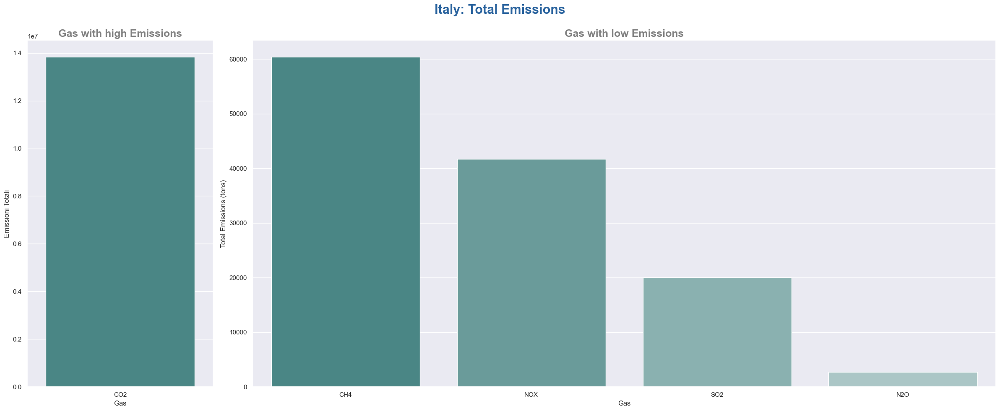

In [86]:
soglia = 70000
df_alti = df_italy[df_italy['Total_Emissions_Gas'] >= soglia].sort_values(by='Total_Emissions_Gas', ascending=False)
df_bassi = df_italy[df_italy['Total_Emissions_Gas'] < soglia].sort_values(by='Total_Emissions_Gas', ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(24, 10), gridspec_kw={'width_ratios': [0.5, 2]})

sns.barplot(
    data=df_alti, 
    x='Gas', 
    y='Total_Emissions_Gas', 
    hue = 'Gas',
    palette= sns.light_palette('#40908E', reverse=True), 
    ax=axes[0]
    )
axes[0].set_title('Gas with high Emissions', fontsize=18, fontweight='bold', color='grey')
axes[0].set_ylabel('Emissioni Totali')
axes[0].set_xlabel('Gas')

sns.barplot(
    data=df_bassi, 
    x='Gas', 
    y='Total_Emissions_Gas', 
    hue= 'Gas',
    palette=sns.light_palette('#40908E', reverse=True), 
    ax=axes[1]
    )
axes[1].set_title('Gas with low Emissions', fontsize=18, fontweight='bold', color='grey')
axes[1].set_ylabel('Total Emissions (tons)')
axes[1].set_xlabel('Gas')
plt.suptitle('Italy: Total Emissions', fontsize=22, fontweight='bold', color='#2A639E')
plt.tight_layout()
plt.savefig('img/Italy: Total Emissions', bbox_inches = 'tight')
plt.show()

### Trend emissioni

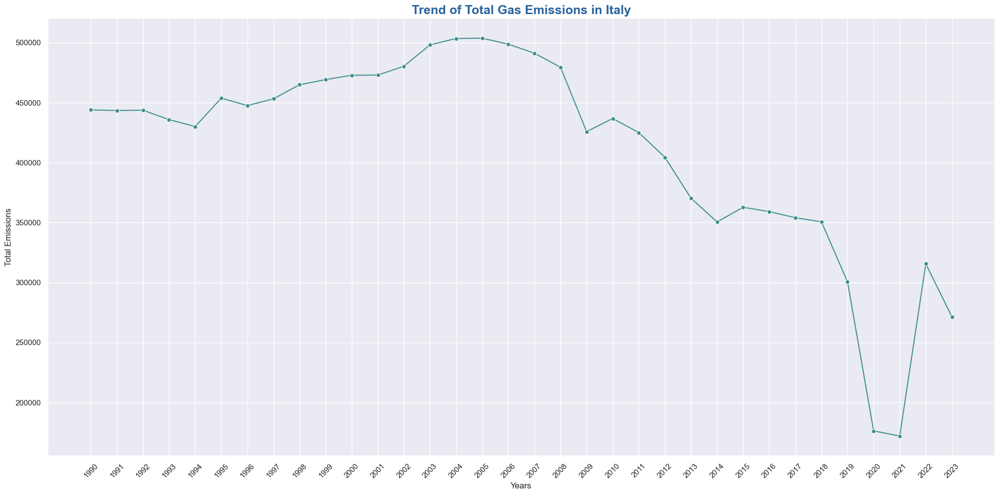

In [87]:
plt.figure(figsize=(20,10))
sns.lineplot(
    x = df_italy.columns[1:-1],
    y = df_italy.iloc[:, 1:-1].sum(axis = 0),
    color = '#40908E',
    marker = 'o'
)
plt.title('Trend of Total Gas Emissions in Italy', fontsize=18, fontweight='bold', color='#2A639E')
plt.xlabel('Years')
plt.ylabel('Total Emissions')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.savefig('img/Trend of Total Gas Emissions in Italy', bbox_inches = 'tight')
plt.show()

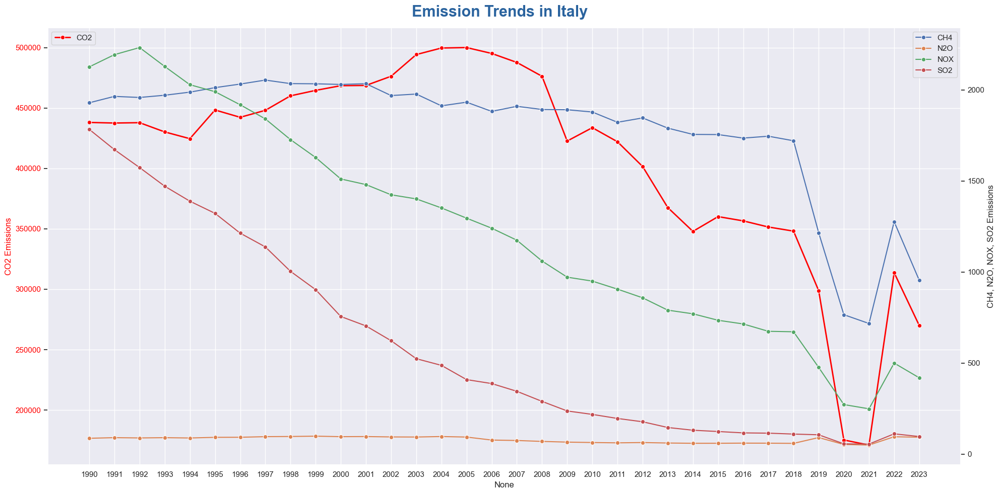

In [88]:
# Colonne degli anni
years = df_italy.columns[1:-1].astype(int)

# Dati CO2
co2_values = df_italy[df_italy['Gas'] == 'CO2'].iloc[0, 1:-1]

# Dati degli altri gas
other_gases = df_italy[df_italy['Gas'] != 'CO2']

# Crea il grafico principale
fig, ax1 = plt.subplots(figsize=(20, 10))

# Primo asse y: CO2
sns.lineplot(
    x = years, 
    y = co2_values, 
    label='CO2', 
    color='red', 
    linewidth=2,
    ax = ax1,
    marker = 'o')
ax1.set_ylabel('CO2 Emissions', color='red')
ax1.tick_params(axis='y', labelcolor='red')

# Secondo asse y: altri gas
ax2 = ax1.twinx()
for i in range(len(other_gases)):
    gas = other_gases.iloc[i]
    sns.lineplot(
        x = years, 
        y  = gas[1:-1], 
        label=gas['Gas'],
        ax = ax2,
        marker = 'o'
)

ax2.set_ylabel('CH4, N2O, NOX, SO2 Emissions')
ax2.tick_params(axis='y')
plt.xticks(years)
# Titolo e legenda
plt.suptitle('Emission Trends in Italy', fontsize=22, fontweight='bold', color='#2A639E')
ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))
ax1.legend(loc='upper left')
plt.tight_layout()

plt.grid()
plt.savefig('img/Emission Trends in Italy', bbox_inches='tight')
plt.show()

## Energie Rinnovabili

### DataFrame

In [89]:
df_renewable_italy = df_renewable[df_renewable['Country']=='Italy']
df_renewable_italy.reset_index(inplace = True, drop=True)
df_renewable_italy.columns = ['Contry'] + [int(col) for col in df_renewable_italy.columns[1:]]
df_renewable_italy

,Contry,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Italy,17.69,22.0,21.91,21.78,22.2,18.94,20.96,20.39,20.23,21.55,20.59,21.67,18.97,17.69,19.18,17.04,16.87,15.66,18.4,22.76,23.7,24.74,27.56,33.67,37.28,32.35,31.43,29.67,28.3,28.2,29.05,28.9,30.26,28.71


### Trend

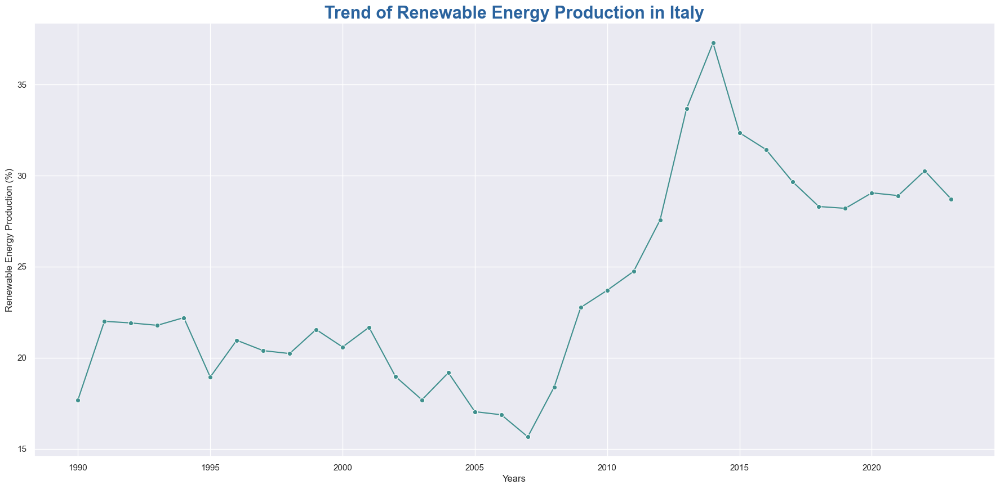

In [90]:
plt.figure(figsize=(22,10))
sns.lineplot(
    x = df_renewable_italy.columns[1:],
    y = df_renewable_italy.iloc[0, 1:],
    color = '#40908E',
    marker = 'o'
)
plt.ylabel('Renewable Energy Production (%)')
plt.xlabel('Years')
plt.title('Trend of Renewable Energy Production in Italy',fontsize=22, fontweight='bold', color='#2A639E')
plt.savefig('img/Trend of Renewable Energy Production in Italy', bbox_inches = 'tight')
plt.show()

## Confronto con Media Europea

In [91]:
df_renewable_mean = df_renewable_from_2005.iloc[:, 1:].mean(axis = 0).reset_index()
df_renewable_mean.columns = ['Year', 'Mean Renewable Energy (%)']
df_renewable_mean

,Year,Mean Renewable Energy (%)
0,2005,18.042963
1,2006,17.707407
2,2007,17.621481
3,2008,18.795185
4,2009,20.369259
5,2010,22.678519
6,2011,21.682222
7,2012,23.885185
8,2013,27.186667
9,2014,28.711481


In [92]:
df_renewable_italy_2005 = df_renewable_italy.loc[:, 2005:]
df_renewable_italy_2005

,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,17.04,16.87,15.66,18.4,22.76,23.7,24.74,27.56,33.67,37.28,32.35,31.43,29.67,28.3,28.2,29.05,28.9,30.26,28.71


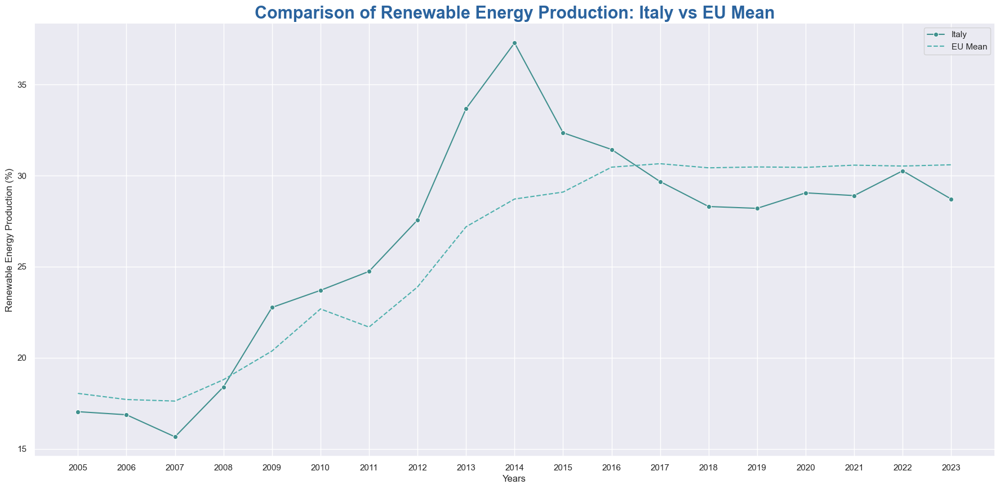

In [93]:
plt.figure(figsize = (22,10))
colors = colors = sns.color_palette(['#40908E', '#4eb0ad'])  
sns.lineplot(
    x = df_renewable_italy_2005.columns.astype(int),
    y = df_renewable_italy_2005.iloc[0, :],
    marker = 'o',
    label = 'Italy',
    color = colors[0]
)
sns.lineplot(
    x = df_renewable_mean['Year'].astype(int),
    y = df_renewable_mean['Mean Renewable Energy (%)'],
    label = 'EU Mean',
    linestyle = '--',
    color = colors[1]
)
plt.xlabel('Years')
plt.ylabel('Renewable Energy Production (%)')
plt.xticks(range(2005,2024))
plt.title('Comparison of Renewable Energy Production: Italy vs EU Mean', fontsize=22, fontweight='bold', color='#2A639E')
plt.savefig('img/Comparison of Renewable Energy Production: Italy vs EU Mean', bbox_inches = 'tight')
plt.show()


# Analisi Predittive

## DataFrame

In [94]:
df_co2_italy = df_italy[df_italy['Gas'] == 'CO2'].iloc[:, :-1]
df_no_co2 = df_italy[df_italy['Gas'] != 'CO2'].iloc[:, :-1]

In [95]:
df_melt_no_co2 = df_no_co2.melt(
    id_vars = 'Gas',
    value_vars = df_no_co2.columns[1:],
    var_name = 'Year',
    value_name = 'Emissions'
)
df_melt_no_co2 = df_melt_no_co2.sort_values(by=['Gas', 'Year']).reset_index(drop=True)
df_melt_no_co2['Year'] = df_melt_no_co2['Year'].astype(int)


In [96]:
df_melt_co2 = df_co2_italy.melt(
    id_vars = 'Gas',
    value_vars = df_co2_italy.columns[1:],
    var_name = 'Year',
    value_name = 'Emissions'
)
df_melt_co2['Year'] = df_melt_co2['Year'].astype(int)

In [97]:
df_renewable_italy

,Contry,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Italy,17.69,22.0,21.91,21.78,22.2,18.94,20.96,20.39,20.23,21.55,20.59,21.67,18.97,17.69,19.18,17.04,16.87,15.66,18.4,22.76,23.7,24.74,27.56,33.67,37.28,32.35,31.43,29.67,28.3,28.2,29.05,28.9,30.26,28.71


In [98]:
df_melt_renewable_italy = df_renewable_italy.melt(
    id_vars = 'Contry',
    value_vars = df_renewable_italy.columns[1:],
    var_name = 'Year',
    value_name = 'Renewable_Consumption'
)
df_melt_renewable_italy.drop('Contry', axis=1, inplace=True)
df_melt_renewable_italy['Year'] = df_melt_renewable_italy['Year'].astype(int)
df_melt_renewable_italy

,Year,Renewable_Consumption
0,1990,17.69
1,1991,22.00
2,1992,21.91
3,1993,21.78
4,1994,22.20
5,1995,18.94
6,1996,20.96
7,1997,20.39
8,1998,20.23
9,1999,21.55


## df_no_co2

### Linear Regression

In [99]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for gas in df_melt_no_co2['Gas'].unique():
    df_gas = df_melt_no_co2[df_melt_no_co2['Gas'] == gas]
    X = df_gas['Year'].values.astype(int).reshape(-1, 1)
    y = df_gas['Emissions'].values

    
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X, y)
                y_pred = model.predict(X)
                y_future = model.predict(future_years)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Gas': gas,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Gas': gas,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Gas': gas,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_gas['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_linear_no_co2 = pd.DataFrame(metric_list)
df_prediction_linear_no_co2 = pd.DataFrame(prediction_list)
df_confronto_linear_no_co2 = pd.DataFrame(confronto_list)

#### Plot

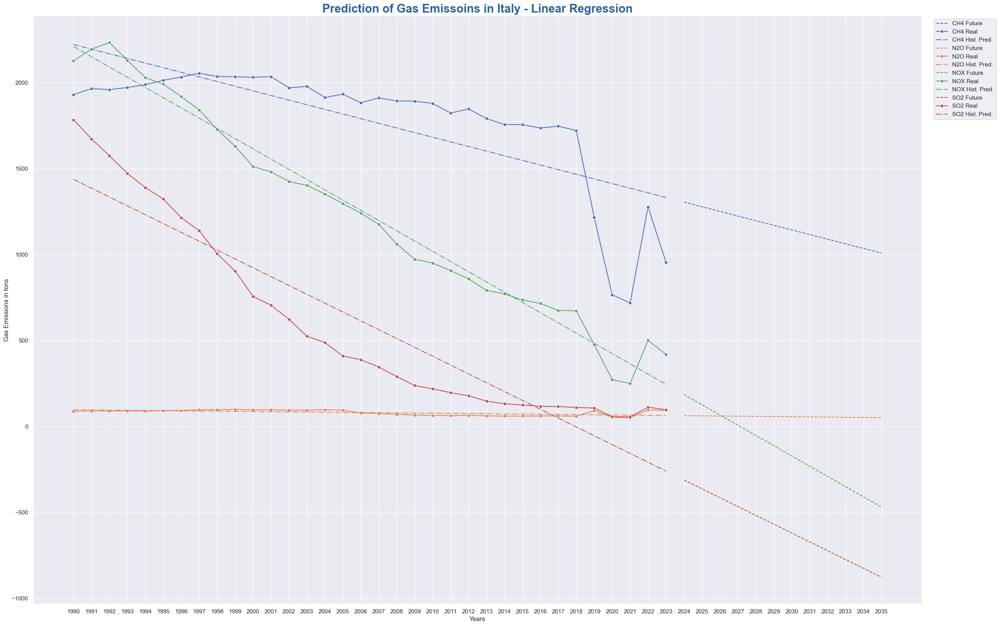

In [100]:
palette = sns.color_palette(n_colors=len(df_confronto_linear_no_co2['Gas'].unique()))

plt.figure(figsize=(30, 20))

for i, gas in enumerate(df_confronto_linear_no_co2['Gas'].unique()):
    df_prediction_linear_no_co2_gas = df_prediction_linear_no_co2[df_prediction_linear_no_co2['Gas'] == gas]
    df_confronto_linear_no_co2_gas = df_confronto_linear_no_co2[df_confronto_linear_no_co2['Gas'] == gas]
   
    sns.lineplot(
        data=df_prediction_linear_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_linear_no_co2_gas, 
        x='Year', 
        y='Emissions', 
        label=f'{gas} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_linear_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )

plt.title('Prediction of Gas Emissoins in Italy - Linear Regression', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Gas Emissions in tons')
plt.xlabel('Years')
plt.xticks(np.arange(1990,2036))
plt.legend(ncol=1, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Gas Emissoins in Italy - Linear Regression', bbox_inches='tight')
plt.show()

### Regression Polynomial

#### Degree = 2

In [101]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for gas in df_melt_no_co2['Gas'].unique():
    df_gas = df_melt_no_co2[df_melt_no_co2['Gas'] == gas]
    X = df_gas['Year'].values.astype(int).reshape(-1, 1)
    y = df_gas['Emissions'].values

    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)
    
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Gas': gas,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Gas': gas,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Gas': gas,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_gas['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_poly2_no_co2 = pd.DataFrame(metric_list)
df_prediction_poly2_no_co2 = pd.DataFrame(prediction_list)
df_confronto_poly2_no_co2 = pd.DataFrame(confronto_list)

##### Plot

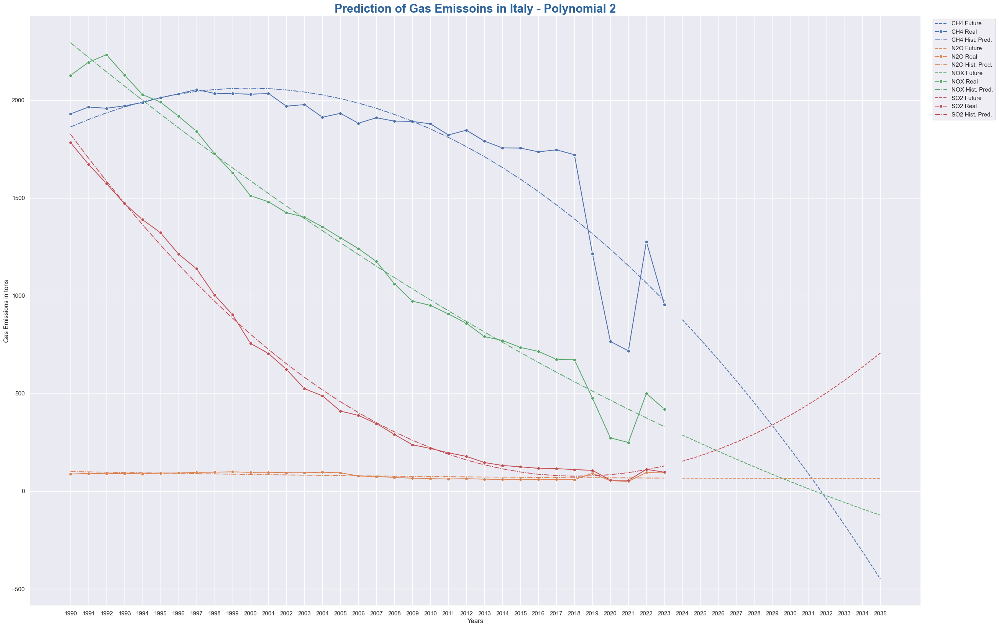

In [102]:
palette = sns.color_palette(n_colors=len(df_confronto_poly2_no_co2['Gas'].unique()))

plt.figure(figsize=(30, 20))

for i, gas in enumerate(df_confronto_poly2_no_co2['Gas'].unique()):
    df_prediction_poly2_no_co2_gas = df_prediction_poly2_no_co2[df_prediction_poly2_no_co2['Gas'] == gas]
    df_confronto_poly2_no_co2_gas = df_confronto_poly2_no_co2[df_confronto_poly2_no_co2['Gas'] == gas]
   
    sns.lineplot(
        data=df_prediction_poly2_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly2_no_co2_gas, 
        x='Year', 
        y='Emissions', 
        label=f'{gas} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly2_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )

plt.title('Prediction of Gas Emissoins in Italy - Polynomial 2', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Gas Emissions in tons')
plt.xlabel('Years')
plt.xticks(np.arange(1990,2036))
plt.legend(ncol=1, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Gas Emissoins in Italy - Polynomial 2', bbox_inches='tight')
plt.show()

#### Degree = 3

In [103]:
future_years = np.arange(2024, 2036).reshape(-1, 1)

metric_list = []
prediction_list = []
confronto_list = []

param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

for gas in df_melt_no_co2['Gas'].unique():
    df_gas = df_melt_no_co2[df_melt_no_co2['Gas'] == gas]
    X = df_gas['Year'].values.astype(int).reshape(-1, 1)
    y = df_gas['Emissions'].values

    poly = PolynomialFeatures(degree=3)
    X_poly = poly.fit_transform(X)
    future_poly = poly.transform(future_years)
    
    best_r2 = -np.inf
    best_metrics = None
    best_predictions = []
    best_confronto = []

    for a in param_grid['fit_intercept']:
        for b in param_grid['copy_X']:
            for c in param_grid['positive']:
                model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
                model.fit(X_poly, y)
                y_pred = model.predict(X_poly)
                y_future = model.predict(future_poly)
                rmse = np.sqrt(mean_squared_error(y, y_pred))
                r2 = r2_score(y, y_pred)

                if r2 > best_r2:
                    best_r2 = r2
                    best_metrics = {
                        'Gas': gas,
                        'R2': r2,
                        'RMSE': rmse,
                        'fit_intercept': a,
                        'copy_X': b,
                        'positive': c
                    }

                    best_predictions = [{
                        'Gas': gas,
                        'Year': year,
                        'Predicted_Emissions': pred
                    } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                    best_confronto = [{
                        'Gas': gas,
                        'Year': int(year),
                        'Emissions': float(real),
                        'Predicted_Emissions': float(pred)
                    } for year, real, pred in zip(df_gas['Year'], y.flatten(), y_pred.flatten())]

    # Salvo solo i migliori risultati
    metric_list.append(best_metrics)
    prediction_list.extend(best_predictions)
    confronto_list.extend(best_confronto)

# DataFrame finali
df_metrics_poly3_no_co2 = pd.DataFrame(metric_list)
df_prediction_poly3_no_co2 = pd.DataFrame(prediction_list)
df_confronto_poly3_no_co2 = pd.DataFrame(confronto_list)

##### Plot

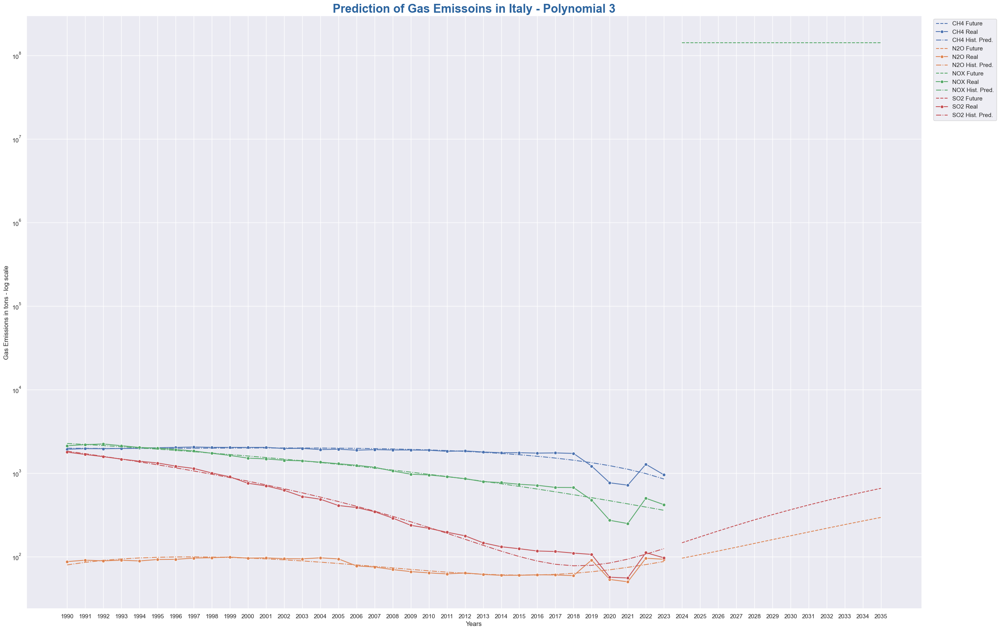

In [104]:
palette = sns.color_palette(n_colors=len(df_confronto_poly3_no_co2['Gas'].unique()))

plt.figure(figsize=(30, 20))

for i, gas in enumerate(df_confronto_poly3_no_co2['Gas'].unique()):
    df_prediction_poly3_no_co2_gas = df_prediction_poly3_no_co2[df_prediction_poly3_no_co2['Gas'] == gas]
    df_confronto_poly3_no_co2_gas = df_confronto_poly3_no_co2[df_confronto_poly3_no_co2['Gas'] == gas]
   
    sns.lineplot(
        data=df_prediction_poly3_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_poly3_no_co2_gas, 
        x='Year', 
        y='Emissions', 
        label=f'{gas} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_poly3_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )

plt.title('Prediction of Gas Emissoins in Italy - Polynomial 3', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Gas Emissions in tons - log scale')
plt.xlabel('Years')
plt.xticks(np.arange(1990,2036))
plt.yscale('log')
plt.legend(ncol=1, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Gas Emissoins in Italy - Polynomial 3', bbox_inches='tight')
plt.show()

### LSTM

In [105]:
# Parametri LSTM
sequence_length = 5
future_steps = 12  # dal 2024 al 2035

def prepare_lstm_data(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)

# DataFrame output
metric_list = []
prediction_list = []
confronto_list = []

for gas in df_melt_no_co2['Gas'].unique():
    df_gas= df_melt_no_co2[df_melt_no_co2['Gas'] == gas].sort_values('Year')
    years = df_gas['Year'].values
    data = df_gas['Emissions'].values.reshape(-1, 1)

    if len(data) < sequence_length + 1:
        continue  # troppi pochi dati

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data)

    X, y = prepare_lstm_data(data_scaled, sequence_length)

    # Reshape per LSTM: [samples, timesteps, features]
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Costruzione modello
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(sequence_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=50, batch_size=16, verbose=0)

    # Predizione in-sample
    y_pred_scaled = model.predict(X)
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_true = scaler.inverse_transform(y.reshape(-1, 1))

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    # Predizione futura
    last_sequence = data_scaled[-sequence_length:].flatten().tolist()
    future_preds = []

    for _ in range(future_steps):
        input_seq = np.array(last_sequence[-sequence_length:]).reshape((1, sequence_length, 1))
        next_pred = model.predict(input_seq)[0, 0]
        future_preds.append(next_pred)
        last_sequence.append(next_pred)

    # Inverso trasformazione
    future_preds_inverse = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()

    # Anni futuri
    start_year = df_gas['Year'].max() + 1
    future_years = np.arange(start_year, start_year + future_steps)

    # Salva metriche
    metric_list.append({
        'Gas': gas,
        'Model': 'LSTM',
        'R2': r2,
        'RMSE': rmse
    })

    # Salva predizioni future
    prediction_list.extend([
        {
            'Gas': gas,
            'Year': int(year),
            'Predicted_Emissions': float(pred)
        }
        for year, pred in zip(future_years, future_preds_inverse)
    ])

    # Salva confronto storico
    confronto_list.extend([
        {
            'Gas': gas,
            'Year': int(years[i + sequence_length]),
            'Emissions': float(y_true[i]),
            'Predicted_Emissions': float(y_pred[i])
        }
        for i in range(len(y_pred))
    ])

# DataFrame finali
df_metrics_lstm_no_co2 = pd.DataFrame(metric_list)
df_prediction_lstm_no_co2 = pd.DataFrame(prediction_list)
df_confronto_lstm_no_co2 = pd.DataFrame(confronto_list)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/2039542520.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


#### Plot

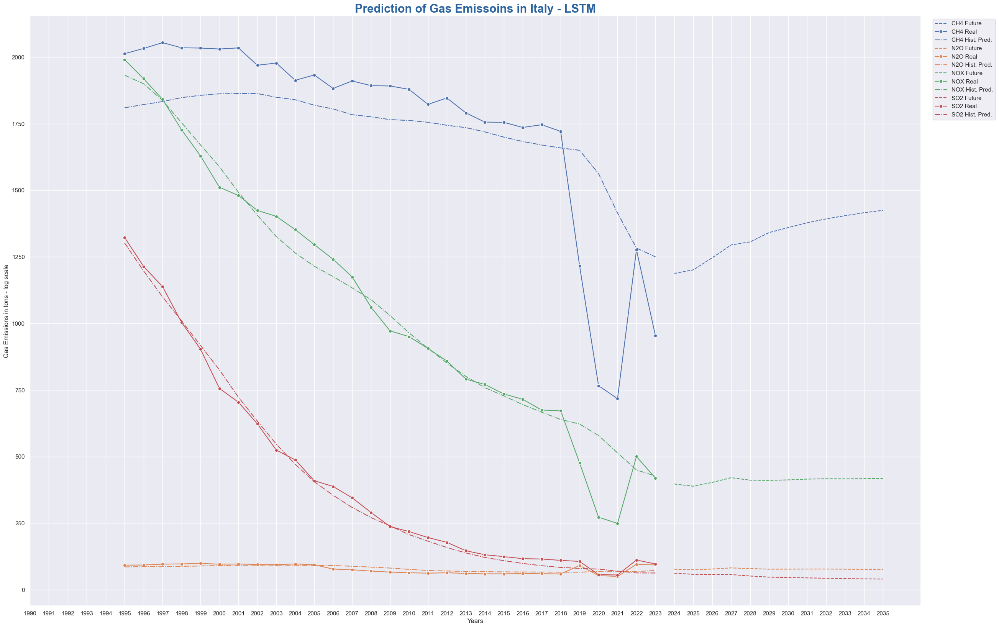

In [106]:
palette = sns.color_palette(n_colors=len(df_confronto_lstm_no_co2['Gas'].unique()))

plt.figure(figsize=(30, 20))

for i, gas in enumerate(df_confronto_lstm_no_co2['Gas'].unique()):
    df_prediction_lstm_no_co2_gas = df_prediction_lstm_no_co2[df_prediction_lstm_no_co2['Gas'] == gas]
    df_confronto_lstm_no_co2_gas = df_confronto_lstm_no_co2[df_confronto_lstm_no_co2['Gas'] == gas]
   
    sns.lineplot(
        data=df_prediction_lstm_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Future', 
        color = palette[i],
        linestyle = '--'
        )
    sns.lineplot(
        data=df_confronto_lstm_no_co2_gas, 
        x='Year', 
        y='Emissions', 
        label=f'{gas} Real',
        color=palette[i],
        linestyle = '-',
        marker = 'o'
        )
    sns.lineplot(
        data=df_confronto_lstm_no_co2_gas, 
        x='Year', 
        y='Predicted_Emissions', 
        label=f'{gas} Hist. Pred.', 
        color = palette[i],
        linestyle = '-.'
    )

plt.title('Prediction of Gas Emissoins in Italy - LSTM', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Gas Emissions in tons - log scale')
plt.xlabel('Years')
plt.xticks(np.arange(1990,2036))
#plt.yscale('log')
plt.legend(ncol=1, bbox_to_anchor=(1.01, 1), loc='upper left')
plt.savefig('img/Prediction of Gas Emissoins in Italy - LSTM', bbox_inches='tight')
plt.show()

## df_co2_italy

### Linear Regression

In [107]:
# Dati
X = df_melt_co2['Year'].values.reshape(-1, 1)
y = df_melt_co2['Emissions'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X, y)
            y_pred = model.predict(X)
            y_future = model.predict(future_years)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Gas': 'CO2',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Predicted_Emissions': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Emissions': float(real),
                    'Predicted_Emissions': float(pred)
                } for year, real, pred in zip(df_melt_co2['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_linear_co2_italy = pd.DataFrame([best_metrics])
df_prediction_linear_co2_italy = pd.DataFrame(best_predictions)
df_confronto_linear_co2_italy = pd.DataFrame(best_confronto)

#### Plot

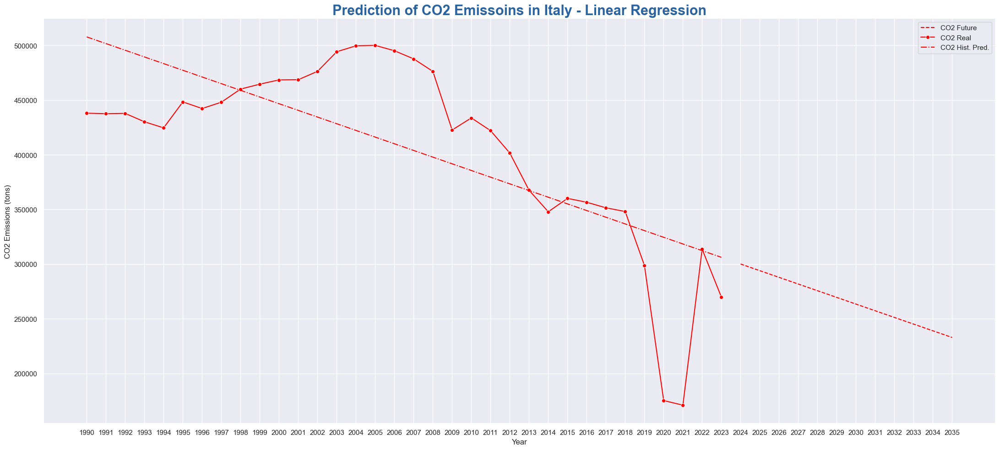

In [108]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_linear_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Future', 
    color='red',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_linear_co2_italy, 
    x='Year', 
    y='Emissions', 
    label='CO2 Real', 
    color='red',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_linear_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Hist. Pred.', 
    color='red',
    linestyle='-.'
)

plt.title('Prediction of CO2 Emissoins in Italy - Linear Regression', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions (tons)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.savefig('img/Prediction of CO2 Emissoins in Italy - Linear Regression', bbox_inches='tight')
plt.show()

### Polynomial Regession

##### Degree = 2

In [109]:
# Dati
X = df_melt_co2['Year'].values.reshape(-1, 1)
y = df_melt_co2['Emissions'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
future_poly = poly.transform(future_years)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X_poly, y)
            y_pred = model.predict(X_poly)
            y_future = model.predict(future_poly)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Gas': 'CO2',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Predicted_Emissions': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Emissions': float(real),
                    'Predicted_Emissions': float(pred)
                } for year, real, pred in zip(df_melt_co2['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_poly2_co2_italy = pd.DataFrame([best_metrics])
df_prediction_poly2_co2_italy = pd.DataFrame(best_predictions)
df_confronto_poly2_co2_italy = pd.DataFrame(best_confronto)

In [110]:
# Dati
X = df_melt_co2['Year'].values.reshape(-1, 1)
y = df_melt_co2['Emissions'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
future_poly = poly.transform(future_years)




model = LinearRegression()
model.fit(X_poly, y)
y_pred = model.predict(X_poly)
y_future = model.predict(future_poly)
rmse = np.sqrt(mean_squared_error(y, y_pred))
r2 = r2_score(y, y_pred)

best_metrics = {
        'Gas': 'CO2',
        'R2': r2,
        'RMSE': rmse,
        'fit_intercept': a,
        'copy_X': b,
        'positive': c
    }

best_predictions = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Predicted_Emissions': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

best_confronto = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Emissions': float(real),
                    'Predicted_Emissions': float(pred)
                } for year, real, pred in zip(df_melt_co2['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_poly2_co2_italy = pd.DataFrame([best_metrics])
df_prediction_poly2_co2_italy = pd.DataFrame(best_predictions)
df_confronto_poly2_co2_italy = pd.DataFrame(best_confronto)

##### Plot

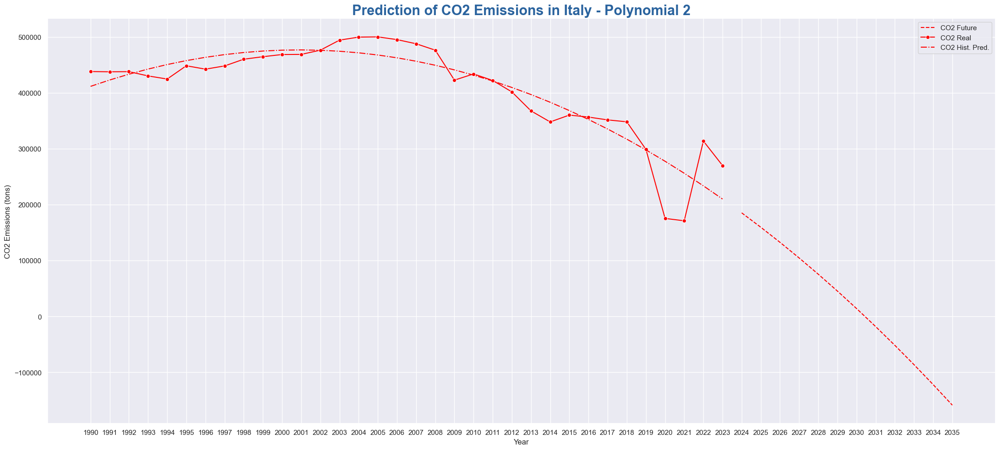

In [111]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_poly2_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Future', 
    color='red',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_poly2_co2_italy, 
    x='Year', 
    y='Emissions', 
    label='CO2 Real', 
    color='red',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_poly2_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Hist. Pred.', 
    color='red',
    linestyle='-.'
)

plt.title('Prediction of CO2 Emissions in Italy - Polynomial 2', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions (tons)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Prediction of CO2 Emissions in Italy - Polynomial 2', bbox_inches='tight')
plt.show()

#### Degree = 3

In [112]:
# Dati
X = df_melt_co2['Year'].values.reshape(-1, 1)
y = df_melt_co2['Emissions'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

poly = PolynomialFeatures(degree=3)
X_poly = poly.fit_transform(X)
future_poly = poly.transform(future_years)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X_poly, y)
            y_pred = model.predict(X_poly)
            y_future = model.predict(future_poly)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Gas': 'CO2',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Predicted_Emissions': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Gas': 'CO2',
                    'Year': int(year),
                    'Emissions': float(real),
                    'Predicted_Emissions': float(pred)
                } for year, real, pred in zip(df_melt_co2['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_poly3_co2_italy = pd.DataFrame([best_metrics])
df_prediction_poly3_co2_italy = pd.DataFrame(best_predictions)
df_confronto_poly3_co2_italy = pd.DataFrame(best_confronto)

##### Plot

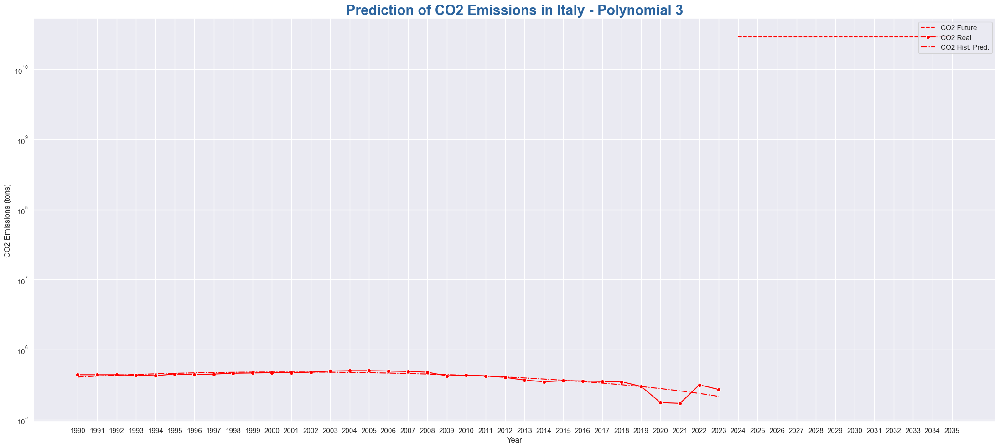

In [113]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_poly3_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Future', 
    color='red',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_poly3_co2_italy, 
    x='Year', 
    y='Emissions', 
    label='CO2 Real', 
    color='red',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_poly3_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Hist. Pred.', 
    color='red',
    linestyle='-.'
)

plt.title('Prediction of CO2 Emissions in Italy - Polynomial 3', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions (tons)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.yscale('log')
plt.savefig('img/Prediction of CO2 Emissions in Italy - Polynomial 3', bbox_inches='tight')
plt.show()

### LSTM

In [114]:
# Parametri LSTM
sequence_length = 5
future_steps = 12  # dal 2024 al 2035

def prepare_lstm_data(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)

# DataFrame output
metric_list = []
prediction_list = []
confronto_list = []

for gas in df_melt_co2['Gas'].unique():
    df_gas= df_melt_co2[df_melt_co2['Gas'] == gas].sort_values('Year')
    years = df_gas['Year'].values
    data = df_gas['Emissions'].values.reshape(-1, 1)

    if len(data) < sequence_length + 1:
        continue  # troppi pochi dati

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data)

    X, y = prepare_lstm_data(data_scaled, sequence_length)

    # Reshape per LSTM: [samples, timesteps, features]
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Costruzione modello
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(sequence_length, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=50, batch_size=16, verbose=0)

    # Predizione in-sample
    y_pred_scaled = model.predict(X)
    y_pred = scaler.inverse_transform(y_pred_scaled)
    y_true = scaler.inverse_transform(y.reshape(-1, 1))

    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    # Predizione futura
    last_sequence = data_scaled[-sequence_length:].flatten().tolist()
    future_preds = []

    for _ in range(future_steps):
        input_seq = np.array(last_sequence[-sequence_length:]).reshape((1, sequence_length, 1))
        next_pred = model.predict(input_seq)[0, 0]
        future_preds.append(next_pred)
        last_sequence.append(next_pred)

    # Inverso trasformazione
    future_preds_inverse = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()

    # Anni futuri
    start_year = df_gas['Year'].max() + 1
    future_years = np.arange(start_year, start_year + future_steps)

    # Salva metriche
    metric_list.append({
        'Gas': gas,
        'Model': 'LSTM',
        'R2': r2,
        'RMSE': rmse
    })

    # Salva predizioni future
    prediction_list.extend([
        {
            'Gas': gas,
            'Year': int(year),
            'Predicted_Emissions': float(pred)
        }
        for year, pred in zip(future_years, future_preds_inverse)
    ])

    # Salva confronto storico
    confronto_list.extend([
        {
            'Gas': gas,
            'Year': int(years[i + sequence_length]),
            'Emissions': float(y_true[i]),
            'Predicted_Emissions': float(y_pred[i])
        }
        for i in range(len(y_pred))
    ])

# DataFrame finali
df_metrics_lstm_co2_italy = pd.DataFrame(metric_list)
df_prediction_lstm_co2_italy = pd.DataFrame(prediction_list)
df_confronto_lstm_co2_italy = pd.DataFrame(confronto_list)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/4139898308.py:88: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Emissions': float(y_true[i]),
/var/folders/66/q4b4qfs523sbvjt3nltxw5k00000gn/T/ipykernel_5486/4139898308.py:89: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  'Predicted_Emissions': float(y_pred[i])


#### Plot

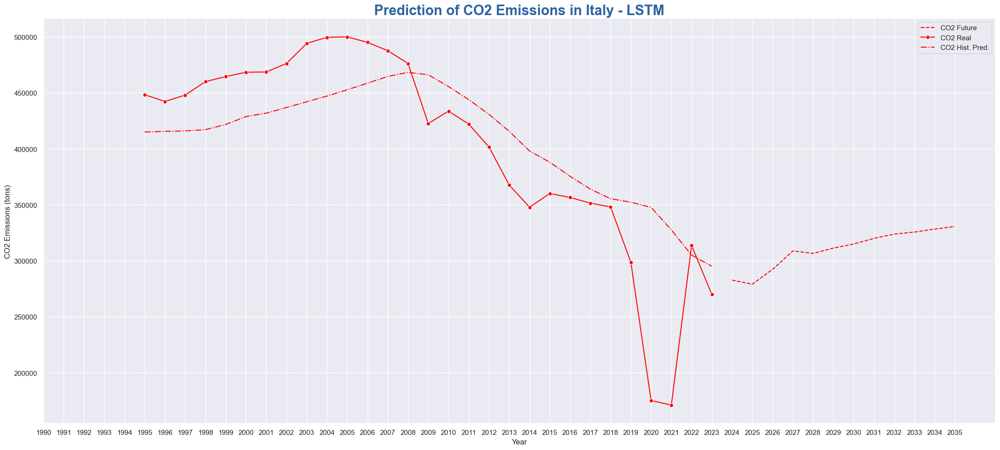

In [115]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_lstm_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Future', 
    color='red',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_lstm_co2_italy, 
    x='Year', 
    y='Emissions', 
    label='CO2 Real', 
    color='red',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_lstm_co2_italy, 
    x='Year', 
    y='Predicted_Emissions', 
    label='CO2 Hist. Pred.', 
    color='red',
    linestyle='-.'
)

plt.title('Prediction of CO2 Emissions in Italy - LSTM', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('CO2 Emissions (tons)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Prediction of CO2 Emissions in Italy - LSTM', bbox_inches='tight')
plt.show()

## df_renewable

### Linear Regression

In [116]:
# Dati
X = df_melt_renewable_italy['Year'].values.reshape(-1, 1)
y = df_melt_renewable_italy['Renewable_Consumption'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X, y)
            y_pred = model.predict(X)
            y_future = model.predict(future_years)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Variable': 'Renewable_Consumption',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Renewable_Consumption': float(real),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, real, pred in zip(df_melt_renewable_italy['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_linear_renewable_italy = pd.DataFrame([best_metrics])
df_prediction_linear_renewable_italy = pd.DataFrame(best_predictions)
df_confronto_linear_renewable_italy = pd.DataFrame(best_confronto)

#### Plot

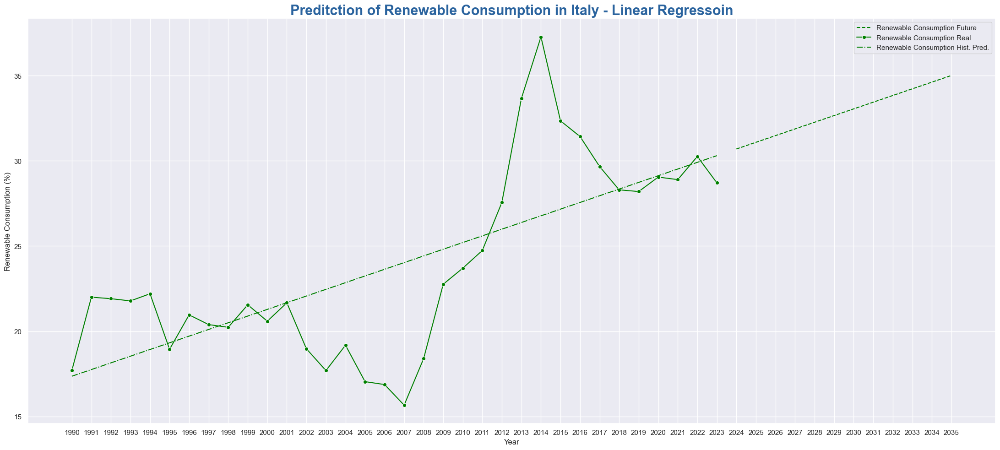

In [117]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_linear_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Future', 
    color='green',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_linear_renewable_italy, 
    x='Year', 
    y='Renewable_Consumption', 
    label='Renewable Consumption Real', 
    color='green',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_linear_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Hist. Pred.', 
    color='green',
    linestyle='-.'
)

plt.title('Preditction of Renewable Consumption in Italy - Linear Regressoin', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption (%)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Preditction of Renewable Consumption in Italy - Linear Regressoin', bbox_inches='tight')
plt.show()

## Polynomial Regression

#### Degree = 2

In [118]:
# Dati
X = df_melt_renewable_italy['Year'].values.reshape(-1, 1)
y = df_melt_renewable_italy['Renewable_Consumption'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
future_poly = poly.transform(future_years)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X_poly, y)
            y_pred = model.predict(X_poly)
            y_future = model.predict(future_poly)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Variable': 'Renewable_Consumption',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Renewable_Consumption': float(real),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, real, pred in zip(df_melt_renewable_italy['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_poly2_renewable_italy = pd.DataFrame([best_metrics])
df_prediction_poly2_renewable_italy = pd.DataFrame(best_predictions)
df_confronto_poly2_renewable_italy = pd.DataFrame(best_confronto)

##### Plot

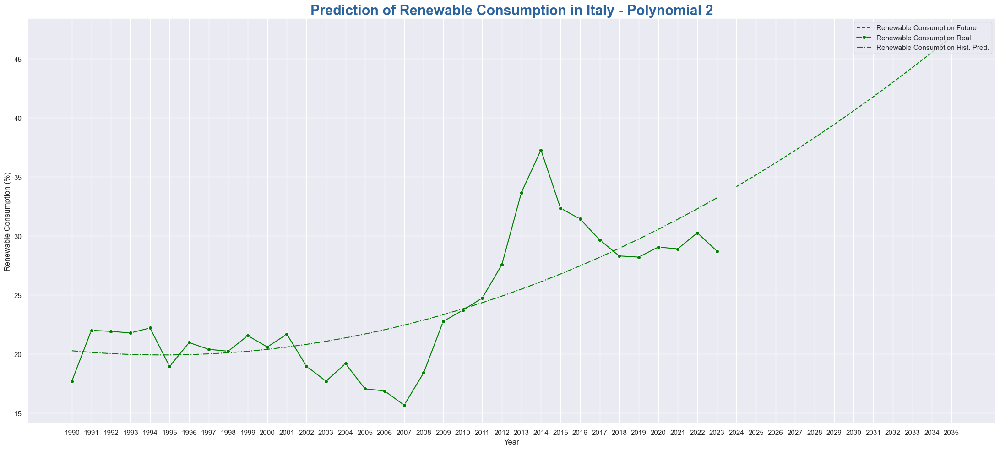

In [119]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_poly2_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Future', 
    color='green',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_poly2_renewable_italy, 
    x='Year', 
    y='Renewable_Consumption', 
    label='Renewable Consumption Real', 
    color='green',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_poly2_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Hist. Pred.', 
    color='green',
    linestyle='-.'
)

plt.title('Prediction of Renewable Consumption in Italy - Polynomial 2', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption (%)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Prediction of Renewable Consumption in Italy - Polynomial 2', bbox_inches='tight')
plt.show()

#### Degree = 3

In [120]:
# Dati
X = df_melt_renewable_italy['Year'].values.reshape(-1, 1)
y = df_melt_renewable_italy['Renewable_Consumption'].values

# Anni futuri
future_years = np.arange(2024, 2036).reshape(-1, 1)

poly = PolynomialFeatures(degree=3)
X_poly = poly.fit_transform(X)
future_poly = poly.transform(future_years)

# Griglia parametri
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    #'positive': [True, False]
}

# Inizializzazione
best_r2 = -np.inf
best_metrics = None
best_predictions = []
best_confronto = []

# Grid search
for a in param_grid['fit_intercept']:
    for b in param_grid['copy_X']:
        #for c in param_grid['positive']:
            model = LinearRegression(fit_intercept=a, copy_X=b, positive=c)
            model.fit(X_poly, y)
            y_pred = model.predict(X_poly)
            y_future = model.predict(future_poly)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            r2 = r2_score(y, y_pred)

            if r2 > best_r2:
                best_r2 = r2
                best_metrics = {
                    'Variable': 'Renewable_Consumption',
                    'R2': r2,
                    'RMSE': rmse,
                    'fit_intercept': a,
                    'copy_X': b,
                    'positive': c
                }

                best_predictions = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, pred in zip(future_years.flatten(), y_future.flatten())]

                best_confronto = [{
                    'Variable': 'Renewable_Consumption',
                    'Year': int(year),
                    'Renewable_Consumption': float(real),
                    'Predicted_Renewable_Consumption': float(pred)
                } for year, real, pred in zip(df_melt_renewable_italy['Year'], y, y_pred)]

# Output in DataFrame
df_metrics_poly3_renewable_italy = pd.DataFrame([best_metrics])
df_prediction_poly3_renewable_italy = pd.DataFrame(best_predictions)
df_confronto_poly3_renewable_italy = pd.DataFrame(best_confronto)

##### Plot

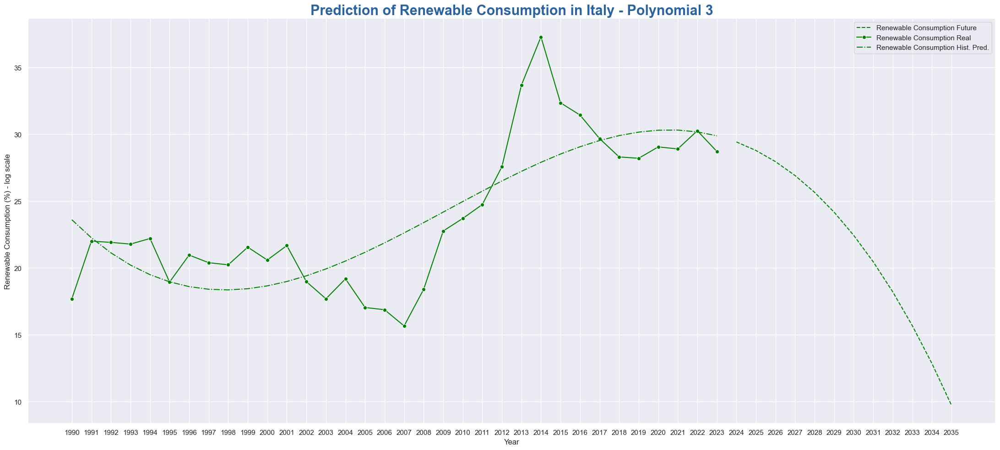

In [121]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_poly3_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Future', 
    color='green',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_poly3_renewable_italy, 
    x='Year', 
    y='Renewable_Consumption', 
    label='Renewable Consumption Real', 
    color='green',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_poly3_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Hist. Pred.', 
    color='green',
    linestyle='-.'
)

plt.title('Prediction of Renewable Consumption in Italy - Polynomial 3', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption (%) - log scale')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Prediction of Renewable Consumption in Italy - Polynomial 3', bbox_inches='tight')
plt.show()

## LSTM

In [122]:
# Parametri
sequence_length = 5
future_steps = 12  # 2024–2035

def prepare_lstm_data(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i + sequence_length])
        y.append(data[i + sequence_length])
    return np.array(X), np.array(y)

# Ordina i dati per anno
df_sorted = df_melt_renewable_italy.sort_values('Year')
years = df_sorted['Year'].values
data = df_sorted['Renewable_Consumption'].values.reshape(-1, 1)

# Scaling
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)

# Prepara i dati
X, y = prepare_lstm_data(data_scaled, sequence_length)
X = X.reshape((X.shape[0], X.shape[1], 1))

# Modello LSTM
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(sequence_length, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X, y, epochs=50, batch_size=16, verbose=0)

# Predizione sui dati noti
y_pred_scaled = model.predict(X)
y_pred = scaler.inverse_transform(y_pred_scaled)
y_true = scaler.inverse_transform(y.reshape(-1, 1))

r2 = r2_score(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

# Predizione futura
last_sequence = data_scaled[-sequence_length:].flatten().tolist()
future_preds = []

for _ in range(future_steps):
    input_seq = np.array(last_sequence[-sequence_length:]).reshape((1, sequence_length, 1))
    next_pred = model.predict(input_seq)[0, 0]
    future_preds.append(next_pred)
    last_sequence.append(next_pred)

future_preds_inverse = scaler.inverse_transform(np.array(future_preds).reshape(-1, 1)).flatten()
future_years = np.arange(df_sorted['Year'].max() + 1, df_sorted['Year'].max() + 1 + future_steps)

# DataFrame metriche
df_metrics_lstm_renewable_italy = pd.DataFrame([{
    'Variable': 'Renewable_Consumption',
    'Model': 'LSTM',
    'R2': r2,
    'RMSE': rmse
}])

# DataFrame predizioni future
df_prediction_lstm_renewable_italy = pd.DataFrame({
    'Year': future_years,
    'Predicted_Renewable_Consumption': future_preds_inverse,
    'Variable': 'Renewable_Consumption'
})

# DataFrame confronto storico
df_confronto_lstm_renewable_italy = pd.DataFrame({
    'Year': years[sequence_length:],
    'Renewable_Consumption': y_true.flatten(),
    'Predicted_Renewable_Consumption': y_pred.flatten(),
    'Variable': 'Renewable_Consumption'
})

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


### Plot

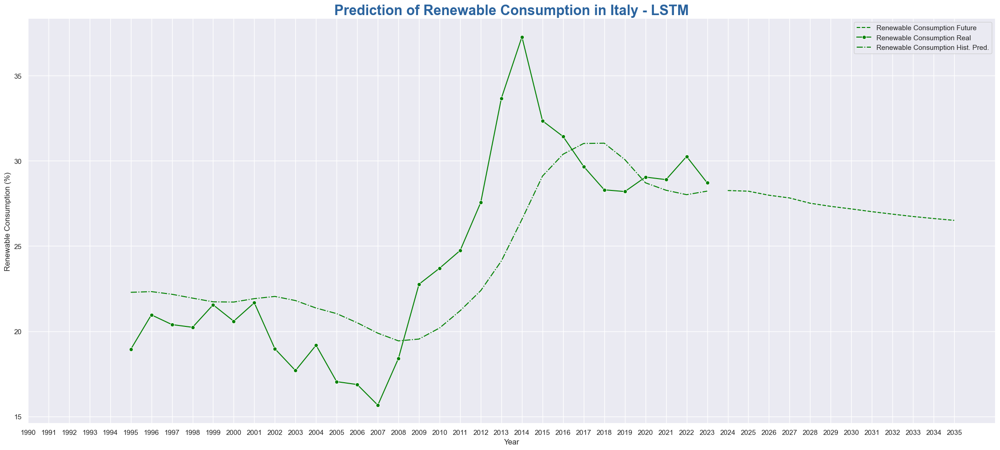

In [123]:
plt.figure(figsize=(22,10))

# Linea predizione futura
sns.lineplot(
    data=df_prediction_lstm_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Future', 
    color='green',
    linestyle='--'
)

# Dati reali
sns.lineplot(
    data=df_confronto_lstm_renewable_italy, 
    x='Year', 
    y='Renewable_Consumption', 
    label='Renewable Consumption Real', 
    color='green',
    linestyle='-',
    marker='o'
)

# Predizione su anni noti
sns.lineplot(
    data=df_confronto_lstm_renewable_italy, 
    x='Year', 
    y='Predicted_Renewable_Consumption', 
    label='Renewable Consumption Hist. Pred.', 
    color='green',
    linestyle='-.'
)

plt.title('Prediction of Renewable Consumption in Italy - LSTM', fontsize=22, fontweight='bold', color='#2A639E')
plt.ylabel('Renewable Consumption (%)')
plt.xlabel('Year')
plt.xticks(np.arange(1990, 2036))
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
#plt.yscale('log')
plt.savefig('img/Prediction of Renewable Consumption in Italy - LSTM', bbox_inches = 'tight')
plt.show()